In [1]:
import importlib
importlib.reload(importlib.import_module('analysis_utils_msr'))
import warnings
import pandas as pd
import numpy as np
from analysis_utils_msr import sum_individual_mutation_scores, assess_grouped_spearman, assess_grouped_gain, assess_grouped_ndcg, assess_classification_metric, add_additive_predictions, unify_similar_columns
import pandas as pd
import numpy as np
from functools import partial

# notebook display options
warnings.filterwarnings('ignore')

# Get all raw predictions
dataset = 'hyperopt_splits-val'
base_path = f'~/software/esm-msr/analysis_notebooks/predictions/{dataset}'
msr_base_1 = f'{base_path}/msr_dual_ensemble_small_large/1/epoch=05-val_rho_combined_avg=0.805.ckpt'
msr_base_2 = f'{base_path}/msr_dual_ensemble_small_large/2/epoch=04-val_rho_combined_avg=0.809.ckpt'
msr_base_3 = f'{base_path}/msr_dual_ensemble_small_large/3/epoch=03-val_rho_combined_avg=0.807.ckpt'

chain_base_1 = f'{base_path}/msr_dual_ensemble_small_large_chain/1/epoch=04-val_rho_combined_avg=0.818.ckpt'
chain_base_2 = f'{base_path}/msr_dual_ensemble_small_large_chain/2/epoch=01-val_rho_combined_avg=0.816.ckpt'
chain_base_3 = f'{base_path}/msr_dual_ensemble_small_large_chain/3/epoch=02-val_rho_combined_avg=0.817.ckpt'

mm_base_1 = f'{base_path}/msr_dual_ensemble_small_large_mm/1/epoch=02-val_rho_combined_avg=0.808.ckpt'
mm_base_2 = f'{base_path}/msr_dual_ensemble_small_large_mm/2/epoch=02-val_rho_combined_avg=0.811.ckpt'
mm_base_3 = f'{base_path}/msr_dual_ensemble_small_large_mm/3/epoch=02-val_rho_combined_avg=0.807.ckpt'

single_base_1 = f'{base_path}/msr_dual_ensemble_small_large_singles/1/epoch=05-val_rho_combined_avg=0.809.ckpt'
single_base_2 = f'{base_path}/msr_dual_ensemble_small_large_singles/2/epoch=05-val_rho_combined_avg=0.810.ckpt'
single_base_3 = f'{base_path}/msr_dual_ensemble_small_large_singles/3/epoch=03-val_rho_combined_avg=0.809.ckpt'

reg_base_1 = f'{base_path}/msr_dual_ensemble_small_large_norank_mse20/1/epoch=03-val_rho_combined_avg=0.809.ckpt'
reg_base_2 = f'{base_path}/msr_dual_ensemble_small_large_norank_mse20/2/epoch=06-val_rho_combined_avg=0.812.ckpt'
reg_base_3 = f'{base_path}/msr_dual_ensemble_small_large_norank_mse20/3/epoch=06-val_rho_combined_avg=0.812.ckpt'

#hybrid_base = f'{base_path}/msr_dual_ensemble_masked_ss12/1/epoch=03-val_rho_combined_avg=0.818.ckpt'

full_alpha = '16.0'
med_alpha = '8.0'
low_alpha = '4.0'

In [2]:
# ================= THERMOMPNN =================

# 1. Load Single Model Predictions (for single mutants)
df_tm_1_single = pd.read_csv(f'{base_path}/thermompnnd/single_hyperopt_splits_correct_bb_1_epoch=99_val_ddG_spearman=0.73.ckpt_singles.csv', index_col=0)
df_tm_2_single = pd.read_csv(f'{base_path}/thermompnnd/single_hyperopt_splits_correct_bb_2_epoch=98_val_ddG_spearman=0.73.ckpt_singles.csv', index_col=0)
df_tm_3_single = pd.read_csv(f'{base_path}/thermompnnd/single_hyperopt_splits_correct_bb_3_epoch=99_val_ddG_spearman=0.73.ckpt_singles.csv', index_col=0)

# 2. Load Epistatic Model Predictions (for multimutants)
df_tm_1_epistatic = pd.read_csv(f'{base_path}/thermompnnd/epistatic_hyperopt_splits_correct_bb_1_epoch=84_val_ddG_spearman=0.74.ckpt.csv', index_col=0)
df_tm_2_epistatic = pd.read_csv(f'{base_path}/thermompnnd/epistatic_hyperopt_splits_correct_bb_2_epoch=56_val_ddG_spearman=0.73.ckpt.csv', index_col=0)
df_tm_3_epistatic = pd.read_csv(f'{base_path}/thermompnnd/epistatic_hyperopt_splits_correct_bb_3_epoch=95_val_ddG_spearman=0.73.ckpt.csv', index_col=0)

# 3. Load Additive Model Predictions (for multimutant baseline)
df_tm_1_additive = pd.read_csv(f'{base_path}/thermompnnd/additive_single_hyperopt_splits_correct_bb_1_epoch=99_val_ddG_spearman=0.73.ckpt.csv', index_col=0).dropna(subset='ddG_pred_additive')
df_tm_2_additive = pd.read_csv(f'{base_path}/thermompnnd/additive_single_hyperopt_splits_correct_bb_2_epoch=98_val_ddG_spearman=0.73.ckpt.csv', index_col=0).dropna(subset='ddG_pred_additive')
df_tm_3_additive = pd.read_csv(f'{base_path}/thermompnnd/additive_single_hyperopt_splits_correct_bb_3_epoch=99_val_ddG_spearman=0.73.ckpt.csv', index_col=0).dropna(subset='ddG_pred_additive')

# --- Construct ThermoMPNN column (Singles + Additive Multimutants) ---
df_tm_1_add_col = pd.concat([df_tm_1_single['ddG_pred'], df_tm_1_additive['ddG_pred_additive']]).to_frame('ThermoMPNN_1')
df_tm_2_add_col = pd.concat([df_tm_2_single['ddG_pred'], df_tm_2_additive['ddG_pred_additive']]).to_frame('ThermoMPNN_2')
df_tm_3_add_col = pd.concat([df_tm_3_single['ddG_pred'], df_tm_3_additive['ddG_pred_additive']]).to_frame('ThermoMPNN_3')

# --- Construct ThermoMPNN(-D) column (Epistatic Multimutants filled with Singles) ---
# FLAW: We must strictly filter the single model to only include non-colon indices 
# to prevent "additive" leaking into the "epistatic" column per prompt instructions.
df_tm_1_epi_col = df_tm_1_epistatic['ddG_pred'].rename('ThermoMPNN(-D)_1')
df_tm_1_epi_col = df_tm_1_epi_col.combine_first(df_tm_1_single.loc[~df_tm_1_single.index.str.contains(':'), 'ddG_pred'].rename('ThermoMPNN(-D)_1'))

df_tm_2_epi_col = df_tm_2_epistatic['ddG_pred'].rename('ThermoMPNN(-D)_2')
df_tm_2_epi_col = df_tm_2_epi_col.combine_first(df_tm_2_single.loc[~df_tm_2_single.index.str.contains(':'), 'ddG_pred'].rename('ThermoMPNN(-D)_2'))

df_tm_3_epi_col = df_tm_3_epistatic['ddG_pred'].rename('ThermoMPNN(-D)_3')
df_tm_3_epi_col = df_tm_3_epi_col.combine_first(df_tm_3_single.loc[~df_tm_3_single.index.str.contains(':'), 'ddG_pred'].rename('ThermoMPNN(-D)_3'))

# Assemble Thermo Ensemble
df_thermo = df_tm_1_add_col.join([df_tm_1_epi_col, df_tm_2_add_col, df_tm_2_epi_col, df_tm_3_add_col, df_tm_3_epi_col], how='inner')
# Attach ground truth from the first replicate
df_thermo = df_thermo.join(df_tm_1_single[['code', 'mut_type', 'ddG_true']].rename(columns={'ddG_true': 'ddG_ML_thermo'}))
df_thermo['ThermoMPNN(-D)_additive_1'] = df_thermo['ThermoMPNN_1']
df_thermo['ThermoMPNN(-D)_additive_2'] = df_thermo['ThermoMPNN_2']
df_thermo['ThermoMPNN(-D)_additive_3'] = df_thermo['ThermoMPNN_3']

# ================= SPURS =================

df_spurs_single_1 = pd.read_csv(f'{base_path}/SPURS/step_0-val_rho_avg_spearman_0.69_single_seed1.ckpt_single_predictions.csv', index_col=0)
df_spurs_single_1 = df_spurs_single_1.rename(columns={'ddg_pred': 'SPURS_additive_1'})
df_spurs_single_2 = pd.read_csv(f'{base_path}/SPURS/step_0-val_rho_avg_spearman_0.68_single_seed2.ckpt_single_predictions.csv', index_col=0)
df_spurs_single_2 = df_spurs_single_2.rename(columns={'ddg_pred': 'SPURS_additive_2'})
df_spurs_single_3 = pd.read_csv(f'{base_path}/SPURS/step_0-val_rho_avg_spearman_0.69_single_seed3.ckpt_single_predictions.csv', index_col=0)
df_spurs_single_3 = df_spurs_single_3.rename(columns={'ddg_pred': 'SPURS_additive_3'})

df_spurs_multi_1 = pd.read_csv(f'{base_path}/SPURS/step_0-val_rho_avg_spearman_0.77_multi_seed1.ckpt_multi_predictions.csv', index_col=0)
df_spurs_multi_1 = df_spurs_multi_1.rename(columns={'ddg_pred': 'SPURS_1'})
df_spurs_multi_2 = pd.read_csv(f'{base_path}/SPURS/step_0-val_rho_avg_spearman_0.77_multi_seed2.ckpt_multi_predictions.csv', index_col=0)
df_spurs_multi_2 = df_spurs_multi_2.rename(columns={'ddg_pred': 'SPURS_2'})
df_spurs_multi_3 = pd.read_csv(f'{base_path}/SPURS/step_0-val_rho_avg_spearman_0.75_multi_seed3.ckpt_multi_predictions.csv', index_col=0)
df_spurs_multi_3 = df_spurs_multi_3.rename(columns={'ddg_pred': 'SPURS_3'})

df_spurs_single = pd.concat([df_spurs_single_1, df_spurs_single_2[[c for c in df_spurs_single_2.columns if 'SPURS' in c]], df_spurs_single_3[[c for c in df_spurs_single_3.columns if 'SPURS' in c]]], axis=1)
df_spurs_multi = pd.concat([df_spurs_multi_1[[c for c in df_spurs_multi_1.columns if 'SPURS' in c]], df_spurs_multi_2[[c for c in df_spurs_multi_2.columns if 'SPURS' in c]], df_spurs_multi_3[[c for c in df_spurs_multi_3.columns if 'SPURS' in c]]], axis=1)
df_spurs = df_spurs_single.join(df_spurs_multi)

# ================= MUTATE EVERYTHING =================

df_me_1 = pd.read_csv(f'{base_path}/mutate_everything/af_double_hyperopt_splits_1_checkpoint-99.csv', index_col=0)
df_me_1['MutateEverything_1'] = df_me_1['ddG_pred']
df_me_1['ddG_ML_me'] = df_me_1['ddG_true']
df_me_2 = pd.read_csv(f'{base_path}/mutate_everything/af_double_hyperopt_splits_2_checkpoint-99.csv', index_col=0)
df_me_2['MutateEverything_2'] = df_me_2['ddG_pred']
df_me_3 = pd.read_csv(f'{base_path}/mutate_everything/af_double_hyperopt_splits_3_checkpoint-99.csv', index_col=0)
df_me_3['MutateEverything_3'] = df_me_3['ddG_pred']

df_me = df_me_1[['code', 'mut_type', 'MutateEverything_1', 'ddG_ML_me']].join(df_me_2[['MutateEverything_2']], how='inner').join(df_me_3[['MutateEverything_3']], how='inner')

assert len(df_me) == len(df_me_1)

df_me_additive_1 = pd.read_csv(f'{base_path}/mutate_everything/af_single_additive_hyperopt_splits_1_checkpoint-19.csv', index_col=0)
df_me_additive_1 = add_additive_predictions(df_me_additive_1, df_me)
df_me_additive_1 = df_me_additive_1[['code', 'mut_type', 'ddG_pred_additive']].rename(columns={'ddG_pred_additive': 'MutateEverything_additive_1'})

df_me_additive_2 = pd.read_csv(f'{base_path}/mutate_everything/af_single_additive_hyperopt_splits_2_checkpoint-19.csv', index_col=0)
df_me_additive_2 = add_additive_predictions(df_me_additive_2, df_me)[['code', 'mut_type', 'ddG_pred_additive']].rename(columns={'ddG_pred_additive': 'MutateEverything_additive_2'})

df_me_additive_3 = pd.read_csv(f'{base_path}/mutate_everything/af_single_additive_hyperopt_splits_3_checkpoint-19.csv', index_col=0)
df_me_additive_3 = add_additive_predictions(df_me_additive_3, df_me)[['code', 'mut_type', 'ddG_pred_additive']].rename(columns={'ddG_pred_additive': 'MutateEverything_additive_3'})

df_me_additive = df_me_additive_1[['MutateEverything_additive_1']].join(df_me_additive_2[['MutateEverything_additive_2']], how='inner').join(df_me_additive_3[['MutateEverything_additive_3']], how='inner')
assert len(df_me_additive) == len(df_me)
df_me = df_me.join(df_me_additive)
df_me['uid'] = df_me['code'] + '_' + df_me['mut_type']
df_me = df_me.set_index('uid')

# ================= ZERO SHOT & BASELINES =================

df_zero_sm = pd.read_csv(f'{base_path}/esm3_forge/zero_shot/esm3-small-2024-08/predictions_unmasked.csv', index_col=0).rename(columns={'esm3_score': 'ESM3-small', 'pred_additive': 'ESM3-small_additive'})
df_zero_sm = df_zero_sm.reset_index(drop=True)
df_zero_sm['uid'] = df_zero_sm['code'] + '_' + df_zero_sm['mut_type']
df_zero_sm = df_zero_sm.set_index('uid')
df_zero_med = pd.read_csv(f'{base_path}/esm3_forge/zero_shot/esm3-medium-2024-08/predictions_unmasked.csv', index_col=0).rename(columns={'esm3_score': 'ESM3-medium', 'pred_additive': 'ESM3-medium_additive'})
df_zero_med = df_zero_med.reset_index(drop=True)
df_zero_med['uid'] = df_zero_med['code'] + '_' + df_zero_med['mut_type']
df_zero_med = df_zero_med.set_index('uid')
df_zero_lg = pd.read_csv(f'{base_path}/esm3_forge/zero_shot/esm3-large-2024-03/predictions_unmasked.csv', index_col=0).rename(columns={'esm3_score': 'ESM3-large', 'pred_additive': 'ESM3-large_additive'})
df_zero_lg = df_zero_lg.reset_index(drop=True)
df_zero_lg['uid'] = df_zero_lg['code'] + '_' + df_zero_lg['mut_type']
df_zero_lg = df_zero_lg.set_index('uid')

df_mpnn = pd.read_csv(f'{base_path}/proteinmpnn/proteinmpnn_020_unmasked.csv', index_col=0).reset_index(drop=True).rename(columns={'mpnn_score': 'ProteinMPNN', 'mpnn_score_additive': 'ProteinMPNN_additive', 'uid.1': 'uid'}).set_index('uid')
#df_mpnn = pd.read_csv(f'{base_path}/proteinmpnn/proteinmpnn_020.csv', index_col=0).reset_index(drop=True).rename(columns={'mpnn_score': 'ProteinMPNN', 'mpnn_score_additive': 'ProteinMPNN_additive', 'uid.1': 'uid'}).set_index('uid')

# Rosetta Cartesian DDG
df_ros = pd.read_csv('/home/sareeves/software/esm-msr/analysis_notebooks/predictions/hyperopt_splits-val/rosetta/cartesian_ddg.csv', index_col=0)
df_ros['code'] = df_ros.index.to_series().apply(lambda x: x.split('_')[0])
df_ros['mut_type'] = df_ros.index.to_series().apply(lambda x: '_'.join(x.split('_')[1:]))
df_ros['Rosetta Cartesian DDG_1'] = df_ros['cartesian_ddg_1'] / 2.94
df_ros['ddG_pred'] = df_ros['cartesian_ddg_1'] / 2.94
df_ros = add_additive_predictions(df_ros, df_ros)
df_ros = df_ros.rename(columns={'ddG_pred_additive': 'Rosetta Cartesian DDG_additive_1'})
df_ros['Rosetta Cartesian DDG_2'] = df_ros['cartesian_ddg_2'] / 2.94
df_ros['ddG_pred'] = df_ros['cartesian_ddg_2'] / 2.94
df_ros = add_additive_predictions(df_ros, df_ros)
df_ros = df_ros.rename(columns={'ddG_pred_additive': 'Rosetta Cartesian DDG_additive_2'})
df_ros['Rosetta Cartesian DDG_3'] = df_ros['cartesian_ddg_3'] / 2.94
df_ros['ddG_pred'] = df_ros['cartesian_ddg_3'] / 2.94
df_ros = add_additive_predictions(df_ros, df_ros)
df_ros = df_ros.rename(columns={'ddG_pred_additive': 'Rosetta Cartesian DDG_additive_3'})

df_ros.index.name = 'uid'
df_ros = df_ros.reset_index()
df_ros['code'] = df_ros['uid'].apply(lambda x: x.split('_')[0])
df_ros['mut_type'] = df_ros['uid'].apply(lambda x: x.split('_')[-1])
df_ros = df_ros.set_index('uid')

# ================= ESM-MSR =================

truth = 'ddG_ML'

df_esm_1 = pd.read_csv(f'{msr_base_1}_alpha{full_alpha}_predictions.csv', index_col=0)
#df_esm_1.loc[~df_esm_1['mut_type'].str.contains(':'), 'ddg_pred'] = df_esm_1.loc[~df_esm_1['mut_type'].str.contains(':'), 'combined_pred']
df_esm_1['ESM-MSR_1'] = df_esm_1['combined_pred']
df_esm_1['ESM-MSR_additive_1'] = df_esm_1['combined_pred_additive']
df_esm_1['ddG_ML_esm'] = df_esm_1[truth]

df_esm_2 = pd.read_csv(f'{msr_base_2}_alpha{full_alpha}_predictions.csv', index_col=0)
#df_esm_2.loc[~df_esm_2['mut_type'].str.contains(':'), 'ddg_pred'] = df_esm_2.loc[~df_esm_2['mut_type'].str.contains(':'), 'combined_pred']
df_esm_2['ESM-MSR_2'] = df_esm_2['combined_pred']
df_esm_2['ESM-MSR_additive_2'] = df_esm_2['combined_pred_additive']

df_esm_3 = pd.read_csv(f'{msr_base_3}_alpha{full_alpha}_predictions.csv', index_col=0)
#df_esm_3.loc[~df_esm_3['mut_type'].str.contains(':'), 'ddg_pred'] = df_esm_3.loc[~df_esm_3['mut_type'].str.contains(':'), 'combined_pred']
df_esm_3['ESM-MSR_3'] = df_esm_3['combined_pred']
df_esm_3['ESM-MSR_additive_3'] = df_esm_3['combined_pred_additive']

df_esm = pd.concat([df_esm_1, df_esm_2[[c for c in df_esm_2.columns if 'MSR' in c]], df_esm_3[[c for c in df_esm_3.columns if 'MSR' in c]]], axis=1)

df_esm_alpha_med_1 = pd.read_csv(f'{msr_base_1}_alpha{med_alpha}_predictions.csv', index_col=0)
#df_esm_alpha_med_1.loc[~df_esm_alpha_med_1['mut_type'].str.contains(':'), 'ddg_pred'] = df_esm_alpha_med_1.loc[~df_esm_alpha_med_1['mut_type'].str.contains(':'), 'combined_pred']
df_esm_alpha_med_1['ESM-MSR_alpha_med_1'] = df_esm_alpha_med_1['combined_pred']
df_esm_alpha_med_1['ESM-MSR_alpha_med_additive_1'] = df_esm_alpha_med_1['combined_pred_additive']
df_esm_alpha_med_1['ddG_ML_esm'] = df_esm_alpha_med_1[truth]

df_esm_alpha_med_2 = pd.read_csv(f'{msr_base_2}_alpha{med_alpha}_predictions.csv', index_col=0)
#df_esm_alpha_med_2.loc[~df_esm_alpha_med_2['mut_type'].str.contains(':'), 'ddg_pred'] = df_esm_alpha_med_2.loc[~df_esm_alpha_med_2['mut_type'].str.contains(':'), 'combined_pred']
df_esm_alpha_med_2['ESM-MSR_alpha_med_2'] = df_esm_alpha_med_2['combined_pred']
df_esm_alpha_med_2['ESM-MSR_alpha_med_additive_2'] = df_esm_alpha_med_2['combined_pred_additive']

df_esm_alpha_med_3 = pd.read_csv(f'{msr_base_3}_alpha{med_alpha}_predictions.csv', index_col=0)
#df_esm_alpha_med_3.loc[~df_esm_alpha_med_3['mut_type'].str.contains(':'), 'ddg_pred'] = df_esm_alpha_med_3.loc[~df_esm_alpha_med_3['mut_type'].str.contains(':'), 'combined_pred']
df_esm_alpha_med_3['ESM-MSR_alpha_med_3'] = df_esm_alpha_med_3['combined_pred']
df_esm_alpha_med_3['ESM-MSR_alpha_med_additive_3'] = df_esm_alpha_med_3['combined_pred_additive']

df_esm_alpha_med = pd.concat([df_esm_alpha_med_1, df_esm_alpha_med_2[[c for c in df_esm_alpha_med_2.columns if 'MSR' in c]], df_esm_alpha_med_3[[c for c in df_esm_alpha_med_3.columns if 'MSR' in c]]], axis=1)

df_esm_alpha_low_1 = pd.read_csv(f'{msr_base_1}_alpha{low_alpha}_predictions.csv', index_col=0)
#df_esm_alpha_low_1.loc[~df_esm_alpha_low_1['mut_type'].str.contains(':'), 'ddg_pred'] = df_esm_alpha_low_1.loc[~df_esm_alpha_low_1['mut_type'].str.contains(':'), 'combined_pred']
df_esm_alpha_low_1['ESM-MSR_alpha_low_1'] = df_esm_alpha_low_1['combined_pred']
df_esm_alpha_low_1['ESM-MSR_alpha_low_additive_1'] = df_esm_alpha_low_1['combined_pred_additive']
df_esm_alpha_low_1['ddG_ML_esm'] = df_esm_alpha_low_1[truth]

df_esm_alpha_low_2 = pd.read_csv(f'{msr_base_2}_alpha{low_alpha}_predictions.csv', index_col=0)
#df_esm_alpha_low_2.loc[~df_esm_alpha_low_2['mut_type'].str.contains(':'), 'ddg_pred'] = df_esm_alpha_low_2.loc[~df_esm_alpha_low_2['mut_type'].str.contains(':'), 'combined_pred']
df_esm_alpha_low_2['ESM-MSR_alpha_low_2'] = df_esm_alpha_low_2['combined_pred']
df_esm_alpha_low_2['ESM-MSR_alpha_low_additive_2'] = df_esm_alpha_low_2['combined_pred_additive']

df_esm_alpha_low_3 = pd.read_csv(f'{msr_base_3}_alpha{low_alpha}_predictions.csv', index_col=0)
#df_esm_alpha_low_3.loc[~df_esm_alpha_low_3['mut_type'].str.contains(':'), 'ddg_pred'] = df_esm_alpha_low_3.loc[~df_esm_alpha_low_3['mut_type'].str.contains(':'), 'combined_pred']
df_esm_alpha_low_3['ESM-MSR_alpha_low_3'] = df_esm_alpha_low_3['combined_pred']
df_esm_alpha_low_3['ESM-MSR_alpha_low_additive_3'] = df_esm_alpha_low_3['combined_pred_additive']

df_esm_alpha_low = pd.concat([df_esm_alpha_low_1, df_esm_alpha_low_2[[c for c in df_esm_alpha_low_2.columns if 'MSR' in c]], df_esm_alpha_low_3[[c for c in df_esm_alpha_low_3.columns if 'MSR' in c]]], axis=1)

df_esm_zs = pd.read_csv(f'{base_path}/zeroshot_alpha0_predictions.csv', index_col=0).sort_index()
df_esm_zs['ESM3-small-open'] = df_esm_zs['combined_pred']
df_esm_zs['ESM3-small-open_additive'] = df_esm_zs['combined_pred_additive']

df_esm_single_1 = pd.read_csv(f'{single_base_1}_alpha{full_alpha}_predictions.csv', index_col=0)
#df_esm_single_1.loc[~df_esm_single_1['mut_type'].str.contains(':'), 'ddg_pred'] = df_esm_single_1.loc[~df_esm_single_1['mut_type'].str.contains(':'), 'combined_pred']
df_esm_single_1['ESM-MSR_single_1'] = df_esm_single_1['combined_pred']
df_esm_single_1['ESM-MSR_single_additive_1'] = df_esm_single_1['combined_pred_additive']
df_esm_single_1['ddG_ML_esm'] = df_esm_single_1[truth]

df_esm_single_2 = pd.read_csv(f'{single_base_2}_alpha{full_alpha}_predictions.csv', index_col=0)
#df_esm_single_2.loc[~df_esm_single_2['mut_type'].str.contains(':'), 'ddg_pred'] = df_esm_single_2.loc[~df_esm_single_2['mut_type'].str.contains(':'), 'combined_pred']
df_esm_single_2['ESM-MSR_single_2'] = df_esm_single_2['combined_pred']
df_esm_single_2['ESM-MSR_single_additive_2'] = df_esm_single_2['combined_pred_additive']

df_esm_single_3 = pd.read_csv(f'{single_base_3}_alpha{full_alpha}_predictions.csv', index_col=0)
#df_esm_single_3.loc[~df_esm_single_3['mut_type'].str.contains(':'), 'ddg_pred'] = df_esm_single_3.loc[~df_esm_single_3['mut_type'].str.contains(':'), 'combined_pred']
df_esm_single_3['ESM-MSR_single_3'] = df_esm_single_3['combined_pred']
df_esm_single_3['ESM-MSR_single_additive_3'] = df_esm_single_3['combined_pred_additive']

df_esm_single = pd.concat([df_esm_single_1, df_esm_single_2[[c for c in df_esm_single_2.columns if 'MSR' in c]], df_esm_single_3[[c for c in df_esm_single_3.columns if 'MSR' in c]]], axis=1)

df_esm_reg_1 = pd.read_csv(f'{reg_base_1}_alpha{full_alpha}_predictions.csv', index_col=0)
#df_esm_reg_1.loc[~df_esm_reg_1['mut_type'].str.contains(':'), 'ddg_pred'] = df_esm_reg_1.loc[~df_esm_reg_1['mut_type'].str.contains(':'), 'combined_pred']
df_esm_reg_1['ESM-MSR_reg_1'] = df_esm_reg_1['combined_pred']
df_esm_reg_1['ESM-MSR_reg_additive_1'] = df_esm_reg_1['combined_pred_additive']
df_esm_reg_1['ddG_ML_esm'] = df_esm_reg_1[truth]

df_esm_reg_2 = pd.read_csv(f'{reg_base_2}_alpha{full_alpha}_predictions.csv', index_col=0)
#df_esm_reg_2.loc[~df_esm_reg_2['mut_type'].str.contains(':'), 'ddg_pred'] = df_esm_reg_2.loc[~df_esm_reg_2['mut_type'].str.contains(':'), 'combined_pred']
df_esm_reg_2['ESM-MSR_reg_2'] = df_esm_reg_2['combined_pred']
df_esm_reg_2['ESM-MSR_reg_additive_2'] = df_esm_reg_2['combined_pred_additive']

df_esm_reg_3 = pd.read_csv(f'{reg_base_3}_alpha{full_alpha}_predictions.csv', index_col=0)
#df_esm_reg_3.loc[~df_esm_reg_3['mut_type'].str.contains(':'), 'ddg_pred'] = df_esm_reg_3.loc[~df_esm_reg_3['mut_type'].str.contains(':'), 'combined_pred']
df_esm_reg_3['ESM-MSR_reg_3'] = df_esm_reg_3['combined_pred']
df_esm_reg_3['ESM-MSR_reg_additive_3'] = df_esm_reg_3['combined_pred_additive']

df_esm_reg = pd.concat([df_esm_reg_1, df_esm_reg_2[[c for c in df_esm_reg_2.columns if 'MSR' in c]], df_esm_reg_3[[c for c in df_esm_reg_3.columns if 'MSR' in c]]], axis=1)

#df_esm_hybrid = pd.read_csv(f'{reg_base_3}_alpha{full_alpha}_predictions.csv', index_col=0)
#df_esm_hybrid.loc[~df_esm_hybrid['mut_type'].str.contains(':'), 'ddg_pred'] = df_esm_hybrid.loc[~df_esm_hybrid['mut_type'].str.contains(':'), 'combined_pred']
#df_esm_hybrid['ESM-MSR_hybrid'] = df_esm_hybrid['combined_pred']
#df_esm_hybrid['ESM-MSR_hybrid_additive'] = df_esm_hybrid['combined_pred_additive']

df_esm_masked_1 = pd.read_csv(f'{mm_base_1}_alpha{int(float(full_alpha))}.0_marginal_predictions.csv', index_col=0)
#df_esm_masked_1.loc[~df_esm_masked_1['mut_type'].str.contains(':'), 'ddg_pred'] = df_esm_masked_1.loc[~df_esm_masked_1['mut_type'].str.contains(':'), 'combined_pred']
df_esm_masked_1['ESM-MSR_masked_1'] = df_esm_masked_1['combined_pred']
df_esm_masked_1['ESM-MSR_masked_additive_1'] = df_esm_masked_1['combined_pred_additive']
df_esm_masked_1['ddG_ML_esm'] = df_esm_masked_1[truth]

df_esm_masked_2 = pd.read_csv(f'{mm_base_2}_alpha{int(float(full_alpha))}.0_marginal_predictions.csv', index_col=0)
#df_esm_masked_2.loc[~df_esm_masked_2['mut_type'].str.contains(':'), 'ddg_pred'] = df_esm_masked_2.loc[~df_esm_masked_2['mut_type'].str.contains(':'), 'combined_pred']
df_esm_masked_2['ESM-MSR_masked_2'] = df_esm_masked_2['combined_pred']
df_esm_masked_2['ESM-MSR_masked_additive_2'] = df_esm_masked_2['combined_pred_additive']

df_esm_masked_3 = pd.read_csv(f'{mm_base_3}_alpha{int(float(full_alpha))}.0_marginal_predictions.csv', index_col=0)
#df_esm_masked_3.loc[~df_esm_masked_3['mut_type'].str.contains(':'), 'ddg_pred'] = df_esm_masked_3.loc[~df_esm_masked_3['mut_type'].str.contains(':'), 'combined_pred']
df_esm_masked_3['ESM-MSR_masked_3'] = df_esm_masked_3['combined_pred']
df_esm_masked_3['ESM-MSR_masked_additive_3'] = df_esm_masked_3['combined_pred_additive']

df_esm_masked = pd.concat([df_esm_masked_1, df_esm_masked_2[[c for c in df_esm_masked_2.columns if 'MSR' in c]], df_esm_masked_3[[c for c in df_esm_masked_3.columns if 'MSR' in c]]], axis=1)


df_esm_chain_1 = pd.read_csv(f'{chain_base_1}_alpha{int(float(full_alpha))}.0_chain_predictions.csv', index_col=0)
#df_esm_chain_1.loc[~df_esm_chain_1['mut_type'].str.contains(':'), 'ddg_pred'] = df_esm_chain_1.loc[~df_esm_chain_1['mut_type'].str.contains(':'), 'combined_pred']
df_esm_chain_1['ESM-MSR_chain_1'] = df_esm_chain_1['combined_pred']
df_esm_chain_1['ESM-MSR_chain_additive_1'] = df_esm_chain_1['combined_pred_additive']
df_esm_chain_1['ddG_ML_esm'] = df_esm_chain_1[truth]

df_esm_chain_2 = pd.read_csv(f'{chain_base_2}_alpha{int(float(full_alpha))}.0_chain_predictions.csv', index_col=0)
#df_esm_chain_2.loc[~df_esm_chain_2['mut_type'].str.contains(':'), 'ddg_pred'] = df_esm_chain_2.loc[~df_esm_chain_2['mut_type'].str.contains(':'), 'combined_pred']
df_esm_chain_2['ESM-MSR_chain_2'] = df_esm_chain_2['combined_pred']
df_esm_chain_2['ESM-MSR_chain_additive_2'] = df_esm_chain_2['combined_pred_additive']

df_esm_chain_3 = pd.read_csv(f'{chain_base_3}_alpha{int(float(full_alpha))}.0_chain_predictions.csv', index_col=0)
#df_esm_chain_3.loc[~df_esm_chain_3['mut_type'].str.contains(':'), 'ddg_pred'] = df_esm_chain_3.loc[~df_esm_chain_3['mut_type'].str.contains(':'), 'combined_pred']
df_esm_chain_3['ESM-MSR_chain_3'] = df_esm_chain_3['combined_pred']
df_esm_chain_3['ESM-MSR_chain_additive_3'] = df_esm_chain_3['combined_pred_additive']

df_esm_chain = pd.concat([df_esm_chain_1, df_esm_chain_2[[c for c in df_esm_chain_2.columns if 'MSR' in c]], df_esm_chain_3[[c for c in df_esm_chain_3.columns if 'MSR' in c]]], axis=1)

# ESM3 Zero Shot
df_esm_zs_masked = pd.read_csv(f'{base_path}/None_alpha0chain_rule_avg_masked.csv', index_col=0).sort_index()
df_esm_zs_masked['ESM3-small-open_chain'] = df_esm_zs_masked['ddg_pred']
df_esm_zs_masked.loc[~df_esm_zs_masked['mut_type'].str.contains(':'), 'ddg_pred_additive'] = df_esm_zs_masked.loc[~df_esm_zs_masked['mut_type'].str.contains(':'), 'ddg_pred']
df_esm_zs_masked['ESM3-small-open_chain_additive'] = df_esm_zs_masked['ddg_pred_additive']

# ================= FINAL JOIN =================

df = df_thermo[[c for c in df_thermo.columns if 'ThermoMPNN' in c] + ['ddG_ML_thermo']].join( #, how='left')
    df_me[[c for c in df_me.columns if 'MutateEverything' in c] + ['ddG_ML_me']], how='left').join(
    df_zero_sm[[c for c in df_zero_sm.columns if 'ESM3' in c]], how='left').join(
    df_zero_med[[c for c in df_zero_med.columns if 'ESM3' in c]], how='left').join(
    df_zero_lg[[c for c in df_zero_lg.columns if 'ESM3' in c]], how='left').join(
    df_spurs[[c for c in df_spurs.columns if 'SPURS' in c]], how='left').join(
    df_ros[[c for c in df_ros.columns if 'Rosetta' in c]], how='left').join(
    df_mpnn[[c for c in df_mpnn.columns if 'ProteinMPNN' in c]], how='left'
)

df = df.join(df_esm[[c for c in df_esm.columns if 'MSR' in c]+['code', 'mut_type', 'ddG_ML_esm']], how='left')
df = df.join(df_esm_alpha_med[[c for c in df_esm_alpha_med.columns if 'MSR' in c]], how='left')
df = df.join(df_esm_alpha_low[[c for c in df_esm_alpha_low.columns if 'MSR' in c]], how='left')
df = df.join(df_esm_zs[['ESM3-small-open', 'ESM3-small-open_additive']], how='left')
df = df.join(df_esm_single[[c for c in df_esm_single.columns if 'MSR' in c]], how='left')
df = df.join(df_esm_reg[[c for c in df_esm_reg.columns if 'MSR' in c]], how='left')
#df = df.join(df_esm_hybrid[[c for c in df_esm_hybrid.columns if 'MSR' in c]], how='left')
df = df.join(df_esm_masked[[c for c in df_esm_masked.columns if 'MSR' in c]], how='left')
df = df.join(df_esm_chain[[c for c in df_esm_chain.columns if 'MSR' in c]], how='left')
df = df.join(df_esm_zs_masked[['ESM3-small-open_chain', 'ESM3-small-open_chain_additive']], how='left')

df = df.rename(columns={'ddG_ML_esm': 'ddG'})

# Estimated measurement error and noise for Tsuboyama analysis
df['random_1'] = np.random.rand(len(df))
df['random_2'] = np.random.rand(len(df))
df['random_3'] = np.random.rand(len(df))

df['ddG_1'] = df['ddG'] + np.random.normal(0, 0.14, size=len(df))
df['ddG_2'] = df['ddG'] + np.random.normal(0, 0.14, size=len(df))
df['ddG_3'] = df['ddG'] + np.random.normal(0, 0.14, size=len(df))

In [3]:
dd = df.drop(df['Rosetta Cartesian DDG_1'].dropna().index)

idx_missing = df.drop(df.dropna(subset='Rosetta Cartesian DDG_1').index).index
df_missing = pd.DataFrame(index=idx_missing)
df_missing = df_missing.reset_index()
df_missing['code'] = df_missing['uid'].apply(lambda x: '_'.join(x.split('_')[:-1]))
df_missing['chain'] = 'A'
df_missing['mut_type'] = df_missing['uid'].apply(lambda x: x.split('_')[-1])
df_missing = df_missing[['code', 'chain', 'mut_type']]
df_missing

idx_missing_additive = df.drop(df.dropna(subset='Rosetta Cartesian DDG_additive_1').index).index
df_missing_additive = pd.DataFrame(index=idx_missing_additive)
df_missing_additive = df_missing_additive.reset_index()
df_missing_additive['code'] = df_missing_additive['uid'].apply(lambda x: '_'.join(x.split('_')[:-1]))
df_missing_additive['chain'] = 'A'
df_missing_additive['mut_type'] = df_missing_additive['uid'].apply(lambda x: x.split('_')[-1])
# Split "A1G:T2C" -> ["A1G", "T2C"]
df_missing_additive['single_mut'] = df_missing_additive['mut_type'].str.split(':')

# Explode into separate rows: one row per single mutation
df_missing_additive = df_missing_additive.explode('single_mut')
df_missing_additive = df_missing_additive[['code', 'chain', 'single_mut']]
df_missing_additive = df_missing_additive.rename(columns={'single_mut': 'mut_type'})

df_missing_all = pd.concat([df_missing, df_missing_additive], axis=0)
df_missing_all['mut_structure'] = ''

df_missing_all.to_csv('missing_tsuboyama_val.csv', index=False)
df_missing_all

,code,chain,mut_type,mut_structure
0,1ZHC,A,K11E,
0,1ZHC,A,F21G,
1,1ZHC,A,K11E,
1,1ZHC,A,F21K,
2,1ZHC,A,K11E,
...,...,...,...,...
95,2MC5,A,V52G,
96,5Z2S,A,Q6A,
96,5Z2S,A,T32K,
97,5Z2S,A,Q6P,


In [4]:
def assess_all_models(df_preds, df_scores, func, 
                      splits=('hyperopt_splits-S-test', 'hyperopt_splits-D-test', 'hyperopt_splits-test'),
                      models=('ESM-MSR_1', 'ESM-MSR_2', 'ESM-MSR_3', 
                              'ESM-MSR_alpha_med_1', 'ESM-MSR_alpha_med_2', 'ESM-MSR_alpha_med_3', 
                              'ESM-MSR_alpha_low_1', 'ESM-MSR_alpha_low_2', 'ESM-MSR_alpha_low_3',
                              'ESM-MSR_single_1', 'ESM-MSR_single_2', 'ESM-MSR_single_3', 
                              'ESM-MSR_reg_1', 'ESM-MSR_reg_2', 'ESM-MSR_reg_3',
                              #'ESM-MSR_hybrid', 
                              'ESM-MSR_masked_1', 'ESM-MSR_masked_2', 'ESM-MSR_masked_3',
                              'ESM-MSR_chain_1', 'ESM-MSR_chain_2', 'ESM-MSR_chain_3', 
                              'SPURS_1', 'SPURS_2', 'SPURS_3', 
                              'ThermoMPNN(-D)_1', 'ThermoMPNN(-D)_2', 'ThermoMPNN(-D)_3', 
                              'MutateEverything_1', 'MutateEverything_2', 'MutateEverything_3', 
                              'ESM3-small-open', 'ESM3-small-open_chain',
                              'ESM3-small', 'ESM3-medium', 'ESM3-large', 
                              'Rosetta Cartesian DDG_1', 'Rosetta Cartesian DDG_2', 'Rosetta Cartesian DDG_3', 
                              'ProteinMPNN'),
                      add_suffix=''
                     ):
    
    for model in models:
        # We start with the original name
        target_model = model
        
        if add_suffix != '':
            # Identify if it's a replicate model (ends in _1, _2, _3)
            # We check the penultimate character for '_'
            if len(model) > 2 and model[-2] == '_':
                orig_suffix = model[-2:]  # e.g., "_1"
                model_base = model[:-2]   # e.g., "ESM-MSR" or "ThermoMPNN(-D)"
                
                # Check if the suffix is already there to avoid "_additive_additive"
                if not model_base.endswith(add_suffix):
                    target_model = f"{model_base}{add_suffix}{orig_suffix}"
            else:
                # Standard model without _N suffix
                if not model.endswith(add_suffix):
                    target_model = model + add_suffix

        # Filtering logic per your requirements
        if '_additive_additive' in target_model:
            continue

        # Validation: Ensure the column actually exists in your data
        if target_model not in df_preds.columns:
            print(f"Error: Calculated model name '{target_model}' not found in df_preds.")
            # Raising error as requested instead of silent failure
            raise AssertionError(f"Column {target_model} missing from input DataFrame.")

        for split in splits:
            if split == 'hyperopt_splits-S-test':
                df_subset = df_preds.loc[~df_preds['mut_type'].str.contains(':')]
            elif split == 'hyperopt_splits-D-test':
                df_subset = df_preds.loc[df_preds['mut_type'].str.contains(':')]
            else:             
                df_subset = df_preds
            
            # Using target_model for both the model identifier and the column name
            df_scores = func(df_subset, df_scores, target_model, split, pred_col=target_model, label='ddG')

    return df_scores

In [5]:
df_scores_cls = pd.DataFrame(index=pd.MultiIndex.from_product([['hyperopt_splits-S-test', 'hyperopt_splits-D-test'], ['ungrouped']]))

assess_auprc = partial(assess_classification_metric, metric_name='auprc')
df_scores_cls = assess_all_models(df, df_scores_cls, assess_auprc)

df_scores_cls

,,ESM-MSR_1,ESM-MSR_1_n,ESM-MSR_2,ESM-MSR_2_n,ESM-MSR_3,ESM-MSR_3_n,ESM-MSR_alpha_med_1,ESM-MSR_alpha_med_1_n,ESM-MSR_alpha_med_2,ESM-MSR_alpha_med_2_n,...,ESM3-large,ESM3-large_n,Rosetta Cartesian DDG_1,Rosetta Cartesian DDG_1_n,Rosetta Cartesian DDG_2,Rosetta Cartesian DDG_2_n,Rosetta Cartesian DDG_3,Rosetta Cartesian DDG_3_n,ProteinMPNN,ProteinMPNN_n
hyperopt_splits-S-test,ungrouped,0.738878,25954.0,0.739104,25954.0,0.737692,25954.0,0.671690,25954.0,0.665731,25954.0,...,0.425135,25954.0,0.558532,25954.0,0.556691,25954.0,0.558103,25954.0,0.541114,25954.0
hyperopt_splits-D-test,ungrouped,0.480994,9419.0,0.469878,9419.0,0.478117,9419.0,0.336085,9419.0,0.322177,9419.0,...,0.112912,9419.0,0.207224,9419.0,0.205076,9419.0,0.206202,9419.0,0.089929,9419.0
hyperopt_splits-test,ungrouped,0.722070,35373.0,0.722948,35373.0,0.722919,35373.0,0.656347,35373.0,0.650454,35373.0,...,0.411033,35373.0,0.514081,35373.0,0.511890,35373.0,0.513413,35373.0,0.510758,35373.0


(<Figure size 1600x800 with 1 Axes>, <Axes: ylabel='Average AUPRC'>)

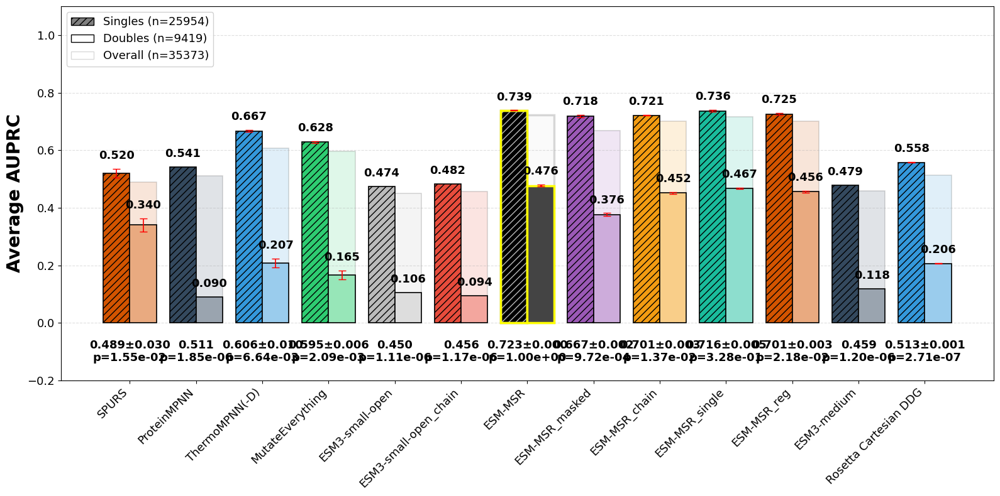

In [6]:
import analysis_utils_msr

analysis_utils_msr.create_triple_metric_chart_with_pvals(series_bar1=df_scores_cls.loc[('hyperopt_splits-S-test', 'ungrouped')], 
                                      series_bar2=df_scores_cls.loc[('hyperopt_splits-D-test', 'ungrouped')], 
                                      series_overall=df_scores_cls.loc[('hyperopt_splits-test', 'ungrouped')], 
                                      model_groups=['SPURS', 'ProteinMPNN', 'ThermoMPNN(-D)', 'MutateEverything', 'ESM3-small-open', 'ESM3-small-open_chain', 'ESM-MSR', 'ESM-MSR_masked', 'ESM-MSR_chain', 'ESM-MSR_single', 'ESM-MSR_reg', 'ESM3-medium', 'Rosetta Cartesian DDG'], # 'ESM3-small','ESM3-large',
                                      title=None, y_label='Average AUPRC', highlighted_model='ESM-MSR', enforce_global_n=False, ylim=(-0.2,1.1), figsize=(16,8), p_value_y_coord=-0.1, label_min_sep=0.02, fontsize_multiplier=1.3, legend_loc='upper left', is_grouped=False)

In [7]:
df_scores = pd.DataFrame(index=pd.MultiIndex.from_product([['hyperopt_splits-S-test', 'hyperopt_splits-D-test'], ['ungrouped', 'grouped']]))

df_scores = assess_all_models(df, df_scores, assess_grouped_spearman)

df_scores

ESM-MSR_1   ESM-MSR_1_n  ESM-MSR_1_groups  \
hyperopt_splits-S-test ungrouped   0.785192  25954.000000               NaN   
                       grouped     0.821352    998.230769              26.0   
hyperopt_splits-D-test ungrouped   0.665504   9419.000000               NaN   
                       grouped     0.702488    588.687500              16.0   
hyperopt_splits-test   ungrouped   0.815709  35373.000000               NaN   
                       grouped     0.835421   1360.500000              26.0   

                                  ESM-MSR_2   ESM-MSR_2_n  ESM-MSR_2_groups  \
hyperopt_splits-S-test ungrouped   0.790002  25954.000000               NaN   
                       grouped     0.824226    998.230769              26.0   
hyperopt_splits-D-test ungrouped   0.679237   9419.000000               NaN   
                       grouped     0.699611    588.687500              16.0   
hyperopt_splits-test   ungrouped   0.820583  35373.000000               NaN   
                       grouped     0.837904   1360.500000              26.0   

                                  ESM-MSR_3   ESM-MSR_3_n  ESM-MSR_3_groups  \
hyperopt_splits-S-test ungrouped   0.786219  25954.000000               NaN   
                       grouped     0.822006    998.230769              26.0   
hyperopt_splits-D-test ungrouped   0.699706   9419.000000               NaN   
                       grouped     0.702791    588.687500              16.0   
hyperopt_splits-test   ungrouped   0.821720  35373.000000               NaN   
                       grouped     0.835824   1360.500000              26.0   

                                  ESM-MSR_alpha_med_1  ...  \
hyperopt_splits-S-test ungrouped             0.717026  ...   
                       grouped               0.757339  ...   
hyperopt_splits-D-test ungrouped             0.592073  ...   
                       grouped               0.605299  ...   
hyperopt_splits-test   ungrouped             0.766881  ...   
                       grouped               0.782106  ...   

                                  Rosetta Cartesian DDG_1_groups  \
hyperopt_splits-S-test ungrouped                             NaN   
                       grouped                              26.0   
hyperopt_splits-D-test ungrouped                             NaN   
                       grouped                              16.0   
hyperopt_splits-test   ungrouped                             NaN   
                       grouped                              26.0   

                                  Rosetta Cartesian DDG_2  \
hyperopt_splits-S-test ungrouped                 0.626488   
                       grouped                   0.632944   
hyperopt_splits-D-test ungrouped                 0.618703   
                       grouped                   0.471414   
hyperopt_splits-test   ungrouped                 0.675509   
                       grouped                   0.665005   

                                  Rosetta Cartesian DDG_2_n  \
hyperopt_splits-S-test ungrouped               25954.000000   
                       grouped                   998.230769   
hyperopt_splits-D-test ungrouped                9419.000000   
                       grouped                   588.687500   
hyperopt_splits-test   ungrouped               35373.000000   
                       grouped                  1360.500000   

                                  Rosetta Cartesian DDG_2_groups  \
hyperopt_splits-S-test ungrouped                             NaN   
                       grouped                              26.0   
hyperopt_splits-D-test ungrouped                             NaN   
                       grouped                              16.0   
hyperopt_splits-test   ungrouped                             NaN   
                       grouped                              26.0   

                                  Rosetta Cartesian DDG_3  \
hyperopt_splits-S-test ungrouped                 0.6

In [8]:
df_scores[[c for c in df_scores.columns if '_n' in c]].iloc[:,:15]

ESM-MSR_1_n   ESM-MSR_2_n   ESM-MSR_3_n  \
hyperopt_splits-S-test ungrouped  25954.000000  25954.000000  25954.000000   
                       grouped      998.230769    998.230769    998.230769   
hyperopt_splits-D-test ungrouped   9419.000000   9419.000000   9419.000000   
                       grouped      588.687500    588.687500    588.687500   
hyperopt_splits-test   ungrouped  35373.000000  35373.000000  35373.000000   
                       grouped     1360.500000   1360.500000   1360.500000   

                                  ESM-MSR_alpha_med_1_n  \
hyperopt_splits-S-test ungrouped           25954.000000   
                       grouped               998.230769   
hyperopt_splits-D-test ungrouped            9419.000000   
                       grouped               588.687500   
hyperopt_splits-test   ungrouped           35373.000000   
                       grouped              1360.500000   

                                  ESM-MSR_alpha_med_2_n  \
hyperopt_splits-S-test ungrouped           25954.000000   
                       grouped               998.230769   
hyperopt_splits-D-test ungrouped            9419.000000   
                       grouped               588.687500   
hyperopt_splits-test   ungrouped           35373.000000   
                       grouped              1360.500000   

                                  ESM-MSR_alpha_med_3_n  \
hyperopt_splits-S-test ungrouped           25954.000000   
                       grouped               998.230769   
hyperopt_splits-D-test ungrouped            9419.000000   
                       grouped               588.687500   
hyperopt_splits-test   ungrouped           35373.000000   
                       grouped              1360.500000   

                                  ESM-MSR_alpha_low_1_n  \
hyperopt_splits-S-test ungrouped           25954.000000   
                       grouped               998.230769   
hyperopt_splits-D-test ungrouped            9419.000000   
                       grouped               588.687500   
hyperopt_splits-test   ungrouped           35373.000000   
                       grouped              1360.500000   

                                  ESM-MSR_alpha_low_2_n  \
hyperopt_splits-S-test ungrouped           25954.000000   
                       grouped               998.230769   
hyperopt_splits-D-test ungrouped            9419.000000   
                       grouped               588.687500   
hyperopt_splits-test   ungrouped           35373.000000   
                       grouped              1360.500000   

                                  ESM-MSR_alpha_low_3_n  ESM-MSR_single_1_n  \
hyperopt_splits-S-test ungrouped           25954.000000        25954.000000   
                       grouped               998.230769          998.230769   
hyperopt_splits-D-test ungrouped            9419.000000         9419.000000   
                       grouped               588.687500          588.687500   
hyperopt_splits-test   ungrouped           35373.000000        35373.000000   
                       grouped              1360.500000         1360.500000   

                                  ESM-MSR_single_2_n  ESM-MSR_single_3_n  \
hyperopt_splits-S-test ungrouped        25954.000000        25954.000000   
                       grouped            998.230769          998.230769   
hyperopt_splits-D-test ungrouped         9419.000000         9419.000000   
                       grouped            588.687500          588.687500   
hyperopt_splits-test   ungrouped        35373.000000        35373.000000   
                       grouped           1360.500000         1360.500000   

                                  ESM-MSR_reg_1_n  ESM-MSR_reg_2_n  \
hyperopt_splits-S-test ungrouped     25954.000000     25954.000000   
                       grouped         998.230769       998.230769   
hyperopt_splits-D-test ungrouped      9419.000000      9419.000000   
                       grouped         588.687500  

In [9]:
df_scores[[c for c in df_scores.columns if '_n' in c]].iloc[:,15:]

ESM-MSR_masked_1_n  ESM-MSR_masked_2_n  \
hyperopt_splits-S-test ungrouped        25954.000000        25954.000000   
                       grouped            998.230769          998.230769   
hyperopt_splits-D-test ungrouped         9419.000000         9419.000000   
                       grouped            588.687500          588.687500   
hyperopt_splits-test   ungrouped        35373.000000        35373.000000   
                       grouped           1360.500000         1360.500000   

                                  ESM-MSR_masked_3_n  ESM-MSR_chain_1_n  \
hyperopt_splits-S-test ungrouped        25954.000000       25954.000000   
                       grouped            998.230769         998.230769   
hyperopt_splits-D-test ungrouped         9419.000000        9419.000000   
                       grouped            588.687500         588.687500   
hyperopt_splits-test   ungrouped        35373.000000       35373.000000   
                       grouped           1360.500000        1360.500000   

                                  ESM-MSR_chain_2_n  ESM-MSR_chain_3_n  \
hyperopt_splits-S-test ungrouped       25954.000000       25954.000000   
                       grouped           998.230769         998.230769   
hyperopt_splits-D-test ungrouped        9419.000000        9419.000000   
                       grouped           588.687500         588.687500   
hyperopt_splits-test   ungrouped       35373.000000       35373.000000   
                       grouped          1360.500000        1360.500000   

                                     SPURS_1_n     SPURS_2_n     SPURS_3_n  \
hyperopt_splits-S-test ungrouped  25954.000000  25954.000000  25954.000000   
                       grouped      998.230769    998.230769    998.230769   
hyperopt_splits-D-test ungrouped   9419.000000   9419.000000   9419.000000   
                       grouped      588.687500    588.687500    588.687500   
hyperopt_splits-test   ungrouped  35373.000000  35373.000000  35373.000000   
                       grouped     1360.500000   1360.500000   1360.500000   

                                  ThermoMPNN(-D)_1_n  ...  \
hyperopt_splits-S-test ungrouped        25954.000000  ...   
                       grouped            998.230769  ...   
hyperopt_splits-D-test ungrouped         9419.000000  ...   
                       grouped            588.687500  ...   
hyperopt_splits-test   ungrouped        35373.000000  ...   
                       grouped           1360.500000  ...   

                                  MutateEverything_3_n  ESM3-small-open_n  \
hyperopt_splits-S-test ungrouped          25954.000000       25954.000000   
                       grouped              998.230769         998.230769   
hyperopt_splits-D-test ungrouped           9419.000000        9419.000000   
                       grouped              588.687500         588.687500   
hyperopt_splits-test   ungrouped          35373.000000       35373.000000   
                       grouped             1360.500000        1360.500000   

                                  ESM3-small-open_chain_n  ESM3-small_n  \
hyperopt_splits-S-test ungrouped             25954.000000  25954.000000   
                       grouped                 998.230769    998.230769   
hyperopt_splits-D-test ungrouped              9419.000000   9419.000000   
                       grouped                 588.687500    588.687500   
hyperopt_splits-test   ungrouped             35373.000000  35373.000000   
                       grouped                1360.500000   1360.500000   

                                  ESM3-medium_n  ESM3-large_n  \
hyperopt_splits-S-test ungrouped   25954.000000  25954.000000   
                       grouped       998.230769    998.230769   
hyperopt_splits-D-test ungrouped    9419.000000   9419.000000   
                       grouped       588.687500    588.687500   
hyperopt_splits-test   ungrouped   35373.000000  35373.000000   
                       gr

In [10]:
df_scores[[c for c in df_scores.columns if not '_n' in c]].iloc[:,:15]

ESM-MSR_1  ESM-MSR_1_groups  ESM-MSR_2  \
hyperopt_splits-S-test ungrouped   0.785192               NaN   0.790002   
                       grouped     0.821352              26.0   0.824226   
hyperopt_splits-D-test ungrouped   0.665504               NaN   0.679237   
                       grouped     0.702488              16.0   0.699611   
hyperopt_splits-test   ungrouped   0.815709               NaN   0.820583   
                       grouped     0.835421              26.0   0.837904   

                                  ESM-MSR_2_groups  ESM-MSR_3  \
hyperopt_splits-S-test ungrouped               NaN   0.786219   
                       grouped                26.0   0.822006   
hyperopt_splits-D-test ungrouped               NaN   0.699706   
                       grouped                16.0   0.702791   
hyperopt_splits-test   ungrouped               NaN   0.821720   
                       grouped                26.0   0.835824   

                                  ESM-MSR_3_groups  ESM-MSR_alpha_med_1  \
hyperopt_splits-S-test ungrouped               NaN             0.717026   
                       grouped                26.0             0.757339   
hyperopt_splits-D-test ungrouped               NaN             0.592073   
                       grouped                16.0             0.605299   
hyperopt_splits-test   ungrouped               NaN             0.766881   
                       grouped                26.0             0.782106   

                                  ESM-MSR_alpha_med_1_groups  \
hyperopt_splits-S-test ungrouped                         NaN   
                       grouped                          26.0   
hyperopt_splits-D-test ungrouped                         NaN   
                       grouped                          16.0   
hyperopt_splits-test   ungrouped                         NaN   
                       grouped                          26.0   

                                  ESM-MSR_alpha_med_2  \
hyperopt_splits-S-test ungrouped             0.713008   
                       grouped               0.755399   
hyperopt_splits-D-test ungrouped             0.590327   
                       grouped               0.601905   
hyperopt_splits-test   ungrouped             0.763582   
                       grouped               0.779990   

                                  ESM-MSR_alpha_med_2_groups  \
hyperopt_splits-S-test ungrouped                         NaN   
                       grouped                          26.0   
hyperopt_splits-D-test ungrouped                         NaN   
                       grouped                          16.0   
hyperopt_splits-test   ungrouped                         NaN   
                       grouped                          26.0   

                                  ESM-MSR_alpha_med_3  \
hyperopt_splits-S-test ungrouped             0.711242   
                       grouped               0.751125   
hyperopt_splits-D-test ungrouped             0.595139   
                       grouped               0.599276   
hyperopt_splits-test   ungrouped             0.764127   
                       grouped               0.776282   

                                  ESM-MSR_alpha_med_3_groups  \
hyperopt_splits-S-test ungrouped                         NaN   
                       grouped                          26.0   
hyperopt_splits-D-test ungrouped                         NaN   
                       grouped                          16.0   
hyperopt_splits-test   ungrouped                         NaN   
                       grouped                          26.0   

                                  ESM-MSR_alpha_low_1  \
hyperopt_splits-S-test ungrouped             0.609496   
                       grouped               0.665567   
hyperopt_splits-D-test ungrouped             0.479053   
                       grouped               0.471709   
hyperopt_splits-test   ungrouped             0.679603   
                       grouped

In [11]:
df_scores[[c for c in df_scores.columns if not '_n' in c]].iloc[:,15:]

ESM-MSR_alpha_low_2_groups  \
hyperopt_splits-S-test ungrouped                         NaN   
                       grouped                          26.0   
hyperopt_splits-D-test ungrouped                         NaN   
                       grouped                          16.0   
hyperopt_splits-test   ungrouped                         NaN   
                       grouped                          26.0   

                                  ESM-MSR_alpha_low_3  \
hyperopt_splits-S-test ungrouped             0.606269   
                       grouped               0.659825   
hyperopt_splits-D-test ungrouped             0.477556   
                       grouped               0.463735   
hyperopt_splits-test   ungrouped             0.677472   
                       grouped               0.692300   

                                  ESM-MSR_alpha_low_3_groups  \
hyperopt_splits-S-test ungrouped                         NaN   
                       grouped                          26.0   
hyperopt_splits-D-test ungrouped                         NaN   
                       grouped                          16.0   
hyperopt_splits-test   ungrouped                         NaN   
                       grouped                          26.0   

                                  ESM-MSR_single_1  ESM-MSR_single_1_groups  \
hyperopt_splits-S-test ungrouped          0.788368                      NaN   
                       grouped            0.823165                     26.0   
hyperopt_splits-D-test ungrouped          0.684897                      NaN   
                       grouped            0.688926                     16.0   
hyperopt_splits-test   ungrouped          0.820635                      NaN   
                       grouped            0.832208                     26.0   

                                  ESM-MSR_single_2  ESM-MSR_single_2_groups  \
hyperopt_splits-S-test ungrouped          0.791562                      NaN   
                       grouped            0.824082                     26.0   
hyperopt_splits-D-test ungrouped          0.643047                      NaN   
                       grouped            0.688493                     16.0   
hyperopt_splits-test   ungrouped          0.817487                      NaN   
                       grouped            0.832186                     26.0   

                                  ESM-MSR_single_3  ESM-MSR_single_3_groups  \
hyperopt_splits-S-test ungrouped          0.785089                      NaN   
                       grouped            0.820689                     26.0   
hyperopt_splits-D-test ungrouped          0.681629                      NaN   
                       grouped            0.678689                     16.0   
hyperopt_splits-test   ungrouped          0.816714                      NaN   
                       grouped            0.830177                     26.0   

                                  ESM-MSR_reg_1  ...  ESM3-large  \
hyperopt_splits-S-test ungrouped       0.784369  ...    0.430593   
                       grouped         0.810242  ...    0.475533   
hyperopt_splits-D-test ungrouped       0.659026  ...    0.372650   
                       grouped         0.686102  ...    0.255013   
hyperopt_splits-test   ungrouped       0.814500  ...    0.556169   
                       grouped         0.823295  ...    0.516025   

                                  ESM3-large_groups  Rosetta Cartesian DDG_1  \
hyperopt_splits-S-test ungrouped                NaN                 0.628056   
                       grouped                 26.0                 0.633837   
hyperopt_splits-D-test ungrouped                NaN                 0.619364   
                       grouped                 16.0                 0.472671   
hyperopt_splits-test   ungrouped                NaN                 0.676601   
                       grouped                 26.0                 0.665520   

                                  Ro

(<Figure size 1600x800 with 1 Axes>, <Axes: ylabel="Average Spearman's ρ">)

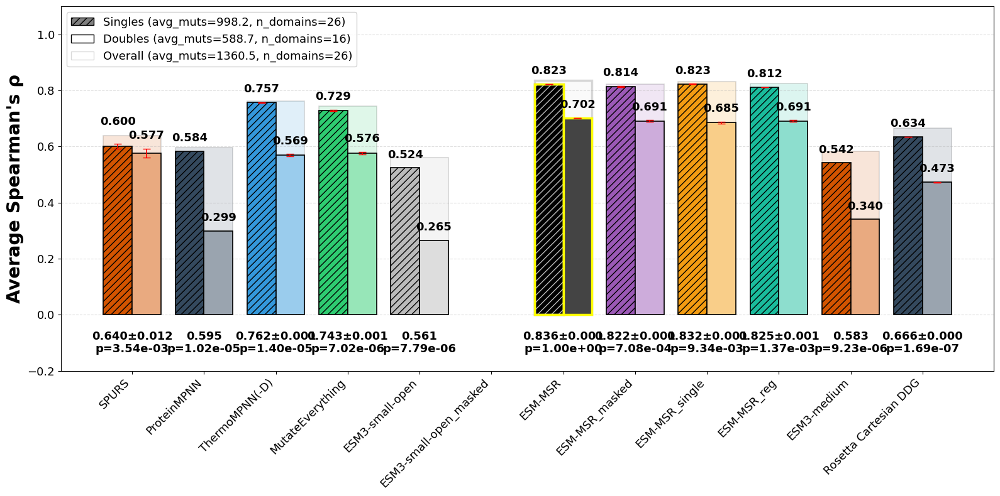

In [12]:
import analysis_utils_msr
import importlib
importlib.reload(analysis_utils_msr)

analysis_utils_msr.create_triple_metric_chart_with_pvals(series_bar1=df_scores.loc[('hyperopt_splits-S-test', 'grouped')], 
                                      series_bar2=df_scores.loc[('hyperopt_splits-D-test', 'grouped')], 
                                      series_overall=df_scores.loc[('hyperopt_splits-test', 'grouped')], 
                                      model_groups=['SPURS', 'ProteinMPNN', 'ThermoMPNN(-D)', 'MutateEverything', 'ESM3-small-open', 'ESM3-small-open_masked', 'ESM-MSR', 'ESM-MSR_masked', 'ESM-MSR_single', 'ESM-MSR_reg', 'ESM3-medium', 'Rosetta Cartesian DDG'], # 'ESM3-small','ESM3-large',
                                      title=None, y_label='Average Spearman\'s ρ', highlighted_model='ESM-MSR', enforce_global_n=False, ylim=(-0.2,1.1), figsize=(16,8), p_value_y_coord=-0.1, label_min_sep=0.02, fontsize_multiplier=1.3, legend_loc='upper left')

In [13]:
df_gain = pd.DataFrame(index=pd.MultiIndex.from_product([['hyperopt_splits-S-test', 'hyperopt_splits-D-test'], ['ungrouped', 'grouped']]))
df_gain = assess_all_models(df, df_gain, assess_grouped_gain)
df_gain
df_gain[[c for c in df_gain.columns if not '_n' in c]].iloc[:,:15]

ESM-MSR_1  ESM-MSR_1_groups   ESM-MSR_2  \
hyperopt_splits-S-test ungrouped  131.888840               NaN  131.443699   
                       grouped     41.979141              26.0   42.141707   
hyperopt_splits-D-test ungrouped   45.168081               NaN   41.271610   
                       grouped      8.473953              16.0    8.481425   
hyperopt_splits-test   ungrouped  129.221382               NaN  131.697149   
                       grouped     41.956472              26.0   42.053707   

                                  ESM-MSR_2_groups   ESM-MSR_3  \
hyperopt_splits-S-test ungrouped               NaN  135.157224   
                       grouped                26.0   41.899077   
hyperopt_splits-D-test ungrouped               NaN   41.571241   
                       grouped                16.0    8.450860   
hyperopt_splits-test   ungrouped               NaN  131.845123   
                       grouped                26.0   42.021591   

                                  ESM-MSR_3_groups  ESM-MSR_alpha_med_1  \
hyperopt_splits-S-test ungrouped               NaN           137.304232   
                       grouped                26.0            36.653457   
hyperopt_splits-D-test ungrouped               NaN            30.314561   
                       grouped                16.0             6.654087   
hyperopt_splits-test   ungrouped               NaN           134.896835   
                       grouped                26.0            36.554284   

                                  ESM-MSR_alpha_med_1_groups  \
hyperopt_splits-S-test ungrouped                         NaN   
                       grouped                          26.0   
hyperopt_splits-D-test ungrouped                         NaN   
                       grouped                          16.0   
hyperopt_splits-test   ungrouped                         NaN   
                       grouped                          26.0   

                                  ESM-MSR_alpha_med_2  \
hyperopt_splits-S-test ungrouped           136.692348   
                       grouped              36.224119   
hyperopt_splits-D-test ungrouped            27.782427   
                       grouped               6.820971   
hyperopt_splits-test   ungrouped           134.721740   
                       grouped              36.250221   

                                  ESM-MSR_alpha_med_2_groups  \
hyperopt_splits-S-test ungrouped                         NaN   
                       grouped                          26.0   
hyperopt_splits-D-test ungrouped                         NaN   
                       grouped                          16.0   
hyperopt_splits-test   ungrouped                         NaN   
                       grouped                          26.0   

                                  ESM-MSR_alpha_med_3  \
hyperopt_splits-S-test ungrouped           137.194638   
                       grouped              36.044845   
hyperopt_splits-D-test ungrouped            28.716858   
                       grouped               6.753730   
hyperopt_splits-test   ungrouped           136.518362   
                       grouped              36.090046   

                                  ESM-MSR_alpha_med_3_groups  \
hyperopt_splits-S-test ungrouped                         NaN   
                       grouped                          26.0   
hyperopt_splits-D-test ungrouped                         NaN   
                       grouped                          16.0   
hyperopt_splits-test   ungrouped                         NaN   
                       grouped                          26.0   

                                  ESM-MSR_alpha_low_1  \
hyperopt_splits-S-test ungrouped           120.991141   
                       grouped              30.214495   
hyperopt_splits-D-test ungrouped            18.655229   
                       grouped               5.049614   
hyperopt_splits-test   ungrouped           120.991141   
          

In [14]:
df_ndcg24 = pd.DataFrame(index=pd.MultiIndex.from_product([['hyperopt_splits-S-test', 'hyperopt_splits-D-test'], ['ungrouped', 'grouped']]))

# 1. Freeze the top_n argument into a new callable
assess_ndcg_24 = partial(assess_grouped_ndcg, top_n=24)

# 2. Pass the frozen function into your wrapper
df_ndcg24 = assess_all_models(df, df_ndcg24, assess_ndcg_24)

df_ndcg24
df_ndcg24[[c for c in df_ndcg24.columns if not '_n' in c]].iloc[:,:15]

ESM-MSR_1  ESM-MSR_1_groups  ESM-MSR_2  \
hyperopt_splits-S-test ungrouped   0.678869               NaN   0.732014   
                       grouped     0.664482              26.0   0.664620   
hyperopt_splits-D-test ungrouped   0.524884               NaN   0.377006   
                       grouped     0.483500              16.0   0.476505   
hyperopt_splits-test   ungrouped   0.680166               NaN   0.729344   
                       grouped     0.649258              26.0   0.647428   

                                  ESM-MSR_2_groups  ESM-MSR_3  \
hyperopt_splits-S-test ungrouped               NaN   0.738339   
                       grouped                26.0   0.661099   
hyperopt_splits-D-test ungrouped               NaN   0.478209   
                       grouped                16.0   0.521149   
hyperopt_splits-test   ungrouped               NaN   0.758887   
                       grouped                26.0   0.645814   

                                  ESM-MSR_3_groups  ESM-MSR_alpha_med_1  \
hyperopt_splits-S-test ungrouped               NaN             0.749619   
                       grouped                26.0             0.589355   
hyperopt_splits-D-test ungrouped               NaN             0.280640   
                       grouped                16.0             0.362231   
hyperopt_splits-test   ungrouped               NaN             0.746884   
                       grouped                26.0             0.577055   

                                  ESM-MSR_alpha_med_1_groups  \
hyperopt_splits-S-test ungrouped                         NaN   
                       grouped                          26.0   
hyperopt_splits-D-test ungrouped                         NaN   
                       grouped                          16.0   
hyperopt_splits-test   ungrouped                         NaN   
                       grouped                          26.0   

                                  ESM-MSR_alpha_med_2  \
hyperopt_splits-S-test ungrouped             0.768190   
                       grouped               0.577784   
hyperopt_splits-D-test ungrouped             0.260914   
                       grouped               0.331331   
hyperopt_splits-test   ungrouped             0.765387   
                       grouped               0.567439   

                                  ESM-MSR_alpha_med_2_groups  \
hyperopt_splits-S-test ungrouped                         NaN   
                       grouped                          26.0   
hyperopt_splits-D-test ungrouped                         NaN   
                       grouped                          16.0   
hyperopt_splits-test   ungrouped                         NaN   
                       grouped                          26.0   

                                  ESM-MSR_alpha_med_3  \
hyperopt_splits-S-test ungrouped             0.730200   
                       grouped               0.572041   
hyperopt_splits-D-test ungrouped             0.314753   
                       grouped               0.374393   
hyperopt_splits-test   ungrouped             0.727537   
                       grouped               0.561596   

                                  ESM-MSR_alpha_med_3_groups  \
hyperopt_splits-S-test ungrouped                         NaN   
                       grouped                          26.0   
hyperopt_splits-D-test ungrouped                         NaN   
                       grouped                          16.0   
hyperopt_splits-test   ungrouped                         NaN   
                       grouped                          26.0   

                                  ESM-MSR_alpha_low_1  \
hyperopt_splits-S-test ungrouped             0.661460   
                       grouped               0.467852   
hyperopt_splits-D-test ungrouped             0.267921   
                       grouped               0.276634   
hyperopt_splits-test   ungrouped             0.659047   
                       grouped

(<Figure size 1600x800 with 1 Axes>, <Axes: ylabel='Average NDCG@k=24'>)

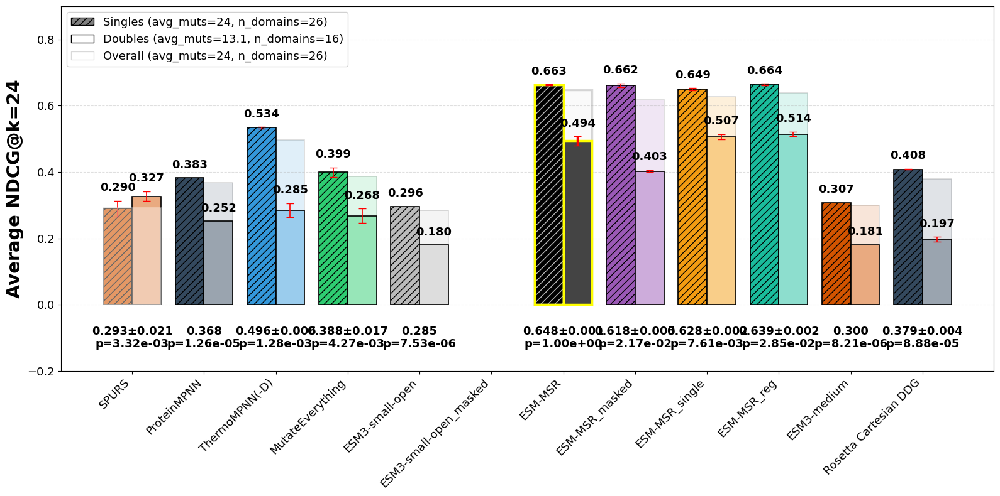

In [15]:
import analysis_utils_msr
import importlib
importlib.reload(analysis_utils_msr)

analysis_utils_msr.create_triple_metric_chart_with_pvals(series_bar1=df_ndcg24.loc[('hyperopt_splits-S-test', 'grouped')], 
                                      series_bar2=df_ndcg24.loc[('hyperopt_splits-D-test', 'grouped')], 
                                      series_overall=df_ndcg24.loc[('hyperopt_splits-test', 'grouped')], 
                                      model_groups=['SPURS', 'ProteinMPNN', 'ThermoMPNN(-D)', 'MutateEverything', 'ESM3-small-open', 'ESM3-small-open_masked', 'ESM-MSR', 'ESM-MSR_masked', 'ESM-MSR_single', 'ESM-MSR_reg', 'ESM3-medium', 'Rosetta Cartesian DDG'], # 'ESM3-small','ESM3-large',
                                      title=None, y_label='Average NDCG@k=24', highlighted_model='ESM-MSR', enforce_global_n=False, ylim=(-0.2,0.9), figsize=(16,8), p_value_y_coord=-0.1, label_min_sep=0.02, fontsize_multiplier=1.3, legend_loc='upper left')

In [16]:
df_ndcg96 = pd.DataFrame(index=pd.MultiIndex.from_product([['hyperopt_splits-S-test', 'hyperopt_splits-D-test'], ['ungrouped', 'grouped']]))

# 1. Freeze the top_n argument into a new callable
assess_ndcg_96 = partial(assess_grouped_ndcg, top_n=96)

# 2. Pass the frozen function into your wrapper
df_ndcg96 = assess_all_models(df, df_ndcg96, assess_ndcg_96)

df_ndcg96
df_ndcg96[[c for c in df_ndcg96.columns if not '_n' in c]].iloc[:,:15]

ESM-MSR_1  ESM-MSR_1_groups  ESM-MSR_2  \
hyperopt_splits-S-test ungrouped   0.660313               NaN   0.677468   
                       grouped     0.673147              26.0   0.675049   
hyperopt_splits-D-test ungrouped   0.515830               NaN   0.421304   
                       grouped     0.552359              16.0   0.564901   
hyperopt_splits-test   ungrouped   0.647734               NaN   0.667607   
                       grouped     0.655175              26.0   0.655847   

                                  ESM-MSR_2_groups  ESM-MSR_3  \
hyperopt_splits-S-test ungrouped               NaN   0.694258   
                       grouped                26.0   0.673236   
hyperopt_splits-D-test ungrouped               NaN   0.469724   
                       grouped                16.0   0.606035   
hyperopt_splits-test   ungrouped               NaN   0.673295   
                       grouped                26.0   0.657260   

                                  ESM-MSR_3_groups  ESM-MSR_alpha_med_1  \
hyperopt_splits-S-test ungrouped               NaN             0.704649   
                       grouped                26.0             0.594394   
hyperopt_splits-D-test ungrouped               NaN             0.309115   
                       grouped                16.0             0.442829   
hyperopt_splits-test   ungrouped               NaN             0.685202   
                       grouped                26.0             0.578656   

                                  ESM-MSR_alpha_med_1_groups  \
hyperopt_splits-S-test ungrouped                         NaN   
                       grouped                          26.0   
hyperopt_splits-D-test ungrouped                         NaN   
                       grouped                          16.0   
hyperopt_splits-test   ungrouped                         NaN   
                       grouped                          26.0   

                                  ESM-MSR_alpha_med_2  \
hyperopt_splits-S-test ungrouped             0.709192   
                       grouped               0.586058   
hyperopt_splits-D-test ungrouped             0.275044   
                       grouped               0.420394   
hyperopt_splits-test   ungrouped             0.691269   
                       grouped               0.571113   

                                  ESM-MSR_alpha_med_2_groups  \
hyperopt_splits-S-test ungrouped                         NaN   
                       grouped                          26.0   
hyperopt_splits-D-test ungrouped                         NaN   
                       grouped                          16.0   
hyperopt_splits-test   ungrouped                         NaN   
                       grouped                          26.0   

                                  ESM-MSR_alpha_med_3  \
hyperopt_splits-S-test ungrouped             0.705902   
                       grouped               0.581420   
hyperopt_splits-D-test ungrouped             0.303281   
                       grouped               0.460733   
hyperopt_splits-test   ungrouped             0.692324   
                       grouped               0.567371   

                                  ESM-MSR_alpha_med_3_groups  \
hyperopt_splits-S-test ungrouped                         NaN   
                       grouped                          26.0   
hyperopt_splits-D-test ungrouped                         NaN   
                       grouped                          16.0   
hyperopt_splits-test   ungrouped                         NaN   
                       grouped                          26.0   

                                  ESM-MSR_alpha_low_1  \
hyperopt_splits-S-test ungrouped             0.624552   
                       grouped               0.482850   
hyperopt_splits-D-test ungrouped             0.222382   
                       grouped               0.357509   
hyperopt_splits-test   ungrouped             0.614553   
                       grouped

In [17]:
df_ndcg96[[c for c in df_ndcg96.columns if '_n' in c]].iloc[:,:15]

ESM-MSR_1_n  ESM-MSR_2_n  ESM-MSR_3_n  \
hyperopt_splits-S-test ungrouped      96.0000      96.0000      96.0000   
                       grouped        96.0000      96.0000      96.0000   
hyperopt_splits-D-test ungrouped      96.0000      96.0000      96.0000   
                       grouped        26.3125      26.3125      26.3125   
hyperopt_splits-test   ungrouped      96.0000      96.0000      96.0000   
                       grouped        96.0000      96.0000      96.0000   

                                  ESM-MSR_alpha_med_1_n  \
hyperopt_splits-S-test ungrouped                96.0000   
                       grouped                  96.0000   
hyperopt_splits-D-test ungrouped                96.0000   
                       grouped                  26.3125   
hyperopt_splits-test   ungrouped                96.0000   
                       grouped                  96.0000   

                                  ESM-MSR_alpha_med_2_n  \
hyperopt_splits-S-test ungrouped                96.0000   
                       grouped                  96.0000   
hyperopt_splits-D-test ungrouped                96.0000   
                       grouped                  26.3125   
hyperopt_splits-test   ungrouped                96.0000   
                       grouped                  96.0000   

                                  ESM-MSR_alpha_med_3_n  \
hyperopt_splits-S-test ungrouped                96.0000   
                       grouped                  96.0000   
hyperopt_splits-D-test ungrouped                96.0000   
                       grouped                  26.3125   
hyperopt_splits-test   ungrouped                96.0000   
                       grouped                  96.0000   

                                  ESM-MSR_alpha_low_1_n  \
hyperopt_splits-S-test ungrouped                96.0000   
                       grouped                  96.0000   
hyperopt_splits-D-test ungrouped                96.0000   
                       grouped                  26.3125   
hyperopt_splits-test   ungrouped                96.0000   
                       grouped                  96.0000   

                                  ESM-MSR_alpha_low_2_n  \
hyperopt_splits-S-test ungrouped                96.0000   
                       grouped                  96.0000   
hyperopt_splits-D-test ungrouped                96.0000   
                       grouped                  26.3125   
hyperopt_splits-test   ungrouped                96.0000   
                       grouped                  96.0000   

                                  ESM-MSR_alpha_low_3_n  ESM-MSR_single_1_n  \
hyperopt_splits-S-test ungrouped                96.0000             96.0000   
                       grouped                  96.0000             96.0000   
hyperopt_splits-D-test ungrouped                96.0000             96.0000   
                       grouped                  26.3125             26.3125   
hyperopt_splits-test   ungrouped                96.0000             96.0000   
                       grouped                  96.0000             96.0000   

                                  ESM-MSR_single_2_n  ESM-MSR_single_3_n  \
hyperopt_splits-S-test ungrouped             96.0000             96.0000   
                       grouped               96.0000             96.0000   
hyperopt_splits-D-test ungrouped             96.0000             96.0000   
                       grouped               26.3125             26.3125   
hyperopt_splits-test   ungrouped             96.0000             96.0000   
                       grouped               96.0000             96.0000   

                                  ESM-MSR_reg_1_n  ESM-MSR_reg_2_n  \
hyperopt_splits-S-test ungrouped          96.0000          96.0000   
                       grouped            96.0000          96.0000   
hyperopt_splits-D-test ungrouped          96.0000          96.0000   
                       grouped            26.3125          26.3125   
h

In [18]:
df_ndcg96_no_cys = pd.DataFrame(index=pd.MultiIndex.from_product([['hyperopt_splits-S-test', 'hyperopt_splits-D-test'], ['ungrouped', 'grouped']]))
df_no_cys = df.loc[~df.index.str.endswith('C')]
df_ndcg96_no_cys = assess_all_models(df_no_cys, df_ndcg96_no_cys, assess_ndcg_96)
df_ndcg96_no_cys
df_ndcg96_no_cys[[c for c in df_ndcg96_no_cys.columns if not '_n' in c]].iloc[:,:15]

ESM-MSR_1  ESM-MSR_1_groups  ESM-MSR_2  \
hyperopt_splits-S-test ungrouped   0.664275               NaN   0.677384   
                       grouped     0.681873              26.0   0.682280   
hyperopt_splits-D-test ungrouped   0.479346               NaN   0.407565   
                       grouped     0.510552              16.0   0.539024   
hyperopt_splits-test   ungrouped   0.652989               NaN   0.666855   
                       grouped     0.664198              26.0   0.665952   

                                  ESM-MSR_2_groups  ESM-MSR_3  \
hyperopt_splits-S-test ungrouped               NaN   0.705527   
                       grouped                26.0   0.680270   
hyperopt_splits-D-test ungrouped               NaN   0.422481   
                       grouped                16.0   0.565932   
hyperopt_splits-test   ungrouped               NaN   0.676407   
                       grouped                26.0   0.666521   

                                  ESM-MSR_3_groups  ESM-MSR_alpha_med_1  \
hyperopt_splits-S-test ungrouped               NaN             0.701223   
                       grouped                26.0             0.603636   
hyperopt_splits-D-test ungrouped               NaN             0.303134   
                       grouped                16.0             0.441987   
hyperopt_splits-test   ungrouped               NaN             0.683987   
                       grouped                26.0             0.589274   

                                  ESM-MSR_alpha_med_1_groups  \
hyperopt_splits-S-test ungrouped                         NaN   
                       grouped                          26.0   
hyperopt_splits-D-test ungrouped                         NaN   
                       grouped                          16.0   
hyperopt_splits-test   ungrouped                         NaN   
                       grouped                          26.0   

                                  ESM-MSR_alpha_med_2  \
hyperopt_splits-S-test ungrouped             0.707294   
                       grouped               0.597728   
hyperopt_splits-D-test ungrouped             0.278540   
                       grouped               0.435665   
hyperopt_splits-test   ungrouped             0.698098   
                       grouped               0.583331   

                                  ESM-MSR_alpha_med_2_groups  \
hyperopt_splits-S-test ungrouped                         NaN   
                       grouped                          26.0   
hyperopt_splits-D-test ungrouped                         NaN   
                       grouped                          16.0   
hyperopt_splits-test   ungrouped                         NaN   
                       grouped                          26.0   

                                  ESM-MSR_alpha_med_3  \
hyperopt_splits-S-test ungrouped             0.698862   
                       grouped               0.591610   
hyperopt_splits-D-test ungrouped             0.297003   
                       grouped               0.463181   
hyperopt_splits-test   ungrouped             0.689743   
                       grouped               0.579233   

                                  ESM-MSR_alpha_med_3_groups  \
hyperopt_splits-S-test ungrouped                         NaN   
                       grouped                          26.0   
hyperopt_splits-D-test ungrouped                         NaN   
                       grouped                          16.0   
hyperopt_splits-test   ungrouped                         NaN   
                       grouped                          26.0   

                                  ESM-MSR_alpha_low_1  \
hyperopt_splits-S-test ungrouped             0.617805   
                       grouped               0.494090   
hyperopt_splits-D-test ungrouped             0.212638   
                       grouped               0.381014   
hyperopt_splits-test   ungrouped             0.614979   
                       grouped

In [19]:
df_ndcg96_no_cys[[c for c in df_ndcg96_no_cys.columns if '_n' in c]].iloc[:,:15]

ESM-MSR_1_n  ESM-MSR_2_n  ESM-MSR_3_n  \
hyperopt_splits-S-test ungrouped      96.0000      96.0000      96.0000   
                       grouped        96.0000      96.0000      96.0000   
hyperopt_splits-D-test ungrouped      96.0000      96.0000      96.0000   
                       grouped        23.3125      23.3125      23.3125   
hyperopt_splits-test   ungrouped      96.0000      96.0000      96.0000   
                       grouped        96.0000      96.0000      96.0000   

                                  ESM-MSR_alpha_med_1_n  \
hyperopt_splits-S-test ungrouped                96.0000   
                       grouped                  96.0000   
hyperopt_splits-D-test ungrouped                96.0000   
                       grouped                  23.3125   
hyperopt_splits-test   ungrouped                96.0000   
                       grouped                  96.0000   

                                  ESM-MSR_alpha_med_2_n  \
hyperopt_splits-S-test ungrouped                96.0000   
                       grouped                  96.0000   
hyperopt_splits-D-test ungrouped                96.0000   
                       grouped                  23.3125   
hyperopt_splits-test   ungrouped                96.0000   
                       grouped                  96.0000   

                                  ESM-MSR_alpha_med_3_n  \
hyperopt_splits-S-test ungrouped                96.0000   
                       grouped                  96.0000   
hyperopt_splits-D-test ungrouped                96.0000   
                       grouped                  23.3125   
hyperopt_splits-test   ungrouped                96.0000   
                       grouped                  96.0000   

                                  ESM-MSR_alpha_low_1_n  \
hyperopt_splits-S-test ungrouped                96.0000   
                       grouped                  96.0000   
hyperopt_splits-D-test ungrouped                96.0000   
                       grouped                  23.3125   
hyperopt_splits-test   ungrouped                96.0000   
                       grouped                  96.0000   

                                  ESM-MSR_alpha_low_2_n  \
hyperopt_splits-S-test ungrouped                96.0000   
                       grouped                  96.0000   
hyperopt_splits-D-test ungrouped                96.0000   
                       grouped                  23.3125   
hyperopt_splits-test   ungrouped                96.0000   
                       grouped                  96.0000   

                                  ESM-MSR_alpha_low_3_n  ESM-MSR_single_1_n  \
hyperopt_splits-S-test ungrouped                96.0000             96.0000   
                       grouped                  96.0000             96.0000   
hyperopt_splits-D-test ungrouped                96.0000             96.0000   
                       grouped                  23.3125             23.3125   
hyperopt_splits-test   ungrouped                96.0000             96.0000   
                       grouped                  96.0000             96.0000   

                                  ESM-MSR_single_2_n  ESM-MSR_single_3_n  \
hyperopt_splits-S-test ungrouped             96.0000             96.0000   
                       grouped               96.0000             96.0000   
hyperopt_splits-D-test ungrouped             96.0000             96.0000   
                       grouped               23.3125             23.3125   
hyperopt_splits-test   ungrouped             96.0000             96.0000   
                       grouped               96.0000             96.0000   

                                  ESM-MSR_reg_1_n  ESM-MSR_reg_2_n  \
hyperopt_splits-S-test ungrouped          96.0000          96.0000   
                       grouped            96.0000          96.0000   
hyperopt_splits-D-test ungrouped          96.0000          96.0000   
                       grouped            23.3125          23.3125   
h

In [20]:
df_ndcg96_no_cys[[c for c in df_ndcg96_no_cys.columns if '_group' in c]].iloc[:,:15]

ESM-MSR_1_groups  ESM-MSR_2_groups  \
hyperopt_splits-S-test ungrouped               NaN               NaN   
                       grouped                26.0              26.0   
hyperopt_splits-D-test ungrouped               NaN               NaN   
                       grouped                16.0              16.0   
hyperopt_splits-test   ungrouped               NaN               NaN   
                       grouped                26.0              26.0   

                                  ESM-MSR_3_groups  \
hyperopt_splits-S-test ungrouped               NaN   
                       grouped                26.0   
hyperopt_splits-D-test ungrouped               NaN   
                       grouped                16.0   
hyperopt_splits-test   ungrouped               NaN   
                       grouped                26.0   

                                  ESM-MSR_alpha_med_1_groups  \
hyperopt_splits-S-test ungrouped                         NaN   
                       grouped                          26.0   
hyperopt_splits-D-test ungrouped                         NaN   
                       grouped                          16.0   
hyperopt_splits-test   ungrouped                         NaN   
                       grouped                          26.0   

                                  ESM-MSR_alpha_med_2_groups  \
hyperopt_splits-S-test ungrouped                         NaN   
                       grouped                          26.0   
hyperopt_splits-D-test ungrouped                         NaN   
                       grouped                          16.0   
hyperopt_splits-test   ungrouped                         NaN   
                       grouped                          26.0   

                                  ESM-MSR_alpha_med_3_groups  \
hyperopt_splits-S-test ungrouped                         NaN   
                       grouped                          26.0   
hyperopt_splits-D-test ungrouped                         NaN   
                       grouped                          16.0   
hyperopt_splits-test   ungrouped                         NaN   
                       grouped                          26.0   

                                  ESM-MSR_alpha_low_1_groups  \
hyperopt_splits-S-test ungrouped                         NaN   
                       grouped                          26.0   
hyperopt_splits-D-test ungrouped                         NaN   
                       grouped                          16.0   
hyperopt_splits-test   ungrouped                         NaN   
                       grouped                          26.0   

                                  ESM-MSR_alpha_low_2_groups  \
hyperopt_splits-S-test ungrouped                         NaN   
                       grouped                          26.0   
hyperopt_splits-D-test ungrouped                         NaN   
                       grouped                          16.0   
hyperopt_splits-test   ungrouped                         NaN   
                       grouped                          26.0   

                                  ESM-MSR_alpha_low_3_groups  \
hyperopt_splits-S-test ungrouped                         NaN   
                       grouped                          26.0   
hyperopt_splits-D-test ungrouped                         NaN   
                       grouped                          16.0   
hyperopt_splits-test   ungrouped                         NaN   
                       grouped                          26.0   

                                  ESM-MSR_single_1_groups  \
hyperopt_splits-S-test ungrouped                      NaN   
                       grouped                       26.0   
hyperopt_splits-D-test ungrouped                      NaN   
                       grouped                       16.0   
hyperopt_splits-test   ungrouped                      NaN   
                       grouped                       26.0   

                            

In [21]:
df_ndcg96_no_cys[[c for c in df_ndcg96_no_cys.columns if '_n' in c]].iloc[:,15:30]

ESM-MSR_masked_1_n  ESM-MSR_masked_2_n  \
hyperopt_splits-S-test ungrouped             96.0000             96.0000   
                       grouped               96.0000             96.0000   
hyperopt_splits-D-test ungrouped             96.0000             96.0000   
                       grouped               23.3125             23.3125   
hyperopt_splits-test   ungrouped             96.0000             96.0000   
                       grouped               96.0000             96.0000   

                                  ESM-MSR_masked_3_n  ESM-MSR_chain_1_n  \
hyperopt_splits-S-test ungrouped             96.0000            96.0000   
                       grouped               96.0000            96.0000   
hyperopt_splits-D-test ungrouped             96.0000            96.0000   
                       grouped               23.3125            23.3125   
hyperopt_splits-test   ungrouped             96.0000            96.0000   
                       grouped               96.0000            96.0000   

                                  ESM-MSR_chain_2_n  ESM-MSR_chain_3_n  \
hyperopt_splits-S-test ungrouped            96.0000            96.0000   
                       grouped              96.0000            96.0000   
hyperopt_splits-D-test ungrouped            96.0000            96.0000   
                       grouped              23.3125            23.3125   
hyperopt_splits-test   ungrouped            96.0000            96.0000   
                       grouped              96.0000            96.0000   

                                  SPURS_1_n  SPURS_2_n  SPURS_3_n  \
hyperopt_splits-S-test ungrouped    96.0000    96.0000    96.0000   
                       grouped      96.0000    96.0000    96.0000   
hyperopt_splits-D-test ungrouped    96.0000    96.0000    96.0000   
                       grouped      23.3125    23.3125    23.3125   
hyperopt_splits-test   ungrouped    96.0000    96.0000    96.0000   
                       grouped      96.0000    96.0000    96.0000   

                                  ThermoMPNN(-D)_1_n  ThermoMPNN(-D)_2_n  \
hyperopt_splits-S-test ungrouped             96.0000             96.0000   
                       grouped               96.0000             96.0000   
hyperopt_splits-D-test ungrouped             96.0000             96.0000   
                       grouped               23.3125             23.3125   
hyperopt_splits-test   ungrouped             96.0000             96.0000   
                       grouped               96.0000             96.0000   

                                  ThermoMPNN(-D)_3_n  MutateEverything_1_n  \
hyperopt_splits-S-test ungrouped             96.0000               96.0000   
                       grouped               96.0000               96.0000   
hyperopt_splits-D-test ungrouped             96.0000               96.0000   
                       grouped               23.3125               23.3125   
hyperopt_splits-test   ungrouped             96.0000               96.0000   
                       grouped               96.0000               96.0000   

                                  MutateEverything_2_n  MutateEverything_3_n  
hyperopt_splits-S-test ungrouped               96.0000               96.0000  
                       grouped                 96.0000               96.0000  
hyperopt_splits-D-test ungrouped               96.0000               96.0000  
                       grouped                 23.3125               23.3125  
hyperopt_splits-test   ungrouped               96.0000               96.0000  
                       grouped                 96.0000               96.0000

(<Figure size 1600x800 with 1 Axes>, <Axes: ylabel='Average NDCG@k=96'>)

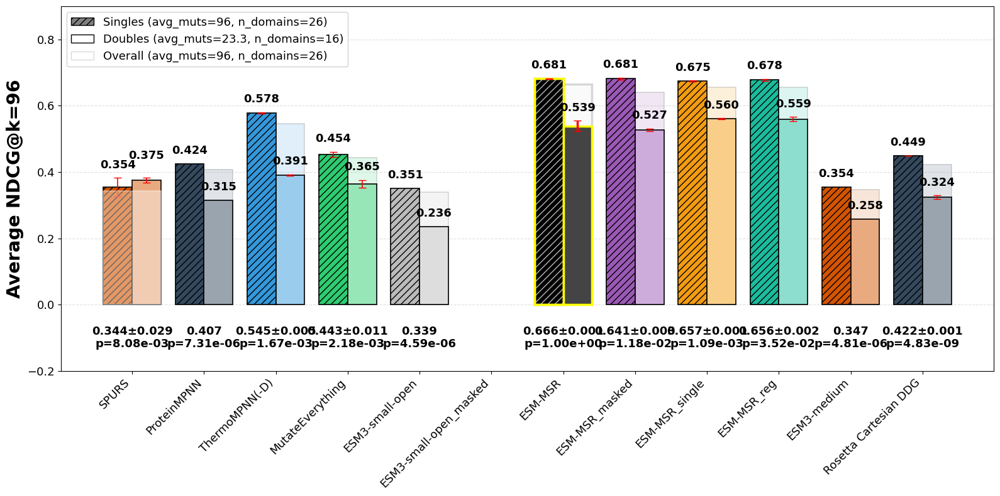

In [22]:
import analysis_utils_msr
import importlib
importlib.reload(analysis_utils_msr)

analysis_utils_msr.create_triple_metric_chart_with_pvals(series_bar1=df_ndcg96_no_cys.loc[('hyperopt_splits-S-test', 'grouped')], 
                                      series_bar2=df_ndcg96_no_cys.loc[('hyperopt_splits-D-test', 'grouped')], 
                                      series_overall=df_ndcg96_no_cys.loc[('hyperopt_splits-test', 'grouped')], 
                                      model_groups=['SPURS', 'ProteinMPNN', 'ThermoMPNN(-D)', 'MutateEverything', 'ESM3-small-open', 'ESM3-small-open_masked', 'ESM-MSR', 'ESM-MSR_masked', 'ESM-MSR_single', 'ESM-MSR_reg', 'ESM3-medium', 'Rosetta Cartesian DDG'], # 'ESM3-small','ESM3-large',
                                      title=None, y_label='Average NDCG@k=96', highlighted_model='ESM-MSR', enforce_global_n=False, ylim=(-0.2,0.9), figsize=(16,8), p_value_y_coord=-0.1, label_min_sep=0.02, fontsize_multiplier=1.3, legend_loc='upper left')

(<Figure size 1600x600 with 1 Axes>, <Axes: ylabel='Average NDCG@k=96'>)

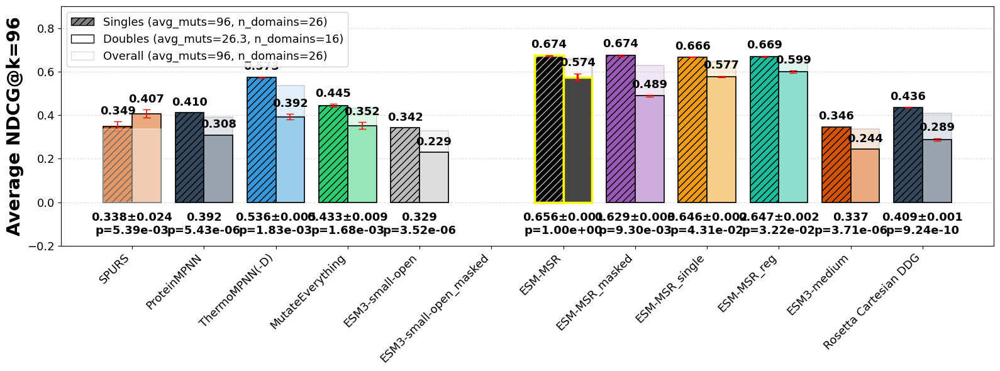

In [23]:
analysis_utils_msr.create_triple_metric_chart_with_pvals(series_bar1=df_ndcg96.loc[('hyperopt_splits-S-test', 'grouped')], 
                                      series_bar2=df_ndcg96.loc[('hyperopt_splits-D-test', 'grouped')], 
                                      series_overall=df_ndcg96.loc[('hyperopt_splits-test', 'grouped')], 
                                      model_groups=['SPURS', 'ProteinMPNN', 'ThermoMPNN(-D)', 'MutateEverything', 'ESM3-small-open', 'ESM3-small-open_masked', 'ESM-MSR', 'ESM-MSR_masked', 'ESM-MSR_single', 'ESM-MSR_reg', 'ESM3-medium', 'Rosetta Cartesian DDG'], #'ESM3-small', 'ESM3-large',
                                      title=None, y_label='Average NDCG@k=96', highlighted_model='ESM-MSR', enforce_global_n=False, ylim=(-0.2,0.9), figsize=(16,6), p_value_y_coord=-0.1, label_min_sep=0.02, fontsize_multiplier=1.3, legend_loc='upper left')

In [24]:
df_ndcg_pos = pd.DataFrame(index=pd.MultiIndex.from_product([['hyperopt_splits-S-test', 'hyperopt_splits-D-test'], ['ungrouped', 'grouped']]))

# 1. Freeze the top_n argument into a new callable
assess_ndcg_pos = partial(assess_grouped_ndcg, threshold=0)

# 2. Pass the frozen function into your wrapper
df_ndcg_pos = assess_all_models(df, df_ndcg_pos, assess_ndcg_pos)

df_ndcg_pos
df_ndcg_pos[[c for c in df_ndcg_pos.columns if not '_n' in c]].iloc[:,:15]


ESM-MSR_1  ESM-MSR_1_groups  ESM-MSR_2  \
hyperopt_splits-S-test ungrouped   0.892199               NaN   0.897923   
                       grouped     0.854333              26.0   0.857413   
hyperopt_splits-D-test ungrouped   0.757699               NaN   0.705929   
                       grouped     0.617399              16.0   0.622049   
hyperopt_splits-test   ungrouped   0.889192               NaN   0.893525   
                       grouped     0.846650              26.0   0.848843   

                                  ESM-MSR_2_groups  ESM-MSR_3  \
hyperopt_splits-S-test ungrouped               NaN   0.898479   
                       grouped                26.0   0.858017   
hyperopt_splits-D-test ungrouped               NaN   0.740842   
                       grouped                16.0   0.663220   
hyperopt_splits-test   ungrouped               NaN   0.893808   
                       grouped                26.0   0.850681   

                                  ESM-MSR_3_groups  ESM-MSR_alpha_med_1  \
hyperopt_splits-S-test ungrouped               NaN             0.878628   
                       grouped                26.0             0.820636   
hyperopt_splits-D-test ungrouped               NaN             0.642013   
                       grouped                16.0             0.539030   
hyperopt_splits-test   ungrouped               NaN             0.873279   
                       grouped                26.0             0.813449   

                                  ESM-MSR_alpha_med_1_groups  \
hyperopt_splits-S-test ungrouped                         NaN   
                       grouped                          26.0   
hyperopt_splits-D-test ungrouped                         NaN   
                       grouped                          16.0   
hyperopt_splits-test   ungrouped                         NaN   
                       grouped                          26.0   

                                  ESM-MSR_alpha_med_2  \
hyperopt_splits-S-test ungrouped             0.878306   
                       grouped               0.817847   
hyperopt_splits-D-test ungrouped             0.624577   
                       grouped               0.511820   
hyperopt_splits-test   ungrouped             0.872930   
                       grouped               0.810489   

                                  ESM-MSR_alpha_med_2_groups  \
hyperopt_splits-S-test ungrouped                         NaN   
                       grouped                          26.0   
hyperopt_splits-D-test ungrouped                         NaN   
                       grouped                          16.0   
hyperopt_splits-test   ungrouped                         NaN   
                       grouped                          26.0   

                                  ESM-MSR_alpha_med_3  \
hyperopt_splits-S-test ungrouped             0.876865   
                       grouped               0.813953   
hyperopt_splits-D-test ungrouped             0.643683   
                       grouped               0.556164   
hyperopt_splits-test   ungrouped             0.871820   
                       grouped               0.807111   

                                  ESM-MSR_alpha_med_3_groups  \
hyperopt_splits-S-test ungrouped                         NaN   
                       grouped                          26.0   
hyperopt_splits-D-test ungrouped                         NaN   
                       grouped                          16.0   
hyperopt_splits-test   ungrouped                         NaN   
                       grouped                          26.0   

                                  ESM-MSR_alpha_low_1  \
hyperopt_splits-S-test ungrouped             0.845431   
                       grouped               0.763734   
hyperopt_splits-D-test ungrouped             0.588224   
                       grouped               0.483649   
hyperopt_splits-test   ungrouped             0.840356   
                       grouped

(<Figure size 1600x600 with 1 Axes>, <Axes: ylabel='Average NDCG'>)

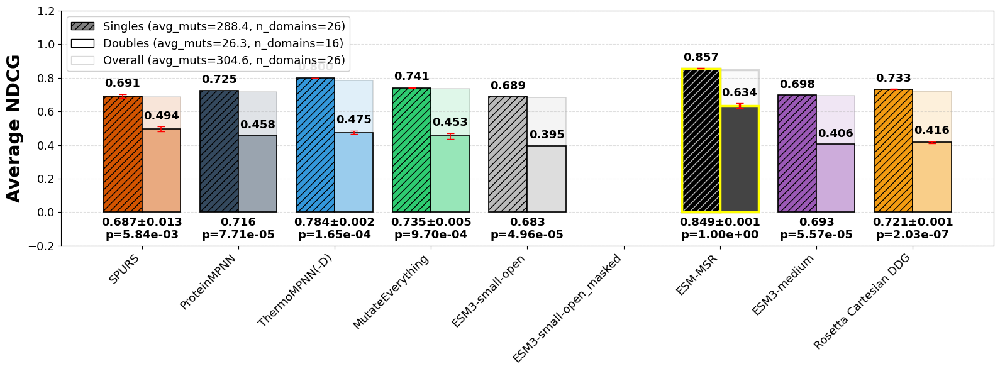

In [25]:
analysis_utils_msr.create_triple_metric_chart_with_pvals(series_bar1=df_ndcg_pos.loc[('hyperopt_splits-S-test', 'grouped')], 
                                      series_bar2=df_ndcg_pos.loc[('hyperopt_splits-D-test', 'grouped')], 
                                      series_overall=df_ndcg_pos.loc[('hyperopt_splits-test', 'grouped')], 
                                      model_groups=['SPURS', 'ProteinMPNN', 'ThermoMPNN(-D)', 'MutateEverything', 'ESM3-small-open', 'ESM3-small-open_masked', 'ESM-MSR',  'ESM3-medium', 'Rosetta Cartesian DDG'], #'ESM3-small', 'ESM3-large', 'ESM-MSR_masked', 'ESM-MSR_single', 'ESM-MSR_reg',
                                      title=None, y_label='Average NDCG', highlighted_model='ESM-MSR', enforce_global_n=False, ylim=(-0.2,1.2), figsize=(16,6), p_value_y_coord=-0.1, label_min_sep=0.02, fontsize_multiplier=1.3, legend_loc='upper left')

In [26]:
# add additive scores
# should be 556 mutants missing
import analysis_utils_msr
import importlib
importlib.reload(analysis_utils_msr)
#from analysis_utils_msr import sum_individual_mutation_scores

#cols = df.columns.drop('code').drop('mut_type')
#cols = ['Rosetta Cartesian DDG_1', 'Rosetta Cartesian DDG_2', 'Rosetta Cartesian DDG_3', 'ddG_ML_me']
cols = ['ddG']
df_epistatic = df.copy(deep=True)

#print(len(df.loc[df['mut_type'].str.contains(':')]))
for c in cols:
    if not c.endswith('_n'):
        print(c)
        # synthesize additive mutation predictions and scores
        df_epistatic = sum_individual_mutation_scores(df_epistatic, c, new_score_column=None) #, df_missing, missing1, missing2

#df_epistatic = df_epistatic[[c for c in df_epistatic.columns if 'additive' in c] + ['code', 'ddG', 'mut_type']]
df_epistatic = df_epistatic[[c for c in df_epistatic.columns if not c.endswith('_n')]]
df_epistatic = df_epistatic.dropna(subset='ESM-MSR_1')
#df_epistatic.loc[df_epistatic.index.str.contains(':'), 'ThermoMPNN(-D)_1_additive'] = df_epistatic.loc[df_epistatic.index.str.contains(':'), 'ThermoMPNN_1']
#df_epistatic.loc[df_epistatic.index.str.contains(':'), 'ThermoMPNN(-D)_2_additive'] = df_epistatic.loc[df_epistatic.index.str.contains(':'), 'ThermoMPNN_2']
#df_epistatic.loc[df_epistatic.index.str.contains(':'), 'ThermoMPNN(-D)_3_additive'] = df_epistatic.loc[df_epistatic.index.str.contains(':'), 'ThermoMPNN_3']

#print(len(df_epistatic))
#df_epistatic['ThermoMPNN(-D)_1_additive'].dropna()

ddG


In [27]:
# Get all grouped and ungrouped ranking correlations for epistatic / combined mutants

df_scores_epistatic = pd.DataFrame(index=pd.MultiIndex.from_product([['hyperopt_splits-D-test'], ['ungrouped', 'grouped']]))

assess_all_models(df_epistatic.loc[df_epistatic['mut_type'].str.contains(':')], df_scores_epistatic, assess_grouped_spearman, splits=['hyperopt_splits-D-test'])

df_scores_epistatic

ESM-MSR_1  ESM-MSR_1_n  ESM-MSR_1_groups  \
hyperopt_splits-D-test ungrouped   0.665504    9419.0000               NaN   
                       grouped     0.702488     588.6875              16.0   

                                  ESM-MSR_2  ESM-MSR_2_n  ESM-MSR_2_groups  \
hyperopt_splits-D-test ungrouped   0.679237    9419.0000               NaN   
                       grouped     0.699611     588.6875              16.0   

                                  ESM-MSR_3  ESM-MSR_3_n  ESM-MSR_3_groups  \
hyperopt_splits-D-test ungrouped   0.699706    9419.0000               NaN   
                       grouped     0.702791     588.6875              16.0   

                                  ESM-MSR_alpha_med_1  ...  \
hyperopt_splits-D-test ungrouped             0.592073  ...   
                       grouped               0.605299  ...   

                                  Rosetta Cartesian DDG_1_groups  \
hyperopt_splits-D-test ungrouped                             NaN   
                       grouped                              16.0   

                                  Rosetta Cartesian DDG_2  \
hyperopt_splits-D-test ungrouped                 0.618703   
                       grouped                   0.471414   

                                  Rosetta Cartesian DDG_2_n  \
hyperopt_splits-D-test ungrouped                  9419.0000   
                       grouped                     588.6875   

                                  Rosetta Cartesian DDG_2_groups  \
hyperopt_splits-D-test ungrouped                             NaN   
                       grouped                              16.0   

                                  Rosetta Cartesian DDG_3  \
hyperopt_splits-D-test ungrouped                 0.620635   
                       grouped                   0.473629   

                                  Rosetta Cartesian DDG_3_n  \
hyperopt_splits-D-test ungrouped                  9419.0000   
                       grouped                     588.6875   

                                  Rosetta Cartesian DDG_3_groups  ProteinMPNN  \
hyperopt_splits-D-test ungrouped                             NaN      0.38356   
                       grouped                              16.0      0.29881   

                                  ProteinMPNN_n  ProteinMPNN_groups  
hyperopt_splits-D-test ungrouped      9419.0000                 NaN  
                       grouped         588.6875                16.0  

[2 rows x 117 columns]

In [28]:
assess_all_models(df_epistatic.loc[df_epistatic['mut_type'].str.contains(':')], df_scores_epistatic, assess_grouped_spearman, splits=['hyperopt_splits-D-test'], add_suffix='_additive')
df_scores_epistatic = assess_grouped_spearman(df_epistatic.loc[df_epistatic['mut_type'].str.contains(':')], df_scores_epistatic, 'Negative_additive', 'hyperopt_splits-D-test', pred_col='ddG_additive', label='ddG')

df_scores_epistatic

ESM-MSR_1  ESM-MSR_1_n  ESM-MSR_1_groups  \
hyperopt_splits-D-test ungrouped   0.665504    9419.0000               NaN   
                       grouped     0.702488     588.6875              16.0   

                                  ESM-MSR_2  ESM-MSR_2_n  ESM-MSR_2_groups  \
hyperopt_splits-D-test ungrouped   0.679237    9419.0000               NaN   
                       grouped     0.699611     588.6875              16.0   

                                  ESM-MSR_3  ESM-MSR_3_n  ESM-MSR_3_groups  \
hyperopt_splits-D-test ungrouped   0.699706    9419.0000               NaN   
                       grouped     0.702791     588.6875              16.0   

                                  ESM-MSR_alpha_med_1  ...  \
hyperopt_splits-D-test ungrouped             0.592073  ...   
                       grouped               0.605299  ...   

                                  Rosetta Cartesian DDG_additive_2_groups  \
hyperopt_splits-D-test ungrouped                                      NaN   
                       grouped                                       16.0   

                                  Rosetta Cartesian DDG_additive_3  \
hyperopt_splits-D-test ungrouped                          0.541439   
                       grouped                            0.311311   

                                  Rosetta Cartesian DDG_additive_3_n  \
hyperopt_splits-D-test ungrouped                           9321.0000   
                       grouped                              582.5625   

                                  Rosetta Cartesian DDG_additive_3_groups  \
hyperopt_splits-D-test ungrouped                                      NaN   
                       grouped                                       16.0   

                                  ProteinMPNN_additive  \
hyperopt_splits-D-test ungrouped              0.359257   
                       grouped                0.259276   

                                  ProteinMPNN_additive_n  \
hyperopt_splits-D-test ungrouped               9419.0000   
                       grouped                  588.6875   

                                  ProteinMPNN_additive_groups  \
hyperopt_splits-D-test ungrouped                          NaN   
                       grouped                           16.0   

                                  Negative_additive  Negative_additive_n  \
hyperopt_splits-D-test ungrouped           0.794974            8537.0000   
                       grouped             0.655318             533.5625   

                                  Negative_additive_groups  
hyperopt_splits-D-test ungrouped                       NaN  
                       grouped                        16.0  

[2 rows x 237 columns]

In [29]:
# Peek at the additive correlations

df_scores_additive_2 = df_scores_epistatic[[c for c in df_scores_epistatic.columns if c.endswith('_additive')]]#.dropna()
df_scores_additive_2.columns = [c[:-9] for c in df_scores_additive_2.columns]
df_scores_additive_2

ESM3-small-open  ESM3-small-open_chain  \
hyperopt_splits-D-test ungrouped         0.370118               0.395376   
                       grouped           0.209831               0.267375   

                                  ESM3-small  ESM3-medium  ESM3-large  \
hyperopt_splits-D-test ungrouped    0.442230     0.332857    0.359122   
                       grouped      0.292573     0.309248    0.208426   

                                  ProteinMPNN  Negative  
hyperopt_splits-D-test ungrouped     0.359257  0.794974  
                       grouped       0.259276  0.655318

In [30]:
# compress replicates into mean and stdev
df_scores_std_2 = unify_similar_columns(df_scores_additive_2)
df_scores_std_2

ESM3-small-open  ESM3-small-open_chain  \
hyperopt_splits-D-test ungrouped         0.370118               0.395376   
                       grouped           0.209831               0.267375   

                                  ESM3-small  ESM3-medium  ESM3-large  \
hyperopt_splits-D-test ungrouped    0.442230     0.332857    0.359122   
                       grouped      0.292573     0.309248    0.208426   

                                  ProteinMPNN  Negative  
hyperopt_splits-D-test ungrouped     0.359257  0.794974  
                       grouped       0.259276  0.655318

(<Figure size 1600x800 with 1 Axes>, <Axes: ylabel="Average Spearman's ρ">)

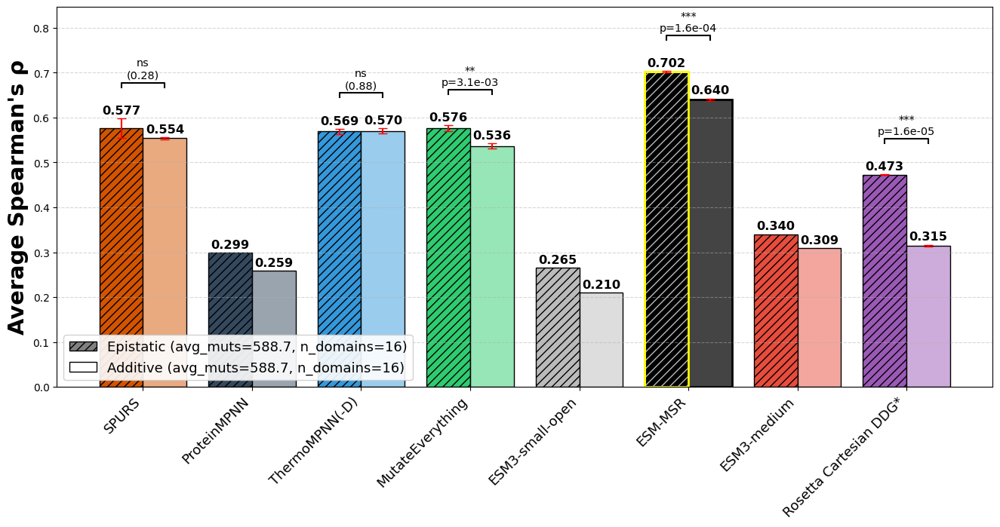

In [31]:
# For ~52,000 testing doubles, compare additive approximation to original (combined/epistatic) prediction (grouped by structure, then take mean)
import analysis_utils_msr
import importlib
importlib.reload(analysis_utils_msr)
analysis_utils_msr.create_metric_comparison_chart_epistatic(df_scores_epistatic.loc[('hyperopt_splits-D-test', 'grouped')], ['SPURS', 'ProteinMPNN', 'ThermoMPNN(-D)', 'MutateEverything', 'ESM3-small-open', 'ESM-MSR', 'ESM3-medium', 'Rosetta Cartesian DDG'], highlighted_model='ESM-MSR', title=None, y_label='Average Spearman\'s ρ', figsize=(16,8), bracket_height_factor=0.05, fontsize_multiplier=1.3, legend_loc='lower left') # 'ESM3-small-open_masked','ESM-MSR_masked', 'ESM-MSR_single', 'ESM-MSR_reg', 'ESM-MSR_hybrid',

(<Figure size 1600x600 with 1 Axes>, <Axes: ylabel="Pooled Spearman's ρ">)

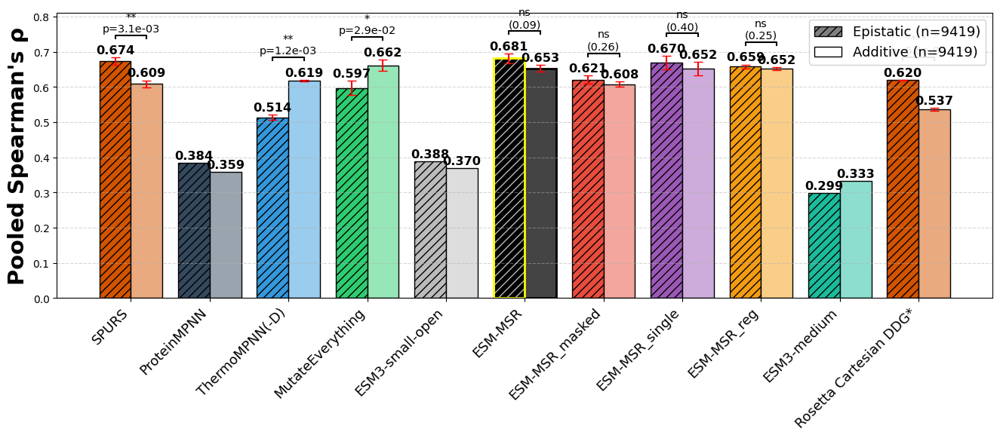

In [32]:
# For ~52,000 testing doubles, compare additive approximation to original (combined/epistatic) prediction (pool all predictions together)

analysis_utils_msr.create_metric_comparison_chart_epistatic(df_scores_epistatic.loc[('hyperopt_splits-D-test', 'ungrouped')], ['SPURS', 'ProteinMPNN', 'ThermoMPNN(-D)', 'MutateEverything', 'ESM3-small-open', 'ESM3-small-open_masked', 'ESM-MSR', 'ESM-MSR_masked', 'ESM-MSR_single', 'ESM-MSR_reg', 'ESM3-medium', 'Rosetta Cartesian DDG'], highlighted_model='ESM-MSR', title=None, y_label='Pooled Spearman\'s ρ', figsize=(16,6), is_grouped=False) #'Grouped Performance Comparison on Doubles from Feb19_Tsuboyama Test Set'

In [33]:
# repeat analysis for specifically only stabilizing or destabilizing mutations

df_pos = df.loc[df['ddG']>0]

df_scores_pos = pd.DataFrame(index=pd.MultiIndex.from_product([['hyperopt_splits-test'], ['ungrouped', 'grouped']]))
df_scores_pos_doubles = pd.DataFrame(index=pd.MultiIndex.from_product([['hyperopt_splits-D-test'], ['ungrouped', 'grouped']]))

df_scores_pos = assess_all_models(df_pos, df_scores_pos, assess_grouped_spearman, splits=['hyperopt_splits-test'])
df_scores_pos_doubles = assess_all_models(df_pos, df_scores_pos_doubles, assess_grouped_spearman, splits=['hyperopt_splits-D-test'])

df_neg = df.loc[df['ddG']<=0]

df_scores_neg = pd.DataFrame(index=pd.MultiIndex.from_product([['hyperopt_splits-test'], ['ungrouped', 'grouped']]))
df_scores_neg_doubles = pd.DataFrame(index=pd.MultiIndex.from_product([['hyperopt_splits-D-test'], ['ungrouped', 'grouped']]))

df_scores_neg = assess_all_models(df_neg, df_scores_neg, assess_grouped_spearman, splits=['hyperopt_splits-test'])
df_scores_neg_doubles = assess_all_models(df_neg, df_scores_neg_doubles, assess_grouped_spearman, splits=['hyperopt_splits-D-test'])

df_scores_combined = df_scores.join(df_scores_pos, rsuffix='_pos').join(df_scores_neg, rsuffix='_neg')
df_scores_combined

df_scores_combined_doubles = df_scores.join(df_scores_pos_doubles, rsuffix='_pos').join(df_scores_neg_doubles, rsuffix='_neg')
df_scores_combined_doubles

ESM-MSR_1   ESM-MSR_1_n  ESM-MSR_1_groups  \
hyperopt_splits-S-test ungrouped   0.785192  25954.000000               NaN   
                       grouped     0.821352    998.230769              26.0   
hyperopt_splits-D-test ungrouped   0.665504   9419.000000               NaN   
                       grouped     0.702488    588.687500              16.0   
hyperopt_splits-test   ungrouped   0.815709  35373.000000               NaN   
                       grouped     0.835421   1360.500000              26.0   

                                  ESM-MSR_2   ESM-MSR_2_n  ESM-MSR_2_groups  \
hyperopt_splits-S-test ungrouped   0.790002  25954.000000               NaN   
                       grouped     0.824226    998.230769              26.0   
hyperopt_splits-D-test ungrouped   0.679237   9419.000000               NaN   
                       grouped     0.699611    588.687500              16.0   
hyperopt_splits-test   ungrouped   0.820583  35373.000000               NaN   
                       grouped     0.837904   1360.500000              26.0   

                                  ESM-MSR_3   ESM-MSR_3_n  ESM-MSR_3_groups  \
hyperopt_splits-S-test ungrouped   0.786219  25954.000000               NaN   
                       grouped     0.822006    998.230769              26.0   
hyperopt_splits-D-test ungrouped   0.699706   9419.000000               NaN   
                       grouped     0.702791    588.687500              16.0   
hyperopt_splits-test   ungrouped   0.821720  35373.000000               NaN   
                       grouped     0.835824   1360.500000              26.0   

                                  ESM-MSR_alpha_med_1  ...  \
hyperopt_splits-S-test ungrouped             0.717026  ...   
                       grouped               0.757339  ...   
hyperopt_splits-D-test ungrouped             0.592073  ...   
                       grouped               0.605299  ...   
hyperopt_splits-test   ungrouped             0.766881  ...   
                       grouped               0.782106  ...   

                                  Rosetta Cartesian DDG_1_groups_neg  \
hyperopt_splits-S-test ungrouped                                 NaN   
                       grouped                                   NaN   
hyperopt_splits-D-test ungrouped                                 NaN   
                       grouped                                  16.0   
hyperopt_splits-test   ungrouped                                 NaN   
                       grouped                                   NaN   

                                  Rosetta Cartesian DDG_2_neg  \
hyperopt_splits-S-test ungrouped                          NaN   
                       grouped                            NaN   
hyperopt_splits-D-test ungrouped                     0.606277   
                       grouped                       0.474223   
hyperopt_splits-test   ungrouped                          NaN   
                       grouped                            NaN   

                                  Rosetta Cartesian DDG_2_n_neg  \
hyperopt_splits-S-test ungrouped                            NaN   
                       grouped                              NaN   
hyperopt_splits-D-test ungrouped                       8998.000   
                       grouped                          562.375   
hyperopt_splits-test   ungrouped                            NaN   
                       grouped                              NaN   

                                  Rosetta Cartesian DDG_2_groups_neg  \
hyperopt_splits-S-test ungrouped                                 NaN   
                       grouped                                   NaN   
hyperopt_splits-D-test ungrouped                                 NaN   
                       grouped                                  16.0   
hyperopt_splits-test   ungrouped                                 NaN   
                       grouped                                   NaN   

 

In [34]:
df_scores_combined[[c for c in df_scores_combined.columns if ('SPURS' in c and '_group' in c)]]

SPURS_1_groups  SPURS_2_groups  \
hyperopt_splits-S-test ungrouped             NaN             NaN   
                       grouped              26.0            26.0   
hyperopt_splits-D-test ungrouped             NaN             NaN   
                       grouped              16.0            16.0   
hyperopt_splits-test   ungrouped             NaN             NaN   
                       grouped              26.0            26.0   

                                  SPURS_3_groups  SPURS_1_groups_pos  \
hyperopt_splits-S-test ungrouped             NaN                 NaN   
                       grouped              26.0                 NaN   
hyperopt_splits-D-test ungrouped             NaN                 NaN   
                       grouped              16.0                 NaN   
hyperopt_splits-test   ungrouped             NaN                 NaN   
                       grouped              26.0                26.0   

                                  SPURS_2_groups_pos  SPURS_3_groups_pos  \
hyperopt_splits-S-test ungrouped                 NaN                 NaN   
                       grouped                   NaN                 NaN   
hyperopt_splits-D-test ungrouped                 NaN                 NaN   
                       grouped                   NaN                 NaN   
hyperopt_splits-test   ungrouped                 NaN                 NaN   
                       grouped                  26.0                26.0   

                                  SPURS_1_groups_neg  SPURS_2_groups_neg  \
hyperopt_splits-S-test ungrouped                 NaN                 NaN   
                       grouped                   NaN                 NaN   
hyperopt_splits-D-test ungrouped                 NaN                 NaN   
                       grouped                   NaN                 NaN   
hyperopt_splits-test   ungrouped                 NaN                 NaN   
                       grouped                  26.0                26.0   

                                  SPURS_3_groups_neg  
hyperopt_splits-S-test ungrouped                 NaN  
                       grouped                   NaN  
hyperopt_splits-D-test ungrouped                 NaN  
                       grouped                   NaN  
hyperopt_splits-test   ungrouped                 NaN  
                       grouped                  26.0

(<Figure size 1600x800 with 1 Axes>, <Axes: ylabel="Average Spearman's ρ">)

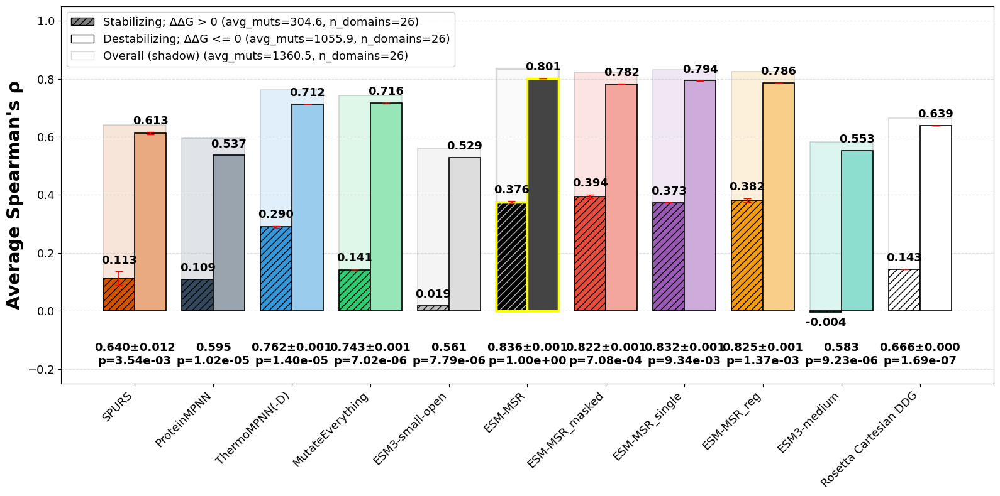

In [35]:
import analysis_utils_msr
import importlib
importlib.reload(analysis_utils_msr) 

analysis_utils_msr.create_pos_neg_overall_chart(
    df_scores_combined.loc[('hyperopt_splits-test', 'grouped')], 
    ['SPURS', 'ProteinMPNN', 'ThermoMPNN(-D)', 'MutateEverything', 'ESM3-small-open', 'ESM-MSR', 'ESM-MSR_masked', 'ESM-MSR_single', 'ESM-MSR_reg', 'ESM3-medium', 'Rosetta Cartesian DDG'], p_value_y_coord=-0.15,
    title=None, y_label='Average Spearman\'s ρ', highlighted_model='ESM-MSR', enforce_global_n=True, epistasis=False, figsize=(16, 8), ylim=(-0.25, 1.05), legend_loc='upper left', fontsize_multiplier=1.3) #'ESM-MSR_direct',

(<Figure size 1400x600 with 1 Axes>, <Axes: ylabel="Pooled Spearman's ρ">)

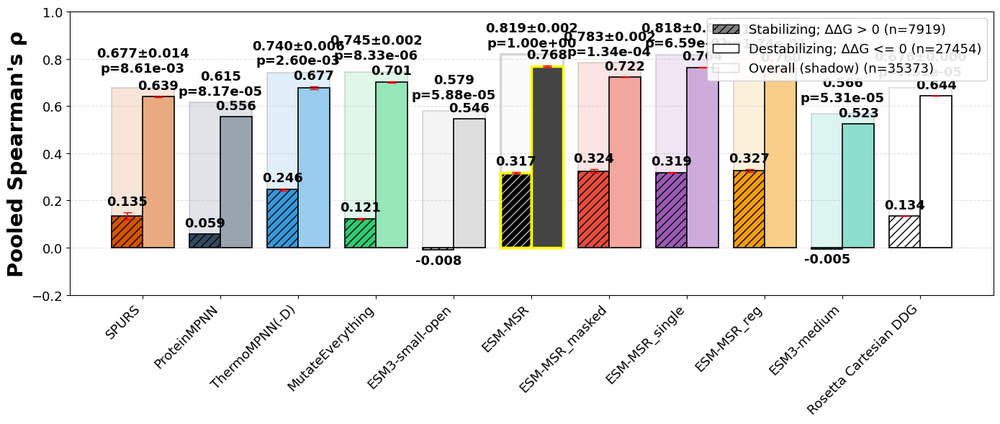

In [36]:
analysis_utils_msr.create_pos_neg_overall_chart(df_scores_combined.loc[('hyperopt_splits-test', 'ungrouped')], ['SPURS', 'ProteinMPNN', 'ThermoMPNN(-D)', 'MutateEverything', 'ESM3-small-open', 'ESM-MSR', 'ESM-MSR_masked', 'ESM-MSR_single', 'ESM-MSR_reg', 'ESM3-medium', 'Rosetta Cartesian DDG'], title=None, y_label='Pooled Spearman\'s ρ', highlighted_model='ESM-MSR', enforce_global_n=False, epistasis=False, ylim=(-0.2, 1), is_grouped=False, fontsize_multiplier=1.3) #'ESM-MSR_direct', 

In [37]:
# repeat pos vs neg analysis, for doubles only now

df_pos = df.loc[df['ddG']>0] #.dropna()
df_scores_pos_doubles = pd.DataFrame(index=pd.MultiIndex.from_product([['hyperopt_splits-D-test'], ['ungrouped', 'grouped']]))

df_scores_pos_doubles = assess_all_models(df_pos.loc[df_pos['mut_type'].str.contains(':')], df_scores_pos_doubles, assess_grouped_spearman, splits=('hyperopt_splits-D-test', 'hyperopt_splits-test'))

df_neg = df.loc[df['ddG']<=0] #.dropna()
df_scores_neg_doubles = pd.DataFrame(index=pd.MultiIndex.from_product([['hyperopt_splits-D-test'], ['ungrouped', 'grouped']]))

df_scores_neg_doubles = assess_all_models(df_neg.loc[df_neg['mut_type'].str.contains(':')], df_scores_neg_doubles, assess_grouped_spearman, splits=('hyperopt_splits-D-test', 'hyperopt_splits-test'))

df_scores_combined_doubles = df_scores.join(df_scores_pos_doubles, rsuffix='_pos').join(df_scores_neg_doubles, rsuffix='_neg')
df_scores_combined_doubles

ESM-MSR_1   ESM-MSR_1_n  ESM-MSR_1_groups  \
hyperopt_splits-S-test ungrouped   0.785192  25954.000000               NaN   
                       grouped     0.821352    998.230769              26.0   
hyperopt_splits-D-test ungrouped   0.665504   9419.000000               NaN   
                       grouped     0.702488    588.687500              16.0   
hyperopt_splits-test   ungrouped   0.815709  35373.000000               NaN   
                       grouped     0.835421   1360.500000              26.0   

                                  ESM-MSR_2   ESM-MSR_2_n  ESM-MSR_2_groups  \
hyperopt_splits-S-test ungrouped   0.790002  25954.000000               NaN   
                       grouped     0.824226    998.230769              26.0   
hyperopt_splits-D-test ungrouped   0.679237   9419.000000               NaN   
                       grouped     0.699611    588.687500              16.0   
hyperopt_splits-test   ungrouped   0.820583  35373.000000               NaN   
                       grouped     0.837904   1360.500000              26.0   

                                  ESM-MSR_3   ESM-MSR_3_n  ESM-MSR_3_groups  \
hyperopt_splits-S-test ungrouped   0.786219  25954.000000               NaN   
                       grouped     0.822006    998.230769              26.0   
hyperopt_splits-D-test ungrouped   0.699706   9419.000000               NaN   
                       grouped     0.702791    588.687500              16.0   
hyperopt_splits-test   ungrouped   0.821720  35373.000000               NaN   
                       grouped     0.835824   1360.500000              26.0   

                                  ESM-MSR_alpha_med_1  ...  \
hyperopt_splits-S-test ungrouped             0.717026  ...   
                       grouped               0.757339  ...   
hyperopt_splits-D-test ungrouped             0.592073  ...   
                       grouped               0.605299  ...   
hyperopt_splits-test   ungrouped             0.766881  ...   
                       grouped               0.782106  ...   

                                  Rosetta Cartesian DDG_1_groups_neg  \
hyperopt_splits-S-test ungrouped                                 NaN   
                       grouped                                   NaN   
hyperopt_splits-D-test ungrouped                                 NaN   
                       grouped                                  16.0   
hyperopt_splits-test   ungrouped                                 NaN   
                       grouped                                  16.0   

                                  Rosetta Cartesian DDG_2_neg  \
hyperopt_splits-S-test ungrouped                          NaN   
                       grouped                            NaN   
hyperopt_splits-D-test ungrouped                     0.606277   
                       grouped                       0.474223   
hyperopt_splits-test   ungrouped                     0.606277   
                       grouped                       0.474223   

                                  Rosetta Cartesian DDG_2_n_neg  \
hyperopt_splits-S-test ungrouped                            NaN   
                       grouped                              NaN   
hyperopt_splits-D-test ungrouped                       8998.000   
                       grouped                          562.375   
hyperopt_splits-test   ungrouped                       8998.000   
                       grouped                          562.375   

                                  Rosetta Cartesian DDG_2_groups_neg  \
hyperopt_splits-S-test ungrouped                                 NaN   
                       grouped                                   NaN   
hyperopt_splits-D-test ungrouped                                 NaN   
                       grouped                                  16.0   
hyperopt_splits-test   ungrouped                                 NaN   
                       grouped                                  16.0   

 

(<Figure size 1400x600 with 1 Axes>, <Axes: ylabel="Average Spearman's ρ">)

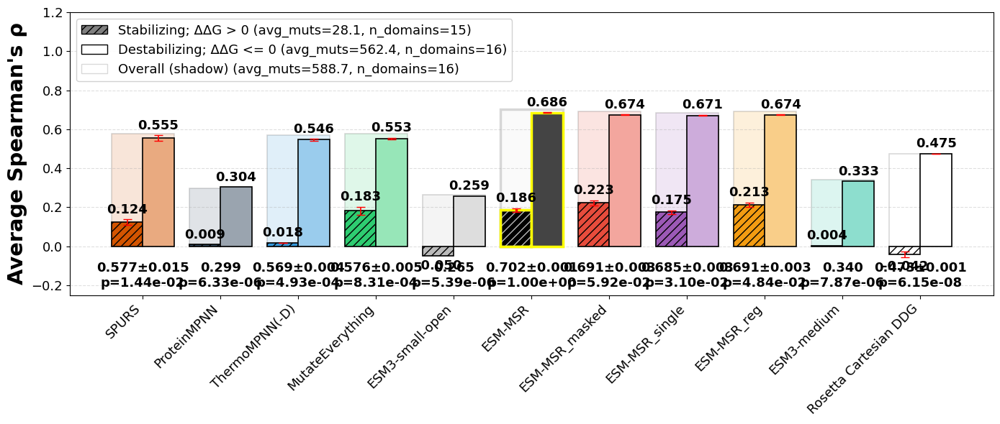

In [38]:
analysis_utils_msr.create_pos_neg_overall_chart(df_scores_combined_doubles.loc[('hyperopt_splits-D-test', 'grouped')], ['SPURS', 'ProteinMPNN', 'ThermoMPNN(-D)', 'MutateEverything', 'ESM3-small-open', 'ESM-MSR', 'ESM-MSR_masked', 'ESM-MSR_single', 'ESM-MSR_reg', 'ESM3-medium', 'Rosetta Cartesian DDG'], title=None, y_label='Average Spearman\'s ρ', highlighted_model='ESM-MSR', enforce_global_n=False, epistasis=False, fontsize_multiplier=1.3, legend_loc='upper left', ylim=(-0.25, 1.2), p_value_y_coord=-0.15)

(<Figure size 1400x600 with 1 Axes>, <Axes: ylabel="Pooled Spearman's ρ">)

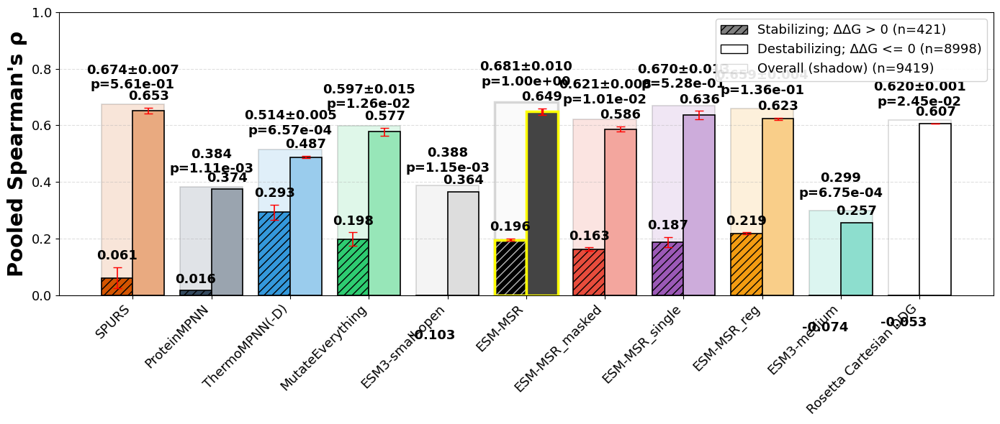

In [39]:
analysis_utils_msr.create_pos_neg_overall_chart(df_scores_combined_doubles.loc[('hyperopt_splits-D-test', 'ungrouped')], ['SPURS', 'ProteinMPNN', 'ThermoMPNN(-D)', 'MutateEverything', 'ESM3-small-open', 'ESM-MSR', 'ESM-MSR_masked', 'ESM-MSR_single', 'ESM-MSR_reg', 'ESM3-medium', 'Rosetta Cartesian DDG'], title=None, y_label='Pooled Spearman\'s ρ', highlighted_model='ESM-MSR', enforce_global_n=False, epistasis=False, fontsize_multiplier=1.3, is_grouped=False)

In [40]:
import importlib
importlib.reload(analysis_utils_msr)
from analysis_utils_msr import compute_dddg

df_scores_dddG = pd.DataFrame(index=pd.MultiIndex.from_product([['hyperopt_splits-D-test'], ['ungrouped', 'grouped']]))
df_dddG = df_epistatic.copy(deep=True)
df_dddG = compute_dddg(df_dddG)
df_dddG

,ThermoMPNN_1,ThermoMPNN(-D)_1,ThermoMPNN_2,ThermoMPNN(-D)_2,ThermoMPNN_3,ThermoMPNN(-D)_3,ThermoMPNN(-D)_additive_1,ThermoMPNN(-D)_additive_2,ThermoMPNN(-D)_additive_3,ddG_ML_thermo,...,ESM-MSR_reg_2_dddG,ESM-MSR_reg_3_dddG,ESM-MSR_masked_1_dddG,ESM-MSR_masked_2_dddG,ESM-MSR_masked_3_dddG,ESM-MSR_chain_1_dddG,ESM-MSR_chain_2_dddG,ESM-MSR_chain_3_dddG,ESM3-small-open_chain_dddG,ddG_dddG
uid,,,,,,,,,,,,,,,,,,,,,
1A32_A45C,0.034338,0.034338,0.115269,0.115269,0.117202,0.117202,0.034338,0.115269,0.117202,0.382630,...,0.000000,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,0.000000,NaN
1A32_A45D,-0.257602,-0.257602,-0.379225,-0.379225,-0.371619,-0.371619,-0.257602,-0.379225,-0.371619,-0.012520,...,0.000000,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,0.000000,NaN
1A32_A45E,0.043376,0.043376,0.074698,0.074698,-0.010692,-0.010692,0.043376,0.074698,-0.010692,0.259534,...,0.000000,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,0.000000,NaN
1A32_A45F,-0.295836,-0.295836,-0.265312,-0.265312,-0.211021,-0.211021,-0.295836,-0.265312,-0.211021,-0.290754,...,0.000000,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,0.000000,NaN
1A32_A45G,-0.620984,-0.620984,-0.603478,-0.603478,-0.642486,-0.642486,-0.620984,-0.603478,-0.642486,-0.221574,...,0.000000,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,0.000000,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5Z2S_Q6Y:T32L,-2.958814,-0.401634,-2.384932,-0.651087,-2.981587,-0.683561,-2.958814,-2.384932,-2.981587,NaN,...,0.201202,0.293250,0.142675,0.366686,0.128785,0.181892,-0.043702,-0.018860,0.419556,0.031983
5Z2S_Q6Y:T32R,-3.986097,-1.572264,-3.397662,-1.681113,-3.673438,-1.880959,-3.986097,-3.397662,-3.673438,NaN,...,0.939045,1.120312,0.342804,0.720729,0.429574,1.602677,1.379327,1.321713,0.968750,NaN
5Z2S_Q6Y:T32S,-2.614838,-0.826301,-2.199923,-1.092642,-2.571861,-1.488389,-2.614838,-2.199923,-2.571861,NaN,...,0.265761,0.305374,0.213138,0.459001,0.327026,0.320448,0.318685,0.388190,1.220703,0.043992


In [41]:
df_scores_dddG = pd.DataFrame(index=pd.MultiIndex.from_product([['hyperopt_splits-D-test'], ['ungrouped', 'grouped']]))

df_scores_dddG = assess_grouped_spearman(df_dddG.loc[df_dddG['mut_type'].str.contains(':')], df_scores_dddG, 'ESM-MSR_1', 'hyperopt_splits-D-test', pred_col='ESM-MSR_1_dddG', label='ddG_dddG')
df_scores_dddG = assess_grouped_spearman(df_dddG.loc[df_dddG['mut_type'].str.contains(':')], df_scores_dddG, 'ESM-MSR_2', 'hyperopt_splits-D-test', pred_col='ESM-MSR_2_dddG', label='ddG_dddG')
df_scores_dddG = assess_grouped_spearman(df_dddG.loc[df_dddG['mut_type'].str.contains(':')], df_scores_dddG, 'ESM-MSR_3', 'hyperopt_splits-D-test', pred_col='ESM-MSR_3_dddG', label='ddG_dddG')

df_scores_dddG = assess_grouped_spearman(df_dddG.loc[df_dddG['mut_type'].str.contains(':')], df_scores_dddG, 'ESM-MSR_alpha_med_1', 'hyperopt_splits-D-test', pred_col='ESM-MSR_alpha_med_1_dddG', label='ddG_dddG')
df_scores_dddG = assess_grouped_spearman(df_dddG.loc[df_dddG['mut_type'].str.contains(':')], df_scores_dddG, 'ESM-MSR_alpha_med_2', 'hyperopt_splits-D-test', pred_col='ESM-MSR_alpha_med_2_dddG', label='ddG_dddG')
df_scores_dddG = assess_grouped_spearman(df_dddG.loc[df_dddG['mut_type'].str.contains(':')], df_scores_dddG, 'ESM-MSR_alpha_med_3', 'hyperopt_splits-D-test', pred_col='ESM-MSR_alpha_med_3_dddG', label='ddG_dddG')

df_scores_dddG = assess_grouped_spearman(df_dddG.loc[df_dddG['mut_type'].str.contains(':')], df_scores_dddG, 'ESM-MSR_alpha_low_1', 'hyperopt_splits-D-test', pred_col='ESM-MSR_alpha_low_1_dddG', label='ddG_dddG')
df_scores_dddG = assess_grouped_spearman(df_dddG.loc[df_dddG['mut_type'].str.contains(':')], df_scores_dddG, 'ESM-MSR_alpha_low_2', 'hyperopt_splits-D-test', pred_col='ESM-MSR_alpha_low_2_dddG', label='ddG_dddG')
df_scores_dddG = assess_grouped_spearman(df_dddG.loc[df_dddG['mut_type'].str.contains(':')], df_scores_dddG, 'ESM-MSR_alpha_low_3', 'hyperopt_splits-D-test', pred_col='ESM-MSR_alpha_low_3_dddG', label='ddG_dddG')

df_scores_dddG = assess_grouped_spearman(df_dddG.loc[df_dddG['mut_type'].str.contains(':')], df_scores_dddG, 'ESM-MSR_single_1', 'hyperopt_splits-D-test', pred_col='ESM-MSR_single_1_dddG', label='ddG_dddG')
df_scores_dddG = assess_grouped_spearman(df_dddG.loc[df_dddG['mut_type'].str.contains(':')], df_scores_dddG, 'ESM-MSR_single_2', 'hyperopt_splits-D-test', pred_col='ESM-MSR_single_2_dddG', label='ddG_dddG')
df_scores_dddG = assess_grouped_spearman(df_dddG.loc[df_dddG['mut_type'].str.contains(':')], df_scores_dddG, 'ESM-MSR_single_3', 'hyperopt_splits-D-test', pred_col='ESM-MSR_single_3_dddG', label='ddG_dddG')

df_scores_dddG = assess_grouped_spearman(df_dddG.loc[df_dddG['mut_type'].str.contains(':')], df_scores_dddG, 'ESM-MSR_reg_1', 'hyperopt_splits-D-test', pred_col='ESM-MSR_reg_1_dddG', label='ddG_dddG')
df_scores_dddG = assess_grouped_spearman(df_dddG.loc[df_dddG['mut_type'].str.contains(':')], df_scores_dddG, 'ESM-MSR_reg_2', 'hyperopt_splits-D-test', pred_col='ESM-MSR_reg_2_dddG', label='ddG_dddG')
df_scores_dddG = assess_grouped_spearman(df_dddG.loc[df_dddG['mut_type'].str.contains(':')], df_scores_dddG, 'ESM-MSR_reg_3', 'hyperopt_splits-D-test', pred_col='ESM-MSR_reg_3_dddG', label='ddG_dddG')

#df_scores_dddG = assess_grouped_spearman(df_dddG.loc[df_dddG['mut_type'].str.contains(':')], df_scores_dddG, 'ESM-MSR_hybrid', 'hyperopt_splits-D-test', pred_col='ESM-MSR_hybrid_dddG', label='ddG_dddG')

df_scores_dddG = assess_grouped_spearman(df_dddG.loc[df_dddG['mut_type'].str.contains(':')], df_scores_dddG, 'ESM-MSR_masked_1', 'hyperopt_splits-D-test', pred_col='ESM-MSR_masked_1_dddG', label='ddG_dddG')
df_scores_dddG = assess_grouped_spearman(df_dddG.loc[df_dddG['mut_type'].str.contains(':')], df_scores_dddG, 'ESM-MSR_masked_2', 'hyperopt_splits-D-test', pred_col='ESM-MSR_masked_2_dddG', label='ddG_dddG')
df_scores_dddG = assess_grouped_spearman(df_dddG.loc[df_dddG['mut_type'].str.contains(':')], df_scores_dddG, 'ESM-MSR_masked_3', 'hyperopt_splits-D-test', pred_col='ESM-MSR_masked_3_dddG', label='ddG_dddG')

df_scores_dddG = assess_grouped_spearman(df_dddG.loc[df_dddG['mut_type'].str.contains(':')], df_scores_dddG, 'Negative_additive', 'hyperopt_splits-D-test', pred_col='ddG_additive', label='ddG_dddG')
df_scores_dddG['Negative_additive'] *= -1

df_scores_dddG = assess_grouped_spearman(df_dddG.loc[df_dddG['mut_type'].str.contains(':')], df_scores_dddG, 'SPURS_1', 'hyperopt_splits-D-test', pred_col='SPURS_1_dddG', label='ddG_dddG')
df_scores_dddG = assess_grouped_spearman(df_dddG.loc[df_dddG['mut_type'].str.contains(':')], df_scores_dddG, 'SPURS_2', 'hyperopt_splits-D-test', pred_col='SPURS_2_dddG', label='ddG_dddG')
df_scores_dddG = assess_grouped_spearman(df_dddG.loc[df_dddG['mut_type'].str.contains(':')], df_scores_dddG, 'SPURS_3', 'hyperopt_splits-D-test', pred_col='SPURS_3_dddG', label='ddG_dddG')

df_scores_dddG = assess_grouped_spearman(df_dddG.loc[df_dddG['mut_type'].str.contains(':')], df_scores_dddG, 'ThermoMPNN(-D)_1', 'hyperopt_splits-D-test', pred_col='ThermoMPNN(-D)_1_dddG', label='ddG_dddG')
df_scores_dddG = assess_grouped_spearman(df_dddG.loc[df_dddG['mut_type'].str.contains(':')], df_scores_dddG, 'ThermoMPNN(-D)_2', 'hyperopt_splits-D-test', pred_col='ThermoMPNN(-D)_2_dddG', label='ddG_dddG')
df_scores_dddG = assess_grouped_spearman(df_dddG.loc[df_dddG['mut_type'].str.contains(':')], df_scores_dddG, 'ThermoMPNN(-D)_3', 'hyperopt_splits-D-test', pred_col='ThermoMPNN(-D)_3_dddG', label='ddG_dddG')

df_scores_dddG = assess_grouped_spearman(df_dddG.loc[df_dddG['mut_type'].str.contains(':')], df_scores_dddG, 'MutateEverything_1', 'hyperopt_splits-D-test', pred_col='MutateEverything_1_dddG', label='ddG_dddG')
df_scores_dddG = assess_grouped_spearman(df_dddG.loc[df_dddG['mut_type'].str.contains(':')], df_scores_dddG, 'MutateEverything_2', 'hyperopt_splits-D-test', pred_col='MutateEverything_2_dddG', label='ddG_dddG')
df_scores_dddG = assess_grouped_spearman(df_dddG.loc[df_dddG['mut_type'].str.contains(':')], df_scores_dddG, 'MutateEverything_3', 'hyperopt_splits-D-test', pred_col='MutateEverything_3_dddG', label='ddG_dddG')

df_scores_dddG = assess_grouped_spearman(df_dddG.loc[df_dddG['mut_type'].str.contains(':')], df_scores_dddG, 'ESM3-small-open', 'hyperopt_splits-D-test', pred_col='ESM3-small-open_dddG', label='ddG_dddG')
df_scores_dddG = assess_grouped_spearman(df_dddG.loc[df_dddG['mut_type'].str.contains(':')], df_scores_dddG, 'ESM3-small-open_masked', 'hyperopt_splits-D-test', pred_col='ESM3-small-open_masked_dddG', label='ddG_dddG')
df_scores_dddG = assess_grouped_spearman(df_dddG.loc[df_dddG['mut_type'].str.contains(':')], df_scores_dddG, 'ESM3-small', 'hyperopt_splits-D-test', pred_col='ESM3-small_dddG', label='ddG_dddG')
df_scores_dddG = assess_grouped_spearman(df_dddG.loc[df_dddG['mut_type'].str.contains(':')], df_scores_dddG, 'ESM3-medium', 'hyperopt_splits-D-test', pred_col='ESM3-medium_dddG', label='ddG_dddG')
df_scores_dddG = assess_grouped_spearman(df_dddG.loc[df_dddG['mut_type'].str.contains(':')], df_scores_dddG, 'ESM3-large', 'hyperopt_splits-D-test', pred_col='ESM3-large_dddG', label='ddG_dddG')

df_scores_dddG = assess_grouped_spearman(df_dddG.loc[df_dddG['mut_type'].str.contains(':')], df_scores_dddG, 'Rosetta Cartesian DDG_1', 'hyperopt_splits-D-test', pred_col='Rosetta Cartesian DDG_1_dddG', label='ddG_dddG')
df_scores_dddG = assess_grouped_spearman(df_dddG.loc[df_dddG['mut_type'].str.contains(':')], df_scores_dddG, 'Rosetta Cartesian DDG_2', 'hyperopt_splits-D-test', pred_col='Rosetta Cartesian DDG_2_dddG', label='ddG_dddG')
df_scores_dddG = assess_grouped_spearman(df_dddG.loc[df_dddG['mut_type'].str.contains(':')], df_scores_dddG, 'Rosetta Cartesian DDG_3', 'hyperopt_splits-D-test', pred_col='Rosetta Cartesian DDG_3_dddG', label='ddG_dddG')

df_scores_dddG = assess_grouped_spearman(df_dddG.loc[df_dddG['mut_type'].str.contains(':')], df_scores_dddG, 'ProteinMPNN', 'hyperopt_splits-D-test', pred_col='ProteinMPNN_dddG', label='ddG_dddG')

df_scores_dddG



df_dddG_pos = df_dddG.loc[df_dddG['ddG_dddG']>=0]
df_scores_dddG_pos = pd.DataFrame(index=pd.MultiIndex.from_product([['hyperopt_splits-D-test'], ['ungrouped', 'grouped']]))

df_scores_dddG_pos = assess_grouped_spearman(df_dddG_pos.loc[df_dddG_pos['mut_type'].str.contains(':')], df_scores_dddG_pos, 'ESM-MSR_1', 'hyperopt_splits-D-test', pred_col='ESM-MSR_1_dddG', label='ddG_dddG')
df_scores_dddG_pos = assess_grouped_spearman(df_dddG_pos.loc[df_dddG_pos['mut_type'].str.contains(':')], df_scores_dddG_pos, 'ESM-MSR_2', 'hyperopt_splits-D-test', pred_col='ESM-MSR_2_dddG', label='ddG_dddG')
df_scores_dddG_pos = assess_grouped_spearman(df_dddG_pos.loc[df_dddG_pos['mut_type'].str.contains(':')], df_scores_dddG_pos, 'ESM-MSR_3', 'hyperopt_splits-D-test', pred_col='ESM-MSR_3_dddG', label='ddG_dddG')

df_scores_dddG_pos = assess_grouped_spearman(df_dddG_pos.loc[df_dddG_pos['mut_type'].str.contains(':')], df_scores_dddG_pos, 'ESM-MSR_alpha_med_1', 'hyperopt_splits-D-test', pred_col='ESM-MSR_alpha_med_1_dddG', label='ddG_dddG')
df_scores_dddG_pos = assess_grouped_spearman(df_dddG_pos.loc[df_dddG_pos['mut_type'].str.contains(':')], df_scores_dddG_pos, 'ESM-MSR_alpha_med_2', 'hyperopt_splits-D-test', pred_col='ESM-MSR_alpha_med_2_dddG', label='ddG_dddG')
df_scores_dddG_pos = assess_grouped_spearman(df_dddG_pos.loc[df_dddG_pos['mut_type'].str.contains(':')], df_scores_dddG_pos, 'ESM-MSR_alpha_med_3', 'hyperopt_splits-D-test', pred_col='ESM-MSR_alpha_med_3_dddG', label='ddG_dddG')

df_scores_dddG_pos = assess_grouped_spearman(df_dddG_pos.loc[df_dddG_pos['mut_type'].str.contains(':')], df_scores_dddG_pos, 'ESM-MSR_alpha_low_1', 'hyperopt_splits-D-test', pred_col='ESM-MSR_alpha_low_1_dddG', label='ddG_dddG')
df_scores_dddG_pos = assess_grouped_spearman(df_dddG_pos.loc[df_dddG_pos['mut_type'].str.contains(':')], df_scores_dddG_pos, 'ESM-MSR_alpha_low_2', 'hyperopt_splits-D-test', pred_col='ESM-MSR_alpha_low_2_dddG', label='ddG_dddG')
df_scores_dddG_pos = assess_grouped_spearman(df_dddG_pos.loc[df_dddG_pos['mut_type'].str.contains(':')], df_scores_dddG_pos, 'ESM-MSR_alpha_low_3', 'hyperopt_splits-D-test', pred_col='ESM-MSR_alpha_low_3_dddG', label='ddG_dddG')

df_scores_dddG_pos = assess_grouped_spearman(df_dddG_pos.loc[df_dddG_pos['mut_type'].str.contains(':')], df_scores_dddG_pos, 'ESM-MSR_single_1', 'hyperopt_splits-D-test', pred_col='ESM-MSR_single_1_dddG', label='ddG_dddG')
df_scores_dddG_pos = assess_grouped_spearman(df_dddG_pos.loc[df_dddG_pos['mut_type'].str.contains(':')], df_scores_dddG_pos, 'ESM-MSR_single_2', 'hyperopt_splits-D-test', pred_col='ESM-MSR_single_2_dddG', label='ddG_dddG')
df_scores_dddG_pos = assess_grouped_spearman(df_dddG_pos.loc[df_dddG_pos['mut_type'].str.contains(':')], df_scores_dddG_pos, 'ESM-MSR_single_3', 'hyperopt_splits-D-test', pred_col='ESM-MSR_single_3_dddG', label='ddG_dddG')

df_scores_dddG_pos = assess_grouped_spearman(df_dddG_pos.loc[df_dddG_pos['mut_type'].str.contains(':')], df_scores_dddG_pos, 'ESM-MSR_reg_1', 'hyperopt_splits-D-test', pred_col='ESM-MSR_reg_1_dddG', label='ddG_dddG')
df_scores_dddG_pos = assess_grouped_spearman(df_dddG_pos.loc[df_dddG_pos['mut_type'].str.contains(':')], df_scores_dddG_pos, 'ESM-MSR_reg_2', 'hyperopt_splits-D-test', pred_col='ESM-MSR_reg_2_dddG', label='ddG_dddG')
df_scores_dddG_pos = assess_grouped_spearman(df_dddG_pos.loc[df_dddG_pos['mut_type'].str.contains(':')], df_scores_dddG_pos, 'ESM-MSR_reg_3', 'hyperopt_splits-D-test', pred_col='ESM-MSR_reg_3_dddG', label='ddG_dddG')

#df_scores_dddG_pos = assess_grouped_spearman(df_dddG_pos.loc[df_dddG_pos['mut_type'].str.contains(':')], df_scores_dddG_pos, 'ESM-MSR_hybrid', 'hyperopt_splits-D-test', pred_col='ESM-MSR_hybrid_dddG', label='ddG_dddG')

df_scores_dddG_pos = assess_grouped_spearman(df_dddG_pos.loc[df_dddG_pos['mut_type'].str.contains(':')], df_scores_dddG_pos, 'ESM-MSR_masked_1', 'hyperopt_splits-D-test', pred_col='ESM-MSR_masked_1_dddG', label='ddG_dddG')
df_scores_dddG_pos = assess_grouped_spearman(df_dddG_pos.loc[df_dddG_pos['mut_type'].str.contains(':')], df_scores_dddG_pos, 'ESM-MSR_masked_2', 'hyperopt_splits-D-test', pred_col='ESM-MSR_masked_2_dddG', label='ddG_dddG')
df_scores_dddG_pos = assess_grouped_spearman(df_dddG_pos.loc[df_dddG_pos['mut_type'].str.contains(':')], df_scores_dddG_pos, 'ESM-MSR_masked_3', 'hyperopt_splits-D-test', pred_col='ESM-MSR_masked_3_dddG', label='ddG_dddG')

df_scores_dddG_pos = assess_grouped_spearman(df_dddG_pos.loc[df_dddG_pos['mut_type'].str.contains(':')], df_scores_dddG_pos, 'Negative_additive', 'hyperopt_splits-D-test', pred_col='ddG_additive', label='ddG_dddG')
df_scores_dddG_pos['Negative_additive'] *= -1

df_scores_dddG_pos = assess_grouped_spearman(df_dddG_pos.loc[df_dddG_pos['mut_type'].str.contains(':')], df_scores_dddG_pos, 'SPURS_1', 'hyperopt_splits-D-test', pred_col='SPURS_1_dddG', label='ddG_dddG')
df_scores_dddG_pos = assess_grouped_spearman(df_dddG_pos.loc[df_dddG_pos['mut_type'].str.contains(':')], df_scores_dddG_pos, 'SPURS_2', 'hyperopt_splits-D-test', pred_col='SPURS_2_dddG', label='ddG_dddG')
df_scores_dddG_pos = assess_grouped_spearman(df_dddG_pos.loc[df_dddG_pos['mut_type'].str.contains(':')], df_scores_dddG_pos, 'SPURS_3', 'hyperopt_splits-D-test', pred_col='SPURS_3_dddG', label='ddG_dddG')

df_scores_dddG_pos = assess_grouped_spearman(df_dddG_pos.loc[df_dddG_pos['mut_type'].str.contains(':')], df_scores_dddG_pos, 'ThermoMPNN(-D)_1', 'hyperopt_splits-D-test', pred_col='ThermoMPNN(-D)_1_dddG', label='ddG_dddG')
df_scores_dddG_pos = assess_grouped_spearman(df_dddG_pos.loc[df_dddG_pos['mut_type'].str.contains(':')], df_scores_dddG_pos, 'ThermoMPNN(-D)_2', 'hyperopt_splits-D-test', pred_col='ThermoMPNN(-D)_2_dddG', label='ddG_dddG')
df_scores_dddG_pos = assess_grouped_spearman(df_dddG_pos.loc[df_dddG_pos['mut_type'].str.contains(':')], df_scores_dddG_pos, 'ThermoMPNN(-D)_3', 'hyperopt_splits-D-test', pred_col='ThermoMPNN(-D)_3_dddG', label='ddG_dddG')

df_scores_dddG_pos = assess_grouped_spearman(df_dddG_pos.loc[df_dddG_pos['mut_type'].str.contains(':')], df_scores_dddG_pos, 'MutateEverything_1', 'hyperopt_splits-D-test', pred_col='MutateEverything_1_dddG', label='ddG_dddG')
df_scores_dddG_pos = assess_grouped_spearman(df_dddG_pos.loc[df_dddG_pos['mut_type'].str.contains(':')], df_scores_dddG_pos, 'MutateEverything_2', 'hyperopt_splits-D-test', pred_col='MutateEverything_2_dddG', label='ddG_dddG')
df_scores_dddG_pos = assess_grouped_spearman(df_dddG_pos.loc[df_dddG_pos['mut_type'].str.contains(':')], df_scores_dddG_pos, 'MutateEverything_3', 'hyperopt_splits-D-test', pred_col='MutateEverything_3_dddG', label='ddG_dddG')

df_scores_dddG_pos = assess_grouped_spearman(df_dddG_pos.loc[df_dddG_pos['mut_type'].str.contains(':')], df_scores_dddG_pos, 'ESM3-small-open', 'hyperopt_splits-D-test', pred_col='ESM3-small-open_dddG', label='ddG_dddG')
df_scores_dddG_pos = assess_grouped_spearman(df_dddG_pos.loc[df_dddG_pos['mut_type'].str.contains(':')], df_scores_dddG_pos, 'ESM3-small-open_masked', 'hyperopt_splits-D-test', pred_col='ESM3-small-open_masked_dddG', label='ddG_dddG')
df_scores_dddG_pos = assess_grouped_spearman(df_dddG_pos.loc[df_dddG_pos['mut_type'].str.contains(':')], df_scores_dddG_pos, 'ESM3-small', 'hyperopt_splits-D-test', pred_col='ESM3-small_dddG', label='ddG_dddG')
df_scores_dddG_pos = assess_grouped_spearman(df_dddG_pos.loc[df_dddG_pos['mut_type'].str.contains(':')], df_scores_dddG_pos, 'ESM3-medium', 'hyperopt_splits-D-test', pred_col='ESM3-medium_dddG', label='ddG_dddG')
df_scores_dddG_pos = assess_grouped_spearman(df_dddG_pos.loc[df_dddG_pos['mut_type'].str.contains(':')], df_scores_dddG_pos, 'ESM3-large', 'hyperopt_splits-D-test', pred_col='ESM3-large_dddG', label='ddG_dddG')

df_scores_dddG_pos = assess_grouped_spearman(df_dddG_pos.loc[df_dddG_pos['mut_type'].str.contains(':')], df_scores_dddG_pos, 'Rosetta Cartesian DDG_1', 'hyperopt_splits-D-test', pred_col='Rosetta Cartesian DDG_1_dddG', label='ddG_dddG')
df_scores_dddG_pos = assess_grouped_spearman(df_dddG_pos.loc[df_dddG_pos['mut_type'].str.contains(':')], df_scores_dddG_pos, 'Rosetta Cartesian DDG_2', 'hyperopt_splits-D-test', pred_col='Rosetta Cartesian DDG_2_dddG', label='ddG_dddG')
df_scores_dddG_pos = assess_grouped_spearman(df_dddG_pos.loc[df_dddG_pos['mut_type'].str.contains(':')], df_scores_dddG_pos, 'Rosetta Cartesian DDG_3', 'hyperopt_splits-D-test', pred_col='Rosetta Cartesian DDG_3_dddG', label='ddG_dddG')

df_scores_dddG_pos = assess_grouped_spearman(df_dddG_pos.loc[df_dddG_pos['mut_type'].str.contains(':')], df_scores_dddG_pos, 'ProteinMPNN', 'hyperopt_splits-D-test', pred_col='ProteinMPNN_dddG', label='ddG_dddG')



df_dddG_neg = df_dddG.loc[df_dddG['ddG_dddG']<0]
df_scores_dddG_neg = pd.DataFrame(index=pd.MultiIndex.from_product([['hyperopt_splits-D-test'], ['ungrouped', 'grouped']]))

df_scores_dddG_neg = assess_grouped_spearman(df_dddG_neg.loc[df_dddG_neg['mut_type'].str.contains(':')], df_scores_dddG_neg, 'ESM-MSR_1', 'hyperopt_splits-D-test', pred_col='ESM-MSR_1_dddG', label='ddG_dddG')
df_scores_dddG_neg = assess_grouped_spearman(df_dddG_neg.loc[df_dddG_neg['mut_type'].str.contains(':')], df_scores_dddG_neg, 'ESM-MSR_2', 'hyperopt_splits-D-test', pred_col='ESM-MSR_2_dddG', label='ddG_dddG')
df_scores_dddG_neg = assess_grouped_spearman(df_dddG_neg.loc[df_dddG_neg['mut_type'].str.contains(':')], df_scores_dddG_neg, 'ESM-MSR_3', 'hyperopt_splits-D-test', pred_col='ESM-MSR_3_dddG', label='ddG_dddG')

df_scores_dddG_neg = assess_grouped_spearman(df_dddG_neg.loc[df_dddG_neg['mut_type'].str.contains(':')], df_scores_dddG_neg, 'ESM-MSR_alpha_med_1', 'hyperopt_splits-D-test', pred_col='ESM-MSR_alpha_med_1_dddG', label='ddG_dddG')
df_scores_dddG_neg = assess_grouped_spearman(df_dddG_neg.loc[df_dddG_neg['mut_type'].str.contains(':')], df_scores_dddG_neg, 'ESM-MSR_alpha_med_2', 'hyperopt_splits-D-test', pred_col='ESM-MSR_alpha_med_2_dddG', label='ddG_dddG')
df_scores_dddG_neg = assess_grouped_spearman(df_dddG_neg.loc[df_dddG_neg['mut_type'].str.contains(':')], df_scores_dddG_neg, 'ESM-MSR_alpha_med_3', 'hyperopt_splits-D-test', pred_col='ESM-MSR_alpha_med_3_dddG', label='ddG_dddG')

df_scores_dddG_neg = assess_grouped_spearman(df_dddG_neg.loc[df_dddG_neg['mut_type'].str.contains(':')], df_scores_dddG_neg, 'ESM-MSR_alpha_low_1', 'hyperopt_splits-D-test', pred_col='ESM-MSR_alpha_low_1_dddG', label='ddG_dddG')
df_scores_dddG_neg = assess_grouped_spearman(df_dddG_neg.loc[df_dddG_neg['mut_type'].str.contains(':')], df_scores_dddG_neg, 'ESM-MSR_alpha_low_2', 'hyperopt_splits-D-test', pred_col='ESM-MSR_alpha_low_2_dddG', label='ddG_dddG')
df_scores_dddG_neg = assess_grouped_spearman(df_dddG_neg.loc[df_dddG_neg['mut_type'].str.contains(':')], df_scores_dddG_neg, 'ESM-MSR_alpha_low_3', 'hyperopt_splits-D-test', pred_col='ESM-MSR_alpha_low_3_dddG', label='ddG_dddG')

df_scores_dddG_neg = assess_grouped_spearman(df_dddG_neg.loc[df_dddG_neg['mut_type'].str.contains(':')], df_scores_dddG_neg, 'ESM-MSR_single_1', 'hyperopt_splits-D-test', pred_col='ESM-MSR_single_1_dddG', label='ddG_dddG')
df_scores_dddG_neg = assess_grouped_spearman(df_dddG_neg.loc[df_dddG_neg['mut_type'].str.contains(':')], df_scores_dddG_neg, 'ESM-MSR_single_2', 'hyperopt_splits-D-test', pred_col='ESM-MSR_single_2_dddG', label='ddG_dddG')
df_scores_dddG_neg = assess_grouped_spearman(df_dddG_neg.loc[df_dddG_neg['mut_type'].str.contains(':')], df_scores_dddG_neg, 'ESM-MSR_single_3', 'hyperopt_splits-D-test', pred_col='ESM-MSR_single_3_dddG', label='ddG_dddG')

df_scores_dddG_neg = assess_grouped_spearman(df_dddG_neg.loc[df_dddG_neg['mut_type'].str.contains(':')], df_scores_dddG_neg, 'ESM-MSR_reg_1', 'hyperopt_splits-D-test', pred_col='ESM-MSR_reg_1_dddG', label='ddG_dddG')
df_scores_dddG_neg = assess_grouped_spearman(df_dddG_neg.loc[df_dddG_neg['mut_type'].str.contains(':')], df_scores_dddG_neg, 'ESM-MSR_reg_2', 'hyperopt_splits-D-test', pred_col='ESM-MSR_reg_2_dddG', label='ddG_dddG')
df_scores_dddG_neg = assess_grouped_spearman(df_dddG_neg.loc[df_dddG_neg['mut_type'].str.contains(':')], df_scores_dddG_neg, 'ESM-MSR_reg_3', 'hyperopt_splits-D-test', pred_col='ESM-MSR_reg_3_dddG', label='ddG_dddG')

#df_scores_dddG_neg = assess_grouped_spearman(df_dddG_neg.loc[df_dddG_neg['mut_type'].str.contains(':')], df_scores_dddG_neg, 'ESM-MSR_hybrid', 'hyperopt_splits-D-test', pred_col='ESM-MSR_hybrid_dddG', label='ddG_dddG')

df_scores_dddG_neg = assess_grouped_spearman(df_dddG_neg.loc[df_dddG_neg['mut_type'].str.contains(':')], df_scores_dddG_neg, 'ESM-MSR_masked_1', 'hyperopt_splits-D-test', pred_col='ESM-MSR_masked_1_dddG', label='ddG_dddG')
df_scores_dddG_neg = assess_grouped_spearman(df_dddG_neg.loc[df_dddG_neg['mut_type'].str.contains(':')], df_scores_dddG_neg, 'ESM-MSR_masked_2', 'hyperopt_splits-D-test', pred_col='ESM-MSR_masked_2_dddG', label='ddG_dddG')
df_scores_dddG_neg = assess_grouped_spearman(df_dddG_neg.loc[df_dddG_neg['mut_type'].str.contains(':')], df_scores_dddG_neg, 'ESM-MSR_masked_3', 'hyperopt_splits-D-test', pred_col='ESM-MSR_masked_3_dddG', label='ddG_dddG')

df_scores_dddG_neg = assess_grouped_spearman(df_dddG_neg.loc[df_dddG_neg['mut_type'].str.contains(':')], df_scores_dddG_neg, 'Negative_additive', 'hyperopt_splits-D-test', pred_col='ddG_additive', label='ddG_dddG')
df_scores_dddG_neg['Negative_additive'] *= -1

df_scores_dddG_neg = assess_grouped_spearman(df_dddG_neg.loc[df_dddG_neg['mut_type'].str.contains(':')], df_scores_dddG_neg, 'SPURS_1', 'hyperopt_splits-D-test', pred_col='SPURS_1_dddG', label='ddG_dddG')
df_scores_dddG_neg = assess_grouped_spearman(df_dddG_neg.loc[df_dddG_neg['mut_type'].str.contains(':')], df_scores_dddG_neg, 'SPURS_2', 'hyperopt_splits-D-test', pred_col='SPURS_2_dddG', label='ddG_dddG')
df_scores_dddG_neg = assess_grouped_spearman(df_dddG_neg.loc[df_dddG_neg['mut_type'].str.contains(':')], df_scores_dddG_neg, 'SPURS_3', 'hyperopt_splits-D-test', pred_col='SPURS_3_dddG', label='ddG_dddG')

df_scores_dddG_neg = assess_grouped_spearman(df_dddG_neg.loc[df_dddG_neg['mut_type'].str.contains(':')], df_scores_dddG_neg, 'ThermoMPNN(-D)_1', 'hyperopt_splits-D-test', pred_col='ThermoMPNN(-D)_1_dddG', label='ddG_dddG')
df_scores_dddG_neg = assess_grouped_spearman(df_dddG_neg.loc[df_dddG_neg['mut_type'].str.contains(':')], df_scores_dddG_neg, 'ThermoMPNN(-D)_2', 'hyperopt_splits-D-test', pred_col='ThermoMPNN(-D)_2_dddG', label='ddG_dddG')
df_scores_dddG_neg = assess_grouped_spearman(df_dddG_neg.loc[df_dddG_neg['mut_type'].str.contains(':')], df_scores_dddG_neg, 'ThermoMPNN(-D)_3', 'hyperopt_splits-D-test', pred_col='ThermoMPNN(-D)_3_dddG', label='ddG_dddG')

df_scores_dddG_neg = assess_grouped_spearman(df_dddG_neg.loc[df_dddG_neg['mut_type'].str.contains(':')], df_scores_dddG_neg, 'MutateEverything_1', 'hyperopt_splits-D-test', pred_col='MutateEverything_1_dddG', label='ddG_dddG')
df_scores_dddG_neg = assess_grouped_spearman(df_dddG_neg.loc[df_dddG_neg['mut_type'].str.contains(':')], df_scores_dddG_neg, 'MutateEverything_2', 'hyperopt_splits-D-test', pred_col='MutateEverything_2_dddG', label='ddG_dddG')
df_scores_dddG_neg = assess_grouped_spearman(df_dddG_neg.loc[df_dddG_neg['mut_type'].str.contains(':')], df_scores_dddG_neg, 'MutateEverything_3', 'hyperopt_splits-D-test', pred_col='MutateEverything_3_dddG', label='ddG_dddG')

df_scores_dddG_neg = assess_grouped_spearman(df_dddG_neg.loc[df_dddG_neg['mut_type'].str.contains(':')], df_scores_dddG_neg, 'ESM3-small-open', 'hyperopt_splits-D-test', pred_col='ESM3-small-open_dddG', label='ddG_dddG')
df_scores_dddG_neg = assess_grouped_spearman(df_dddG_neg.loc[df_dddG_neg['mut_type'].str.contains(':')], df_scores_dddG_neg, 'ESM3-small-open_masked', 'hyperopt_splits-D-test', pred_col='ESM3-small-open_masked_dddG', label='ddG_dddG')
df_scores_dddG_neg = assess_grouped_spearman(df_dddG_neg.loc[df_dddG_neg['mut_type'].str.contains(':')], df_scores_dddG_neg, 'ESM3-small', 'hyperopt_splits-D-test', pred_col='ESM3-small_dddG', label='ddG_dddG')
df_scores_dddG_neg = assess_grouped_spearman(df_dddG_neg.loc[df_dddG_neg['mut_type'].str.contains(':')], df_scores_dddG_neg, 'ESM3-medium', 'hyperopt_splits-D-test', pred_col='ESM3-medium_dddG', label='ddG_dddG')
df_scores_dddG_neg = assess_grouped_spearman(df_dddG_neg.loc[df_dddG_neg['mut_type'].str.contains(':')], df_scores_dddG_neg, 'ESM3-large', 'hyperopt_splits-D-test', pred_col='ESM3-large_dddG', label='ddG_dddG')

df_scores_dddG_neg = assess_grouped_spearman(df_dddG_neg.loc[df_dddG_neg['mut_type'].str.contains(':')], df_scores_dddG_neg, 'Rosetta Cartesian DDG_1', 'hyperopt_splits-D-test', pred_col='Rosetta Cartesian DDG_1_dddG', label='ddG_dddG')
df_scores_dddG_neg = assess_grouped_spearman(df_dddG_neg.loc[df_dddG_neg['mut_type'].str.contains(':')], df_scores_dddG_neg, 'Rosetta Cartesian DDG_2', 'hyperopt_splits-D-test', pred_col='Rosetta Cartesian DDG_2_dddG', label='ddG_dddG')
df_scores_dddG_neg = assess_grouped_spearman(df_dddG_neg.loc[df_dddG_neg['mut_type'].str.contains(':')], df_scores_dddG_neg, 'Rosetta Cartesian DDG_3', 'hyperopt_splits-D-test', pred_col='Rosetta Cartesian DDG_3_dddG', label='ddG_dddG')

df_scores_dddG_neg = assess_grouped_spearman(df_dddG_neg.loc[df_dddG_neg['mut_type'].str.contains(':')], df_scores_dddG_neg, 'ProteinMPNN', 'hyperopt_splits-D-test', pred_col='ProteinMPNN_dddG', label='ddG_dddG')

df_scores_dddG_combined = df_scores_dddG.join(df_scores_dddG_pos, rsuffix='_pos').join(df_scores_dddG_neg, rsuffix='_neg')

df_scores_dddG_combined[[c for c in df_scores_dddG_combined.columns if 'ESM-MSR' in c]].columns



AssertionError: Column 'ESM3-small-open_masked_dddG' missing from df_preds

(<Figure size 1600x800 with 1 Axes>, <Axes: ylabel="Average Spearman's ρ">)

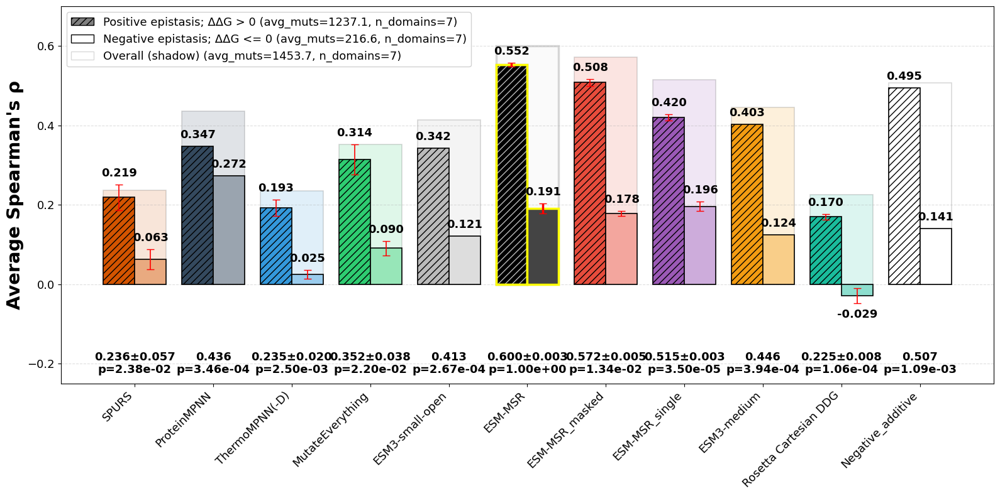

In [ ]:
import importlib
importlib.reload(analysis_utils_msr)
analysis_utils_msr.create_pos_neg_overall_chart(df_scores_dddG_combined.loc[('hyperopt_splits-D-test', 'grouped')], ['SPURS', 'ProteinMPNN', 'ThermoMPNN(-D)', 'MutateEverything', 'ESM3-small-open', 'ESM-MSR', 'ESM-MSR_masked', 'ESM-MSR_single',  'ESM3-medium', 'Rosetta Cartesian DDG', 'Negative_additive'], #'ESM3-small',  'ESM3-large',  'ESM3-small-open_masked','ESM-MSR_masked', 'ESM-MSR_single', 'ESM-MSR_reg',
                                                 title=None, y_label='Average Spearman\'s ρ', highlighted_model='ESM-MSR', enforce_global_n=False, figsize=(16,8), ylim=(-0.25, 0.7), legend_loc='upper left',  p_value_y_coord=-0.2, fontsize_multiplier=1.3)


(<Figure size 1600x1000 with 1 Axes>, <Axes: ylabel="Pooled Spearman's ρ">)

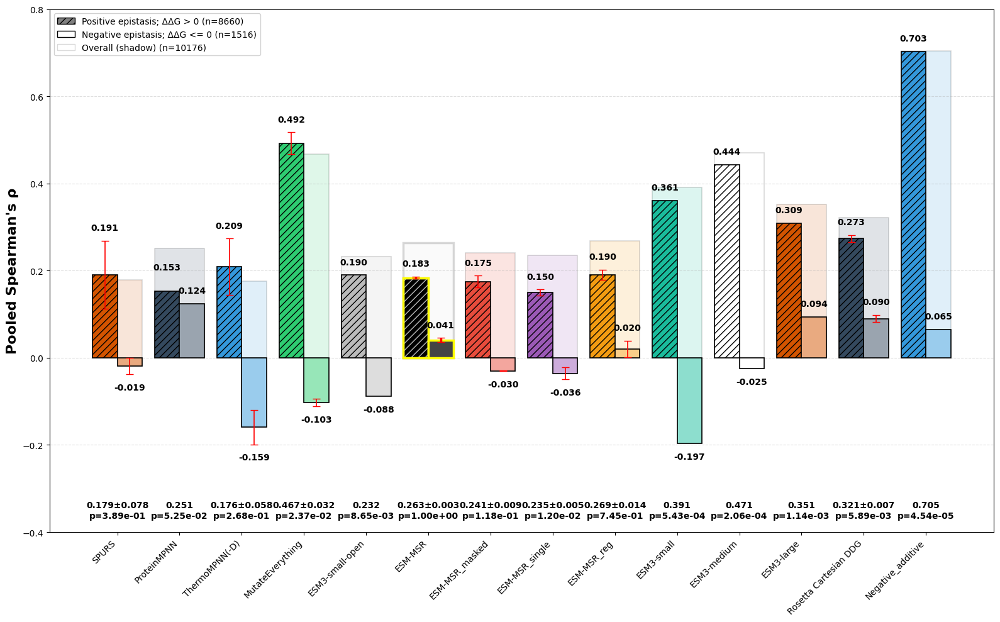

In [ ]:
analysis_utils_msr.create_pos_neg_overall_chart(df_scores_dddG_combined.loc[('hyperopt_splits-D-test', 'ungrouped')], ['SPURS', 'ProteinMPNN', 'ThermoMPNN(-D)', 'MutateEverything', 'ESM3-small-open', 'ESM-MSR', 'ESM-MSR_masked', 'ESM-MSR_single', 'ESM-MSR_reg', 'ESM3-small', 'ESM3-medium', 'ESM3-large', 'Rosetta Cartesian DDG', 'Negative_additive'],
 title=None, y_label='Pooled Spearman\'s ρ', highlighted_model='ESM-MSR', enforce_global_n=False, figsize=(16,10), ylim=(-0.4, 0.8), p_value_y_coord=-0.35, legend_loc='upper left', fontsize_multiplier=1., is_grouped=False)


In [ ]:
import importlib
importlib.reload(analysis_utils_msr)
from analysis_utils_msr import assess_classification_metric

df_scores_dddG_cls = pd.DataFrame(index=pd.MultiIndex.from_product([['hyperopt_splits-D-test'], ['ungrouped']]))
assess_auroc = partial(assess_classification_metric, metric_name='auroc', flip_labels=True)

df_scores_dddG_cls = assess_auroc(df_dddG.loc[df_dddG['mut_type'].str.contains(':')], df_scores_dddG_cls, 'ESM-MSR_1', 'hyperopt_splits-D-test', pred_col='ESM-MSR_1_dddG', label='ddG_dddG')
df_scores_dddG_cls = assess_auroc(df_dddG.loc[df_dddG['mut_type'].str.contains(':')], df_scores_dddG_cls, 'ESM-MSR_2', 'hyperopt_splits-D-test', pred_col='ESM-MSR_2_dddG', label='ddG_dddG')
df_scores_dddG_cls = assess_auroc(df_dddG.loc[df_dddG['mut_type'].str.contains(':')], df_scores_dddG_cls, 'ESM-MSR_3', 'hyperopt_splits-D-test', pred_col='ESM-MSR_3_dddG', label='ddG_dddG')

df_scores_dddG_cls = assess_auroc(df_dddG.loc[df_dddG['mut_type'].str.contains(':')], df_scores_dddG_cls, 'ESM-MSR_alpha_med_1', 'hyperopt_splits-D-test', pred_col='ESM-MSR_alpha_med_1_dddG', label='ddG_dddG')
df_scores_dddG_cls = assess_auroc(df_dddG.loc[df_dddG['mut_type'].str.contains(':')], df_scores_dddG_cls, 'ESM-MSR_alpha_med_2', 'hyperopt_splits-D-test', pred_col='ESM-MSR_alpha_med_2_dddG', label='ddG_dddG')
df_scores_dddG_cls = assess_auroc(df_dddG.loc[df_dddG['mut_type'].str.contains(':')], df_scores_dddG_cls, 'ESM-MSR_alpha_med_3', 'hyperopt_splits-D-test', pred_col='ESM-MSR_alpha_med_3_dddG', label='ddG_dddG')

df_scores_dddG_cls = assess_auroc(df_dddG.loc[df_dddG['mut_type'].str.contains(':')], df_scores_dddG_cls, 'ESM-MSR_alpha_low_1', 'hyperopt_splits-D-test', pred_col='ESM-MSR_alpha_low_1_dddG', label='ddG_dddG')
df_scores_dddG_cls = assess_auroc(df_dddG.loc[df_dddG['mut_type'].str.contains(':')], df_scores_dddG_cls, 'ESM-MSR_alpha_low_2', 'hyperopt_splits-D-test', pred_col='ESM-MSR_alpha_low_2_dddG', label='ddG_dddG')
df_scores_dddG_cls = assess_auroc(df_dddG.loc[df_dddG['mut_type'].str.contains(':')], df_scores_dddG_cls, 'ESM-MSR_alpha_low_3', 'hyperopt_splits-D-test', pred_col='ESM-MSR_alpha_low_3_dddG', label='ddG_dddG')

df_scores_dddG_cls = assess_auroc(df_dddG.loc[df_dddG['mut_type'].str.contains(':')], df_scores_dddG_cls, 'ESM-MSR_single_1', 'hyperopt_splits-D-test', pred_col='ESM-MSR_single_1_dddG', label='ddG_dddG')
df_scores_dddG_cls = assess_auroc(df_dddG.loc[df_dddG['mut_type'].str.contains(':')], df_scores_dddG_cls, 'ESM-MSR_single_2', 'hyperopt_splits-D-test', pred_col='ESM-MSR_single_2_dddG', label='ddG_dddG')
df_scores_dddG_cls = assess_auroc(df_dddG.loc[df_dddG['mut_type'].str.contains(':')], df_scores_dddG_cls, 'ESM-MSR_single_3', 'hyperopt_splits-D-test', pred_col='ESM-MSR_single_3_dddG', label='ddG_dddG')

df_scores_dddG_cls = assess_auroc(df_dddG.loc[df_dddG['mut_type'].str.contains(':')], df_scores_dddG_cls, 'ESM-MSR_reg_1', 'hyperopt_splits-D-test', pred_col='ESM-MSR_reg_1_dddG', label='ddG_dddG')
df_scores_dddG_cls = assess_auroc(df_dddG.loc[df_dddG['mut_type'].str.contains(':')], df_scores_dddG_cls, 'ESM-MSR_reg_2', 'hyperopt_splits-D-test', pred_col='ESM-MSR_reg_2_dddG', label='ddG_dddG')
df_scores_dddG_cls = assess_auroc(df_dddG.loc[df_dddG['mut_type'].str.contains(':')], df_scores_dddG_cls, 'ESM-MSR_reg_3', 'hyperopt_splits-D-test', pred_col='ESM-MSR_reg_3_dddG', label='ddG_dddG')

#df_scores_dddG_cls = assess_auroc(df_dddG.loc[df_dddG['mut_type'].str.contains(':')], df_scores_dddG_cls, 'ESM-MSR_hybrid', 'hyperopt_splits-D-test', pred_col='ESM-MSR_hybrid_dddG', label='ddG_dddG')

df_scores_dddG_cls = assess_auroc(df_dddG.loc[df_dddG['mut_type'].str.contains(':')], df_scores_dddG_cls, 'ESM-MSR_masked_1', 'hyperopt_splits-D-test', pred_col='ESM-MSR_masked_1_dddG', label='ddG_dddG')
df_scores_dddG_cls = assess_auroc(df_dddG.loc[df_dddG['mut_type'].str.contains(':')], df_scores_dddG_cls, 'ESM-MSR_masked_2', 'hyperopt_splits-D-test', pred_col='ESM-MSR_masked_2_dddG', label='ddG_dddG')
df_scores_dddG_cls = assess_auroc(df_dddG.loc[df_dddG['mut_type'].str.contains(':')], df_scores_dddG_cls, 'ESM-MSR_masked_3', 'hyperopt_splits-D-test', pred_col='ESM-MSR_masked_3_dddG', label='ddG_dddG')

#df_scores_dddG_cls = assess_auroc(df_dddG.loc[df_dddG['mut_type'].str.contains(':')], df_scores_dddG_cls, 'Negative_additive', 'hyperopt_splits-D-test', pred_col='ddG_additive', label='ddG_dddG')
#df_scores_dddG_cls['Negative_additive'] *= -1

df_scores_dddG_cls = assess_auroc(df_dddG.loc[df_dddG['mut_type'].str.contains(':')], df_scores_dddG_cls, 'SPURS_1', 'hyperopt_splits-D-test', pred_col='SPURS_1_dddG', label='ddG_dddG')
df_scores_dddG_cls = assess_auroc(df_dddG.loc[df_dddG['mut_type'].str.contains(':')], df_scores_dddG_cls, 'SPURS_2', 'hyperopt_splits-D-test', pred_col='SPURS_2_dddG', label='ddG_dddG')
df_scores_dddG_cls = assess_auroc(df_dddG.loc[df_dddG['mut_type'].str.contains(':')], df_scores_dddG_cls, 'SPURS_3', 'hyperopt_splits-D-test', pred_col='SPURS_3_dddG', label='ddG_dddG')

df_scores_dddG_cls = assess_auroc(df_dddG.loc[df_dddG['mut_type'].str.contains(':')], df_scores_dddG_cls, 'ThermoMPNN(-D)_1', 'hyperopt_splits-D-test', pred_col='ThermoMPNN(-D)_1_dddG', label='ddG_dddG')
df_scores_dddG_cls = assess_auroc(df_dddG.loc[df_dddG['mut_type'].str.contains(':')], df_scores_dddG_cls, 'ThermoMPNN(-D)_2', 'hyperopt_splits-D-test', pred_col='ThermoMPNN(-D)_2_dddG', label='ddG_dddG')
df_scores_dddG_cls = assess_auroc(df_dddG.loc[df_dddG['mut_type'].str.contains(':')], df_scores_dddG_cls, 'ThermoMPNN(-D)_3', 'hyperopt_splits-D-test', pred_col='ThermoMPNN(-D)_3_dddG', label='ddG_dddG')

df_scores_dddG_cls = assess_auroc(df_dddG.loc[df_dddG['mut_type'].str.contains(':')], df_scores_dddG_cls, 'MutateEverything_1', 'hyperopt_splits-D-test', pred_col='MutateEverything_1_dddG', label='ddG_dddG')
df_scores_dddG_cls = assess_auroc(df_dddG.loc[df_dddG['mut_type'].str.contains(':')], df_scores_dddG_cls, 'MutateEverything_2', 'hyperopt_splits-D-test', pred_col='MutateEverything_2_dddG', label='ddG_dddG')
df_scores_dddG_cls = assess_auroc(df_dddG.loc[df_dddG['mut_type'].str.contains(':')], df_scores_dddG_cls, 'MutateEverything_3', 'hyperopt_splits-D-test', pred_col='MutateEverything_3_dddG', label='ddG_dddG')

df_scores_dddG_cls = assess_auroc(df_dddG.loc[df_dddG['mut_type'].str.contains(':')], df_scores_dddG_cls, 'ESM3-small-open', 'hyperopt_splits-D-test', pred_col='ESM3-small-open_dddG', label='ddG_dddG')
df_scores_dddG_cls = assess_auroc(df_dddG.loc[df_dddG['mut_type'].str.contains(':')], df_scores_dddG_cls, 'ESM3-small-open_masked', 'hyperopt_splits-D-test', pred_col='ESM3-small-open_masked_dddG', label='ddG_dddG')
df_scores_dddG_cls = assess_auroc(df_dddG.loc[df_dddG['mut_type'].str.contains(':')], df_scores_dddG_cls, 'ESM3-small', 'hyperopt_splits-D-test', pred_col='ESM3-small_dddG', label='ddG_dddG')
df_scores_dddG_cls = assess_auroc(df_dddG.loc[df_dddG['mut_type'].str.contains(':')], df_scores_dddG_cls, 'ESM3-medium', 'hyperopt_splits-D-test', pred_col='ESM3-medium_dddG', label='ddG_dddG')
df_scores_dddG_cls = assess_auroc(df_dddG.loc[df_dddG['mut_type'].str.contains(':')], df_scores_dddG_cls, 'ESM3-large', 'hyperopt_splits-D-test', pred_col='ESM3-large_dddG', label='ddG_dddG')

df_scores_dddG_cls = assess_auroc(df_dddG.loc[df_dddG['mut_type'].str.contains(':')].fillna(0), df_scores_dddG_cls, 'Rosetta Cartesian DDG_1', 'hyperopt_splits-D-test', pred_col='Rosetta Cartesian DDG_1_dddG', label='ddG_dddG')
df_scores_dddG_cls = assess_auroc(df_dddG.loc[df_dddG['mut_type'].str.contains(':')].fillna(0), df_scores_dddG_cls, 'Rosetta Cartesian DDG_2', 'hyperopt_splits-D-test', pred_col='Rosetta Cartesian DDG_2_dddG', label='ddG_dddG')
df_scores_dddG_cls = assess_auroc(df_dddG.loc[df_dddG['mut_type'].str.contains(':')].fillna(0), df_scores_dddG_cls, 'Rosetta Cartesian DDG_3', 'hyperopt_splits-D-test', pred_col='Rosetta Cartesian DDG_3_dddG', label='ddG_dddG')

df_scores_dddG_cls = assess_auroc(df_dddG.loc[df_dddG['mut_type'].str.contains(':')], df_scores_dddG_cls, 'ProteinMPNN', 'hyperopt_splits-D-test', pred_col='ProteinMPNN_dddG', label='ddG_dddG')

df_scores_dddG_cls


,,ESM-MSR_1,ESM-MSR_1_n,ESM-MSR_2,ESM-MSR_2_n,ESM-MSR_3,ESM-MSR_3_n,ESM-MSR_alpha_med_1,ESM-MSR_alpha_med_1_n,ESM-MSR_alpha_med_2,ESM-MSR_alpha_med_2_n,...,ESM3-large,ESM3-large_n,Rosetta Cartesian DDG_1,Rosetta Cartesian DDG_1_n,Rosetta Cartesian DDG_2,Rosetta Cartesian DDG_2_n,Rosetta Cartesian DDG_3,Rosetta Cartesian DDG_3_n,ProteinMPNN,ProteinMPNN_n
hyperopt_splits-D-test,ungrouped,0.622953,10732.0,0.618774,10732.0,0.621321,10732.0,0.619841,10732.0,0.610215,10732.0,...,0.592513,10732.0,0.638115,10732.0,0.635729,10732.0,0.642032,10732.0,0.60726,10732.0


(<Figure size 1600x600 with 1 Axes>, <Axes: ylabel='AUROC'>)

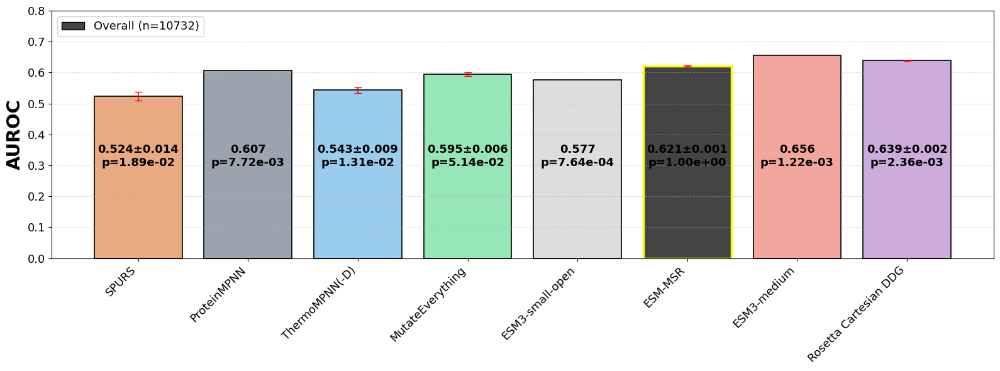

In [ ]:
import importlib
importlib.reload(analysis_utils_msr)
analysis_utils_msr.create_triple_metric_chart_with_pvals(series_bar1=None,
                                      series_bar2=None, 
                                      series_overall=df_scores_dddG_cls.loc[('hyperopt_splits-D-test', 'ungrouped')], 
                                      model_groups=['SPURS', 'ProteinMPNN', 'ThermoMPNN(-D)', 'MutateEverything', 'ESM3-small-open', 'ESM-MSR', 'ESM3-medium', 'Rosetta Cartesian DDG'], #'ESM3-small', 'ESM3-large', 'ESM-MSR_masked', 'ESM-MSR_single', 'ESM-MSR_reg',
                                      title=None, y_label='AUROC', highlighted_model='ESM-MSR', enforce_global_n=False, ylim=(0,0.8), figsize=(16,6), p_value_y_coord=0.33, label_min_sep=0.02, fontsize_multiplier=1.3, legend_loc='upper left', is_grouped=False, highlight_gray='#444444')

(<Figure size 1600x600 with 1 Axes>, <Axes: ylabel='AUPRC'>)

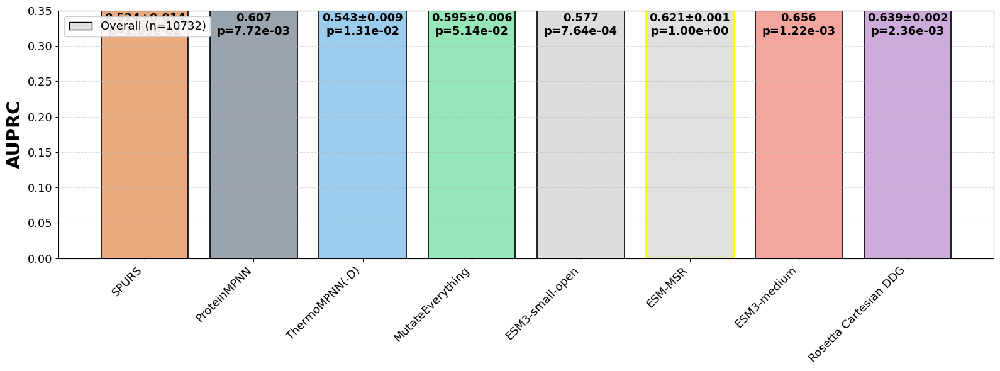

In [ ]:
analysis_utils_msr.create_triple_metric_chart_with_pvals(series_bar1=None,
                                      series_bar2=None, 
                                      series_overall=df_scores_dddG_cls.loc[('hyperopt_splits-D-test', 'ungrouped')], 
                                      model_groups=['SPURS', 'ProteinMPNN', 'ThermoMPNN(-D)', 'MutateEverything', 'ESM3-small-open', 'ESM-MSR', 'ESM3-medium', 'Rosetta Cartesian DDG'], #'ESM3-small', 'ESM3-large', 'ESM-MSR_masked', 'ESM-MSR_single', 'ESM-MSR_reg',
                                      title=None, y_label='AUPRC', highlighted_model='ESM-MSR', enforce_global_n=False, ylim=(0,0.35), figsize=(16,6), p_value_y_coord=0.33, label_min_sep=0.02, fontsize_multiplier=1.3, legend_loc='upper left', is_grouped=False)

(<Figure size 1600x600 with 1 Axes>, <Axes: ylabel='MCC'>)

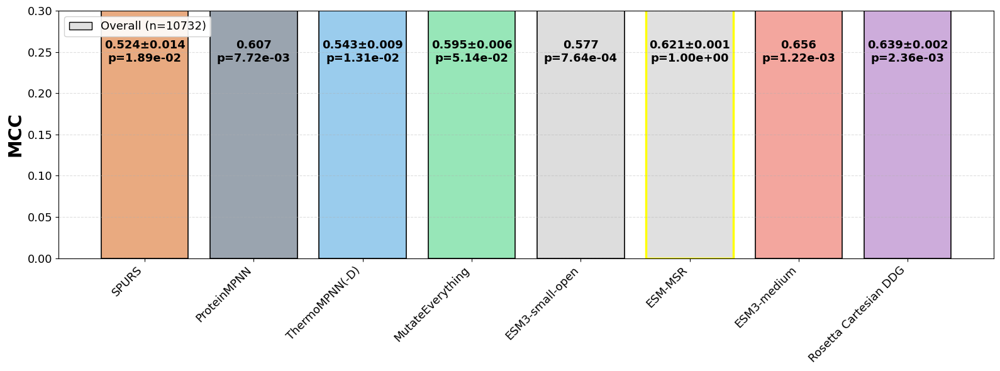

In [ ]:
analysis_utils_msr.create_triple_metric_chart_with_pvals(series_bar1=None,
                                      series_bar2=None, 
                                      series_overall=df_scores_dddG_cls.loc[('hyperopt_splits-D-test', 'ungrouped')], 
                                      model_groups=['SPURS', 'ProteinMPNN', 'ThermoMPNN(-D)', 'MutateEverything', 'ESM3-small-open', 'ESM-MSR', 'ESM3-medium', 'Rosetta Cartesian DDG'], #'ESM3-small', 'ESM3-large', 'ESM-MSR_masked', 'ESM-MSR_single', 'ESM-MSR_reg',
                                      title=None, y_label='MCC', highlighted_model='ESM-MSR', enforce_global_n=False, ylim=(0,0.3), figsize=(16,6), p_value_y_coord=0.25, label_min_sep=0.02, fontsize_multiplier=1.3, legend_loc='upper left', is_grouped=False)

(<Figure size 1600x600 with 1 Axes>, <Axes: ylabel='F1 Score (inverted)'>)

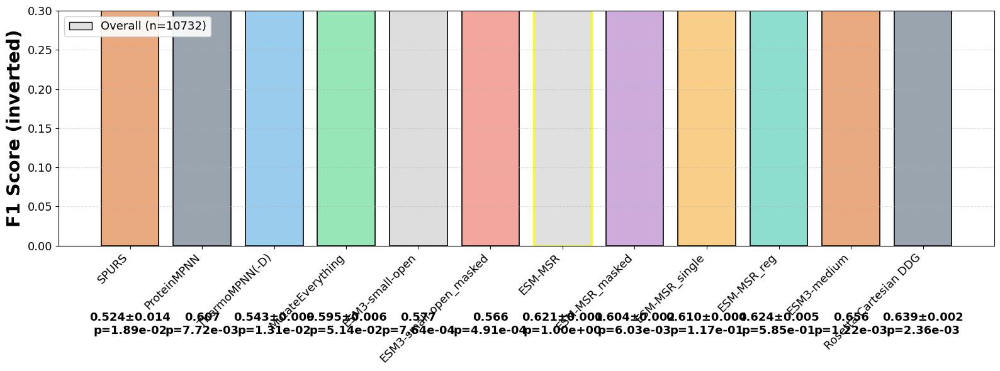

In [ ]:
analysis_utils_msr.create_triple_metric_chart_with_pvals(series_bar1=None,
                                      series_bar2=None, 
                                      series_overall=df_scores_dddG_cls.loc[('hyperopt_splits-D-test', 'ungrouped')], 
                                      model_groups=['SPURS', 'ProteinMPNN', 'ThermoMPNN(-D)', 'MutateEverything', 'ESM3-small-open', 'ESM3-small-open_masked', 'ESM-MSR', 'ESM-MSR_masked', 'ESM-MSR_single', 'ESM-MSR_reg', 'ESM3-medium', 'Rosetta Cartesian DDG'], #'ESM3-small', 'ESM3-large',
                                      title=None, y_label='F1 Score (inverted)', highlighted_model='ESM-MSR', enforce_global_n=False, ylim=(0,0.3), figsize=(16,6), p_value_y_coord=-0.1, label_min_sep=0.02, fontsize_multiplier=1.3, legend_loc='upper left', is_grouped=False)

In [ ]:
df_dddG_valid = df_dddG.loc[df_dddG['ddG_additive']>=-2]
df_scores_dddG_valid = pd.DataFrame(index=pd.MultiIndex.from_product([['hyperopt_splits-D-test'], ['ungrouped', 'grouped']]))

df_scores_dddG_valid = assess_grouped_spearman(df_dddG_valid.loc[df_dddG_valid['mut_type'].str.contains(':')], df_scores_dddG_valid, 'ESM-MSR_1', 'hyperopt_splits-D-test', pred_col='ESM-MSR_1_dddG', label='ddG_dddG')
df_scores_dddG_valid = assess_grouped_spearman(df_dddG_valid.loc[df_dddG_valid['mut_type'].str.contains(':')], df_scores_dddG_valid, 'ESM-MSR_2', 'hyperopt_splits-D-test', pred_col='ESM-MSR_2_dddG', label='ddG_dddG')
df_scores_dddG_valid = assess_grouped_spearman(df_dddG_valid.loc[df_dddG_valid['mut_type'].str.contains(':')], df_scores_dddG_valid, 'ESM-MSR_3', 'hyperopt_splits-D-test', pred_col='ESM-MSR_3_dddG', label='ddG_dddG')

df_scores_dddG_valid = assess_grouped_spearman(df_dddG_valid.loc[df_dddG_valid['mut_type'].str.contains(':')], df_scores_dddG_valid, 'ESM-MSR_alpha_med_1', 'hyperopt_splits-D-test', pred_col='ESM-MSR_alpha_med_1_dddG', label='ddG_dddG')
df_scores_dddG_valid = assess_grouped_spearman(df_dddG_valid.loc[df_dddG_valid['mut_type'].str.contains(':')], df_scores_dddG_valid, 'ESM-MSR_alpha_med_2', 'hyperopt_splits-D-test', pred_col='ESM-MSR_alpha_med_2_dddG', label='ddG_dddG')
df_scores_dddG_valid = assess_grouped_spearman(df_dddG_valid.loc[df_dddG_valid['mut_type'].str.contains(':')], df_scores_dddG_valid, 'ESM-MSR_alpha_med_3', 'hyperopt_splits-D-test', pred_col='ESM-MSR_alpha_med_3_dddG', label='ddG_dddG')

df_scores_dddG_valid = assess_grouped_spearman(df_dddG_valid.loc[df_dddG_valid['mut_type'].str.contains(':')], df_scores_dddG_valid, 'ESM-MSR_alpha_low_1', 'hyperopt_splits-D-test', pred_col='ESM-MSR_alpha_low_1_dddG', label='ddG_dddG')
df_scores_dddG_valid = assess_grouped_spearman(df_dddG_valid.loc[df_dddG_valid['mut_type'].str.contains(':')], df_scores_dddG_valid, 'ESM-MSR_alpha_low_2', 'hyperopt_splits-D-test', pred_col='ESM-MSR_alpha_low_2_dddG', label='ddG_dddG')
df_scores_dddG_valid = assess_grouped_spearman(df_dddG_valid.loc[df_dddG_valid['mut_type'].str.contains(':')], df_scores_dddG_valid, 'ESM-MSR_alpha_low_3', 'hyperopt_splits-D-test', pred_col='ESM-MSR_alpha_low_3_dddG', label='ddG_dddG')

df_scores_dddG_valid = assess_grouped_spearman(df_dddG_valid.loc[df_dddG_valid['mut_type'].str.contains(':')], df_scores_dddG_valid, 'ESM-MSR_single_1', 'hyperopt_splits-D-test', pred_col='ESM-MSR_single_1_dddG', label='ddG_dddG')
df_scores_dddG_valid = assess_grouped_spearman(df_dddG_valid.loc[df_dddG_valid['mut_type'].str.contains(':')], df_scores_dddG_valid, 'ESM-MSR_single_2', 'hyperopt_splits-D-test', pred_col='ESM-MSR_single_2_dddG', label='ddG_dddG')
df_scores_dddG_valid = assess_grouped_spearman(df_dddG_valid.loc[df_dddG_valid['mut_type'].str.contains(':')], df_scores_dddG_valid, 'ESM-MSR_single_3', 'hyperopt_splits-D-test', pred_col='ESM-MSR_single_3_dddG', label='ddG_dddG')

df_scores_dddG_valid = assess_grouped_spearman(df_dddG_valid.loc[df_dddG_valid['mut_type'].str.contains(':')], df_scores_dddG_valid, 'ESM-MSR_reg_1', 'hyperopt_splits-D-test', pred_col='ESM-MSR_reg_1_dddG', label='ddG_dddG')
df_scores_dddG_valid = assess_grouped_spearman(df_dddG_valid.loc[df_dddG_valid['mut_type'].str.contains(':')], df_scores_dddG_valid, 'ESM-MSR_reg_2', 'hyperopt_splits-D-test', pred_col='ESM-MSR_reg_2_dddG', label='ddG_dddG')
df_scores_dddG_valid = assess_grouped_spearman(df_dddG_valid.loc[df_dddG_valid['mut_type'].str.contains(':')], df_scores_dddG_valid, 'ESM-MSR_reg_3', 'hyperopt_splits-D-test', pred_col='ESM-MSR_reg_3_dddG', label='ddG_dddG')

df_scores_dddG_valid = assess_grouped_spearman(df_dddG_valid.loc[df_dddG_valid['mut_type'].str.contains(':')], df_scores_dddG_valid, 'ESM-MSR_masked_1', 'hyperopt_splits-D-test', pred_col='ESM-MSR_masked_1_dddG', label='ddG_dddG')
df_scores_dddG_valid = assess_grouped_spearman(df_dddG_valid.loc[df_dddG_valid['mut_type'].str.contains(':')], df_scores_dddG_valid, 'ESM-MSR_masked_2', 'hyperopt_splits-D-test', pred_col='ESM-MSR_masked_2_dddG', label='ddG_dddG')
df_scores_dddG_valid = assess_grouped_spearman(df_dddG_valid.loc[df_dddG_valid['mut_type'].str.contains(':')], df_scores_dddG_valid, 'ESM-MSR_masked_3', 'hyperopt_splits-D-test', pred_col='ESM-MSR_masked_3_dddG', label='ddG_dddG')

df_scores_dddG_valid = assess_grouped_spearman(df_dddG_valid.loc[df_dddG_valid['mut_type'].str.contains(':')], df_scores_dddG_valid, 'Negative_additive', 'hyperopt_splits-D-test', pred_col='ddG_additive', label='ddG_dddG')
df_scores_dddG_valid['Negative_additive'] *= -1

df_scores_dddG_valid = assess_grouped_spearman(df_dddG_valid.loc[df_dddG_valid['mut_type'].str.contains(':')], df_scores_dddG_valid, 'SPURS_1', 'hyperopt_splits-D-test', pred_col='SPURS_1_dddG', label='ddG_dddG')
df_scores_dddG_valid = assess_grouped_spearman(df_dddG_valid.loc[df_dddG_valid['mut_type'].str.contains(':')], df_scores_dddG_valid, 'SPURS_2', 'hyperopt_splits-D-test', pred_col='SPURS_2_dddG', label='ddG_dddG')
df_scores_dddG_valid = assess_grouped_spearman(df_dddG_valid.loc[df_dddG_valid['mut_type'].str.contains(':')], df_scores_dddG_valid, 'SPURS_3', 'hyperopt_splits-D-test', pred_col='SPURS_3_dddG', label='ddG_dddG')

df_scores_dddG_valid = assess_grouped_spearman(df_dddG_valid.loc[df_dddG_valid['mut_type'].str.contains(':')], df_scores_dddG_valid, 'ThermoMPNN(-D)_1', 'hyperopt_splits-D-test', pred_col='ThermoMPNN(-D)_1_dddG', label='ddG_dddG')
df_scores_dddG_valid = assess_grouped_spearman(df_dddG_valid.loc[df_dddG_valid['mut_type'].str.contains(':')], df_scores_dddG_valid, 'ThermoMPNN(-D)_2', 'hyperopt_splits-D-test', pred_col='ThermoMPNN(-D)_2_dddG', label='ddG_dddG')
df_scores_dddG_valid = assess_grouped_spearman(df_dddG_valid.loc[df_dddG_valid['mut_type'].str.contains(':')], df_scores_dddG_valid, 'ThermoMPNN(-D)_3', 'hyperopt_splits-D-test', pred_col='ThermoMPNN(-D)_3_dddG', label='ddG_dddG')

df_scores_dddG_valid = assess_grouped_spearman(df_dddG_valid.loc[df_dddG_valid['mut_type'].str.contains(':')], df_scores_dddG_valid, 'MutateEverything_1', 'hyperopt_splits-D-test', pred_col='MutateEverything_1_dddG', label='ddG_dddG')
df_scores_dddG_valid = assess_grouped_spearman(df_dddG_valid.loc[df_dddG_valid['mut_type'].str.contains(':')], df_scores_dddG_valid, 'MutateEverything_2', 'hyperopt_splits-D-test', pred_col='MutateEverything_2_dddG', label='ddG_dddG')
df_scores_dddG_valid = assess_grouped_spearman(df_dddG_valid.loc[df_dddG_valid['mut_type'].str.contains(':')], df_scores_dddG_valid, 'MutateEverything_3', 'hyperopt_splits-D-test', pred_col='MutateEverything_3_dddG', label='ddG_dddG')

df_scores_dddG_valid = assess_grouped_spearman(df_dddG_valid.loc[df_dddG_valid['mut_type'].str.contains(':')], df_scores_dddG_valid, 'ESM3-small-open', 'hyperopt_splits-D-test', pred_col='ESM3-small-open_dddG', label='ddG_dddG')
df_scores_dddG_valid = assess_grouped_spearman(df_dddG_valid.loc[df_dddG_valid['mut_type'].str.contains(':')], df_scores_dddG_valid, 'ESM3-small-open_masked', 'hyperopt_splits-D-test', pred_col='ESM3-small-open_masked_dddG', label='ddG_dddG')
df_scores_dddG_valid = assess_grouped_spearman(df_dddG_valid.loc[df_dddG_valid['mut_type'].str.contains(':')], df_scores_dddG_valid, 'ESM3-small', 'hyperopt_splits-D-test', pred_col='ESM3-small_dddG', label='ddG_dddG')
df_scores_dddG_valid = assess_grouped_spearman(df_dddG_valid.loc[df_dddG_valid['mut_type'].str.contains(':')], df_scores_dddG_valid, 'ESM3-medium', 'hyperopt_splits-D-test', pred_col='ESM3-medium_dddG', label='ddG_dddG')
df_scores_dddG_valid = assess_grouped_spearman(df_dddG_valid.loc[df_dddG_valid['mut_type'].str.contains(':')], df_scores_dddG_valid, 'ESM3-large', 'hyperopt_splits-D-test', pred_col='ESM3-large_dddG', label='ddG_dddG')

df_scores_dddG_valid = assess_grouped_spearman(df_dddG_valid.loc[df_dddG_valid['mut_type'].str.contains(':')], df_scores_dddG_valid, 'Rosetta Cartesian DDG_1', 'hyperopt_splits-D-test', pred_col='Rosetta Cartesian DDG_1_dddG', label='ddG_dddG')
df_scores_dddG_valid = assess_grouped_spearman(df_dddG_valid.loc[df_dddG_valid['mut_type'].str.contains(':')], df_scores_dddG_valid, 'Rosetta Cartesian DDG_2', 'hyperopt_splits-D-test', pred_col='Rosetta Cartesian DDG_2_dddG', label='ddG_dddG')
df_scores_dddG_valid = assess_grouped_spearman(df_dddG_valid.loc[df_dddG_valid['mut_type'].str.contains(':')], df_scores_dddG_valid, 'Rosetta Cartesian DDG_3', 'hyperopt_splits-D-test', pred_col='Rosetta Cartesian DDG_3_dddG', label='ddG_dddG')

df_scores_dddG_valid = assess_grouped_spearman(df_dddG_valid.loc[df_dddG_valid['mut_type'].str.contains(':')], df_scores_dddG_valid, 'ProteinMPNN', 'hyperopt_splits-D-test', pred_col='ProteinMPNN_dddG', label='ddG_dddG')



df_dddG_dubious = df_dddG.loc[df_dddG['ddG_additive']<-2]
df_scores_dddG_dubious = pd.DataFrame(index=pd.MultiIndex.from_product([['hyperopt_splits-D-test'], ['ungrouped', 'grouped']]))

df_scores_dddG_dubious = assess_grouped_spearman(df_dddG_dubious.loc[df_dddG_dubious['mut_type'].str.contains(':')], df_scores_dddG_dubious, 'ESM-MSR_1', 'hyperopt_splits-D-test', pred_col='ESM-MSR_1_dddG', label='ddG_dddG')
df_scores_dddG_dubious = assess_grouped_spearman(df_dddG_dubious.loc[df_dddG_dubious['mut_type'].str.contains(':')], df_scores_dddG_dubious, 'ESM-MSR_2', 'hyperopt_splits-D-test', pred_col='ESM-MSR_2_dddG', label='ddG_dddG')
df_scores_dddG_dubious = assess_grouped_spearman(df_dddG_dubious.loc[df_dddG_dubious['mut_type'].str.contains(':')], df_scores_dddG_dubious, 'ESM-MSR_3', 'hyperopt_splits-D-test', pred_col='ESM-MSR_3_dddG', label='ddG_dddG')

df_scores_dddG_dubious = assess_grouped_spearman(df_dddG_dubious.loc[df_dddG_dubious['mut_type'].str.contains(':')], df_scores_dddG_dubious, 'ESM-MSR_alpha_med_1', 'hyperopt_splits-D-test', pred_col='ESM-MSR_alpha_med_1_dddG', label='ddG_dddG')
df_scores_dddG_dubious = assess_grouped_spearman(df_dddG_dubious.loc[df_dddG_dubious['mut_type'].str.contains(':')], df_scores_dddG_dubious, 'ESM-MSR_alpha_med_2', 'hyperopt_splits-D-test', pred_col='ESM-MSR_alpha_med_2_dddG', label='ddG_dddG')
df_scores_dddG_dubious = assess_grouped_spearman(df_dddG_dubious.loc[df_dddG_dubious['mut_type'].str.contains(':')], df_scores_dddG_dubious, 'ESM-MSR_alpha_med_3', 'hyperopt_splits-D-test', pred_col='ESM-MSR_alpha_med_3_dddG', label='ddG_dddG')

df_scores_dddG_dubious = assess_grouped_spearman(df_dddG_dubious.loc[df_dddG_dubious['mut_type'].str.contains(':')], df_scores_dddG_dubious, 'ESM-MSR_alpha_low_1', 'hyperopt_splits-D-test', pred_col='ESM-MSR_alpha_low_1_dddG', label='ddG_dddG')
df_scores_dddG_dubious = assess_grouped_spearman(df_dddG_dubious.loc[df_dddG_dubious['mut_type'].str.contains(':')], df_scores_dddG_dubious, 'ESM-MSR_alpha_low_2', 'hyperopt_splits-D-test', pred_col='ESM-MSR_alpha_low_2_dddG', label='ddG_dddG')
df_scores_dddG_dubious = assess_grouped_spearman(df_dddG_dubious.loc[df_dddG_dubious['mut_type'].str.contains(':')], df_scores_dddG_dubious, 'ESM-MSR_alpha_low_3', 'hyperopt_splits-D-test', pred_col='ESM-MSR_alpha_low_3_dddG', label='ddG_dddG')

df_scores_dddG_dubious = assess_grouped_spearman(df_dddG_dubious.loc[df_dddG_dubious['mut_type'].str.contains(':')], df_scores_dddG_dubious, 'ESM-MSR_single_1', 'hyperopt_splits-D-test', pred_col='ESM-MSR_single_1_dddG', label='ddG_dddG')
df_scores_dddG_dubious = assess_grouped_spearman(df_dddG_dubious.loc[df_dddG_dubious['mut_type'].str.contains(':')], df_scores_dddG_dubious, 'ESM-MSR_single_2', 'hyperopt_splits-D-test', pred_col='ESM-MSR_single_2_dddG', label='ddG_dddG')
df_scores_dddG_dubious = assess_grouped_spearman(df_dddG_dubious.loc[df_dddG_dubious['mut_type'].str.contains(':')], df_scores_dddG_dubious, 'ESM-MSR_single_3', 'hyperopt_splits-D-test', pred_col='ESM-MSR_single_3_dddG', label='ddG_dddG')

df_scores_dddG_dubious = assess_grouped_spearman(df_dddG_dubious.loc[df_dddG_dubious['mut_type'].str.contains(':')], df_scores_dddG_dubious, 'ESM-MSR_reg_1', 'hyperopt_splits-D-test', pred_col='ESM-MSR_reg_1_dddG', label='ddG_dddG')
df_scores_dddG_dubious = assess_grouped_spearman(df_dddG_dubious.loc[df_dddG_dubious['mut_type'].str.contains(':')], df_scores_dddG_dubious, 'ESM-MSR_reg_2', 'hyperopt_splits-D-test', pred_col='ESM-MSR_reg_2_dddG', label='ddG_dddG')
df_scores_dddG_dubious = assess_grouped_spearman(df_dddG_dubious.loc[df_dddG_dubious['mut_type'].str.contains(':')], df_scores_dddG_dubious, 'ESM-MSR_reg_3', 'hyperopt_splits-D-test', pred_col='ESM-MSR_reg_3_dddG', label='ddG_dddG')

df_scores_dddG_dubious = assess_grouped_spearman(df_dddG_dubious.loc[df_dddG_dubious['mut_type'].str.contains(':')], df_scores_dddG_dubious, 'ESM-MSR_masked_1', 'hyperopt_splits-D-test', pred_col='ESM-MSR_masked_1_dddG', label='ddG_dddG')
df_scores_dddG_dubious = assess_grouped_spearman(df_dddG_dubious.loc[df_dddG_dubious['mut_type'].str.contains(':')], df_scores_dddG_dubious, 'ESM-MSR_masked_2', 'hyperopt_splits-D-test', pred_col='ESM-MSR_masked_2_dddG', label='ddG_dddG')
df_scores_dddG_dubious = assess_grouped_spearman(df_dddG_dubious.loc[df_dddG_dubious['mut_type'].str.contains(':')], df_scores_dddG_dubious, 'ESM-MSR_masked_3', 'hyperopt_splits-D-test', pred_col='ESM-MSR_masked_3_dddG', label='ddG_dddG')

df_scores_dddG_dubious = assess_grouped_spearman(df_dddG_dubious.loc[df_dddG_dubious['mut_type'].str.contains(':')], df_scores_dddG_dubious, 'Negative_additive', 'hyperopt_splits-D-test', pred_col='ddG_additive', label='ddG_dddG')
df_scores_dddG_dubious['Negative_additive'] *= -1

df_scores_dddG_dubious = assess_grouped_spearman(df_dddG_dubious.loc[df_dddG_dubious['mut_type'].str.contains(':')], df_scores_dddG_dubious, 'SPURS_1', 'hyperopt_splits-D-test', pred_col='SPURS_1_dddG', label='ddG_dddG')
df_scores_dddG_dubious = assess_grouped_spearman(df_dddG_dubious.loc[df_dddG_dubious['mut_type'].str.contains(':')], df_scores_dddG_dubious, 'SPURS_2', 'hyperopt_splits-D-test', pred_col='SPURS_2_dddG', label='ddG_dddG')
df_scores_dddG_dubious = assess_grouped_spearman(df_dddG_dubious.loc[df_dddG_dubious['mut_type'].str.contains(':')], df_scores_dddG_dubious, 'SPURS_3', 'hyperopt_splits-D-test', pred_col='SPURS_3_dddG', label='ddG_dddG')

df_scores_dddG_dubious = assess_grouped_spearman(df_dddG_dubious.loc[df_dddG_dubious['mut_type'].str.contains(':')], df_scores_dddG_dubious, 'ThermoMPNN(-D)_1', 'hyperopt_splits-D-test', pred_col='ThermoMPNN(-D)_1_dddG', label='ddG_dddG')
df_scores_dddG_dubious = assess_grouped_spearman(df_dddG_dubious.loc[df_dddG_dubious['mut_type'].str.contains(':')], df_scores_dddG_dubious, 'ThermoMPNN(-D)_2', 'hyperopt_splits-D-test', pred_col='ThermoMPNN(-D)_2_dddG', label='ddG_dddG')
df_scores_dddG_dubious = assess_grouped_spearman(df_dddG_dubious.loc[df_dddG_dubious['mut_type'].str.contains(':')], df_scores_dddG_dubious, 'ThermoMPNN(-D)_3', 'hyperopt_splits-D-test', pred_col='ThermoMPNN(-D)_3_dddG', label='ddG_dddG')

df_scores_dddG_dubious = assess_grouped_spearman(df_dddG_dubious.loc[df_dddG_dubious['mut_type'].str.contains(':')], df_scores_dddG_dubious, 'MutateEverything_1', 'hyperopt_splits-D-test', pred_col='MutateEverything_1_dddG', label='ddG_dddG')
df_scores_dddG_dubious = assess_grouped_spearman(df_dddG_dubious.loc[df_dddG_dubious['mut_type'].str.contains(':')], df_scores_dddG_dubious, 'MutateEverything_2', 'hyperopt_splits-D-test', pred_col='MutateEverything_2_dddG', label='ddG_dddG')
df_scores_dddG_dubious = assess_grouped_spearman(df_dddG_dubious.loc[df_dddG_dubious['mut_type'].str.contains(':')], df_scores_dddG_dubious, 'MutateEverything_3', 'hyperopt_splits-D-test', pred_col='MutateEverything_3_dddG', label='ddG_dddG')

df_scores_dddG_dubious = assess_grouped_spearman(df_dddG_dubious.loc[df_dddG_dubious['mut_type'].str.contains(':')], df_scores_dddG_dubious, 'ESM3-small-open', 'hyperopt_splits-D-test', pred_col='ESM3-small-open_dddG', label='ddG_dddG')
df_scores_dddG_dubious = assess_grouped_spearman(df_dddG_dubious.loc[df_dddG_dubious['mut_type'].str.contains(':')], df_scores_dddG_dubious, 'ESM3-small-open_masked', 'hyperopt_splits-D-test', pred_col='ESM3-small-open_masked_dddG', label='ddG_dddG')
df_scores_dddG_dubious = assess_grouped_spearman(df_dddG_dubious.loc[df_dddG_dubious['mut_type'].str.contains(':')], df_scores_dddG_dubious, 'ESM3-small', 'hyperopt_splits-D-test', pred_col='ESM3-small_dddG', label='ddG_dddG')
df_scores_dddG_dubious = assess_grouped_spearman(df_dddG_dubious.loc[df_dddG_dubious['mut_type'].str.contains(':')], df_scores_dddG_dubious, 'ESM3-medium', 'hyperopt_splits-D-test', pred_col='ESM3-medium_dddG', label='ddG_dddG')
df_scores_dddG_dubious = assess_grouped_spearman(df_dddG_dubious.loc[df_dddG_dubious['mut_type'].str.contains(':')], df_scores_dddG_dubious, 'ESM3-large', 'hyperopt_splits-D-test', pred_col='ESM3-large_dddG', label='ddG_dddG')

df_scores_dddG_dubious = assess_grouped_spearman(df_dddG_dubious.loc[df_dddG_dubious['mut_type'].str.contains(':')], df_scores_dddG_dubious, 'Rosetta Cartesian DDG_1', 'hyperopt_splits-D-test', pred_col='Rosetta Cartesian DDG_1_dddG', label='ddG_dddG')
df_scores_dddG_dubious = assess_grouped_spearman(df_dddG_dubious.loc[df_dddG_dubious['mut_type'].str.contains(':')], df_scores_dddG_dubious, 'Rosetta Cartesian DDG_2', 'hyperopt_splits-D-test', pred_col='Rosetta Cartesian DDG_2_dddG', label='ddG_dddG')
df_scores_dddG_dubious = assess_grouped_spearman(df_dddG_dubious.loc[df_dddG_dubious['mut_type'].str.contains(':')], df_scores_dddG_dubious, 'Rosetta Cartesian DDG_3', 'hyperopt_splits-D-test', pred_col='Rosetta Cartesian DDG_3_dddG', label='ddG_dddG')

df_scores_dddG_dubious = assess_grouped_spearman(df_dddG_dubious.loc[df_dddG_dubious['mut_type'].str.contains(':')], df_scores_dddG_dubious, 'ProteinMPNN', 'hyperopt_splits-D-test', pred_col='ProteinMPNN_dddG', label='ddG_dddG')

df_scores_dddG_combined_2 = df_scores_dddG.join(df_scores_dddG_valid, rsuffix='_pos').join(df_scores_dddG_dubious, rsuffix='_neg')

df_scores_dddG_combined_2[[c for c in df_scores_dddG_combined_2.columns if 'ESM-MSR' in c]].columns



Index(['ESM-MSR_1', 'ESM-MSR_1_n', 'ESM-MSR_1_groups', 'ESM-MSR_2',
       'ESM-MSR_2_n', 'ESM-MSR_2_groups', 'ESM-MSR_3', 'ESM-MSR_3_n',
       'ESM-MSR_3_groups', 'ESM-MSR_alpha_med_1',
       ...
       'ESM-MSR_reg_3_groups_neg', 'ESM-MSR_masked_1_neg',
       'ESM-MSR_masked_1_n_neg', 'ESM-MSR_masked_1_groups_neg',
       'ESM-MSR_masked_2_neg', 'ESM-MSR_masked_2_n_neg',
       'ESM-MSR_masked_2_groups_neg', 'ESM-MSR_masked_3_neg',
       'ESM-MSR_masked_3_n_neg', 'ESM-MSR_masked_3_groups_neg'],
      dtype='object', length=162)

(<Figure size 1600x1000 with 1 Axes>, <Axes: ylabel="Average Spearman's ρ">)

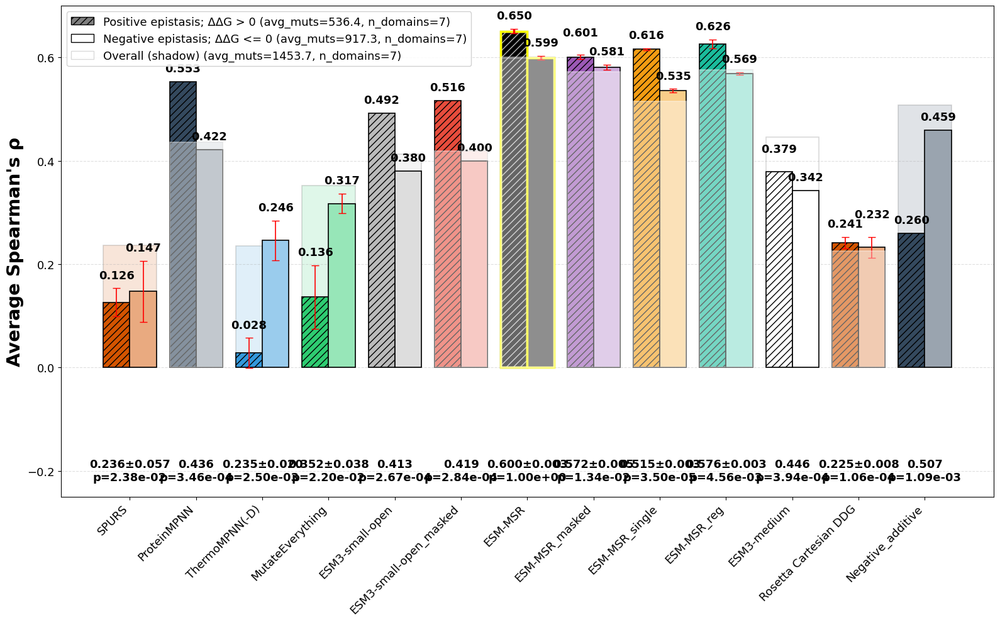

In [ ]:
import importlib
importlib.reload(analysis_utils_msr)
analysis_utils_msr.create_pos_neg_overall_chart(df_scores_dddG_combined_2.loc[('hyperopt_splits-D-test', 'grouped')], ['SPURS', 'ProteinMPNN', 'ThermoMPNN(-D)', 'MutateEverything', 'ESM3-small-open', 'ESM3-small-open_masked', 'ESM-MSR', 'ESM-MSR_masked', 'ESM-MSR_single', 'ESM-MSR_reg', 'ESM3-medium', 'Rosetta Cartesian DDG', 'Negative_additive'], #'ESM3-small',  'ESM3-large',
                                                 title=None, y_label='Average Spearman\'s ρ', highlighted_model='ESM-MSR', enforce_global_n=False, figsize=(16,10), ylim=(-0.25, 0.7), legend_loc='upper left',  p_value_y_coord=-0.2, fontsize_multiplier=1.3)


0.8524629363940698
0.17975426914900697
0.9219224231534958


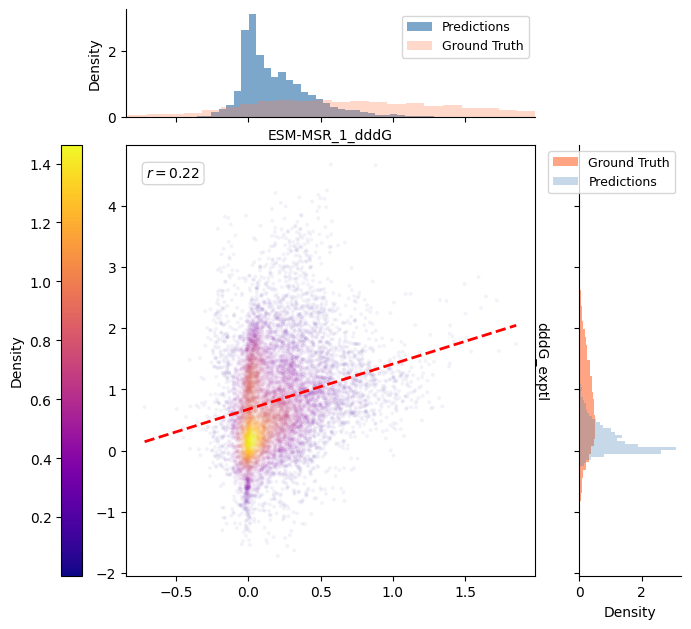

In [ ]:
import importlib
importlib.reload(analysis_utils_msr)
from sklearn.metrics import f1_score, matthews_corrcoef, average_precision_score

from analysis_utils_msr import density_scatter

df_dddG['dddG_exptl'] = df_dddG['ddG_dddG']
df_dddG_clean = df_dddG[['dddG_exptl', 'ESM-MSR_1_dddG']].dropna()

density_scatter(df_dddG_clean['ESM-MSR_1_dddG'], df_dddG_clean['dddG_exptl'], point_alpha=0.05, s=8, cmap="plasma", stats=True)

f1 = f1_score(df_dddG_clean[['dddG_exptl']]>0, df_dddG_clean[['ESM-MSR_1_dddG']]>0)
mcc = matthews_corrcoef(df_dddG_clean[['dddG_exptl']]>0, df_dddG_clean[['ESM-MSR_1_dddG']]>0)
auprc = average_precision_score(df_dddG_clean[['dddG_exptl']]>0, df_dddG_clean[['ESM-MSR_1_dddG']])

print(f1)
print(mcc)
print(auprc)

<Axes: xlabel='ESM-MSR_1', ylabel='ddG'>

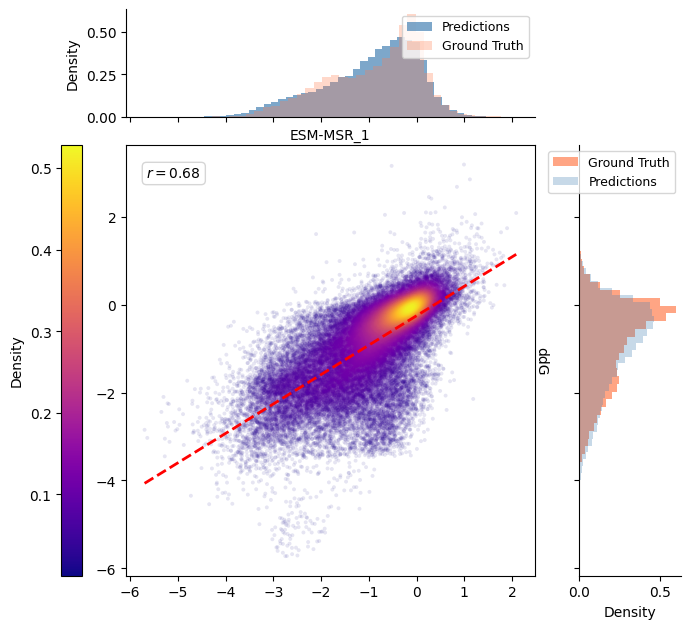

In [ ]:
density_scatter(df_dddG['ESM-MSR_1'], df_dddG['ddG'], point_alpha=0.1, s=8, cmap="plasma", stats=True)

<Axes: xlabel='ESM-MSR_1', ylabel='ddG'>

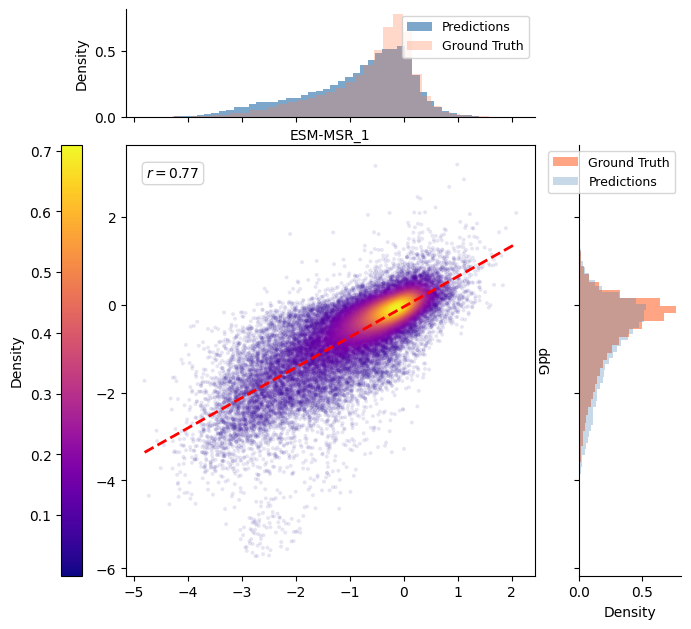

In [ ]:
density_scatter(df_dddG.loc[~df_dddG.index.str.contains(':'), 'ESM-MSR_1'], df_dddG.loc[~df_dddG.index.str.contains(':'), 'ddG'], point_alpha=0.1, s=8, cmap="plasma", stats=True)

<Axes: xlabel='ESM-MSR_1', ylabel='ddG'>

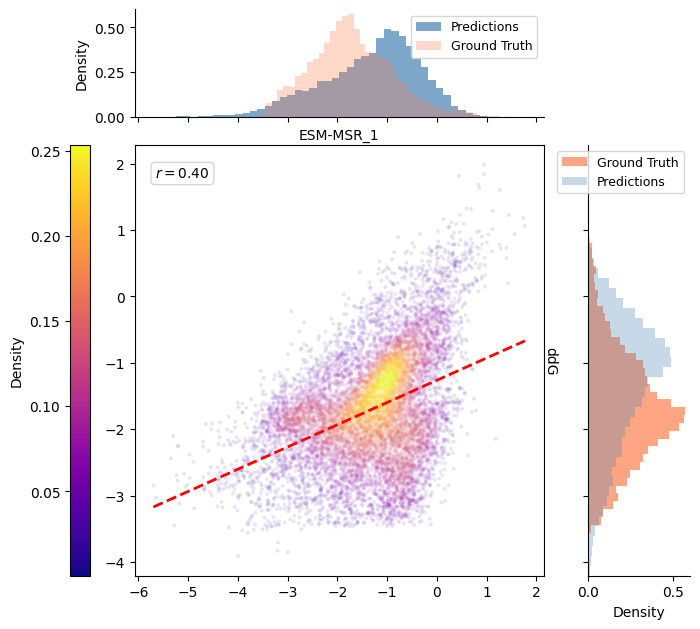

In [ ]:
density_scatter(df_dddG.loc[df_dddG.index.str.contains(':'), 'ESM-MSR_1'], df_dddG.loc[df_dddG.index.str.contains(':'), 'ddG'], point_alpha=0.1, s=8, cmap="plasma", stats=True)

In [ ]:
df_dddG.loc[df_dddG.index.str.contains(':'), 'code'].unique()

array(['1UFM', '2RU9', '3DKM', '6M3N', 'HHH_rd1_0244', 'HHH_rd1_0493',
       'HHH_rd1_0949'], dtype=object)

<Axes: xlabel='ESM-MSR_1', ylabel='ddG'>

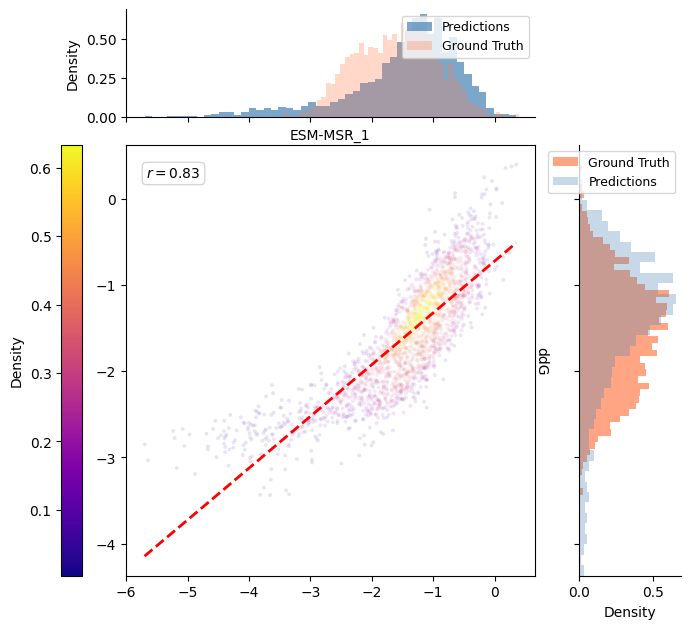

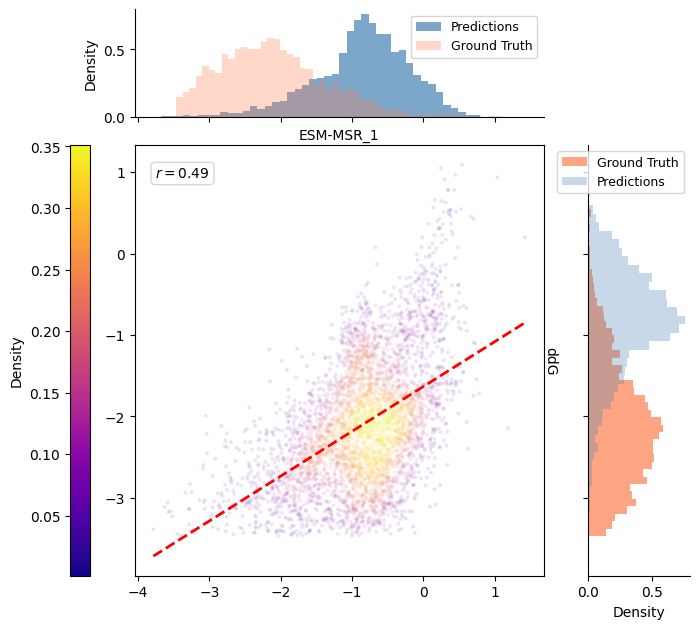

In [ ]:
density_scatter(df_dddG.loc[df_dddG.index.str.contains(':') & df_dddG.index.str.contains('1UFM'), 'ESM-MSR_1'], df_dddG.loc[df_dddG.index.str.contains(':') & df_dddG.index.str.contains('1UFM'), 'ddG'], point_alpha=0.1, s=8, cmap="plasma", stats=True)
density_scatter(df_dddG.loc[df_dddG.index.str.contains(':') & df_dddG.index.str.contains('3DKM'), 'ESM-MSR_1'], df_dddG.loc[df_dddG.index.str.contains(':') & df_dddG.index.str.contains('3DKM'), 'ddG'], point_alpha=0.1, s=8, cmap="plasma", stats=True)

<Axes: xlabel='ThermoMPNN(-D)_1', ylabel='ddG'>

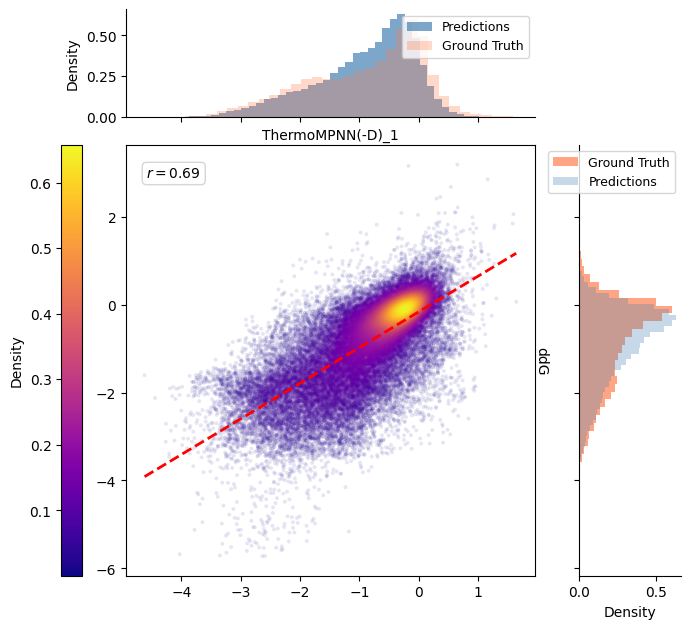

In [ ]:
density_scatter(df_dddG['ThermoMPNN(-D)_1'], df_dddG['ddG'], point_alpha=0.1, s=8, cmap="plasma", stats=True) #.dropna

<Axes: xlabel='ThermoMPNN(-D)_1', ylabel='ddG'>

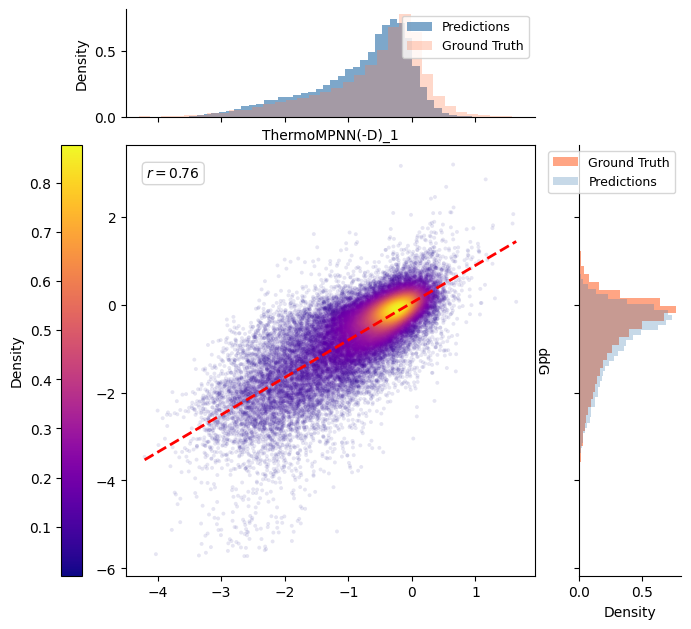

In [ ]:
density_scatter(df_dddG.loc[~df_dddG.index.str.contains(':'), 'ThermoMPNN(-D)_1'], df_dddG.loc[~df_dddG.index.str.contains(':'), 'ddG'], point_alpha=0.1, s=8, cmap="plasma", stats=True) #.dropna

<Axes: xlabel='ThermoMPNN(-D)_1', ylabel='ddG'>

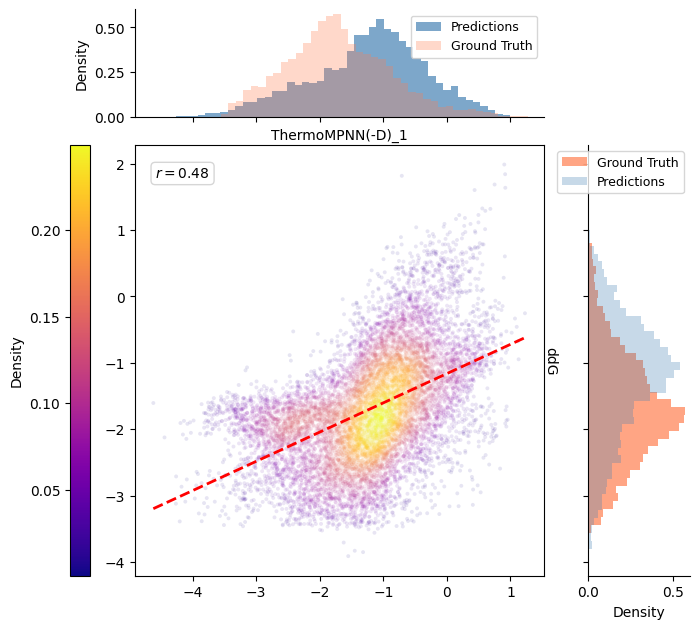

In [ ]:
density_scatter(df_dddG.loc[df_dddG.index.str.contains(':'), 'ThermoMPNN(-D)_1'], df_dddG.loc[df_dddG.index.str.contains(':'), 'ddG'], point_alpha=0.1, s=8, cmap="plasma", stats=True) #.dropna

<Axes: xlabel='MutateEverything_1', ylabel='ddG'>

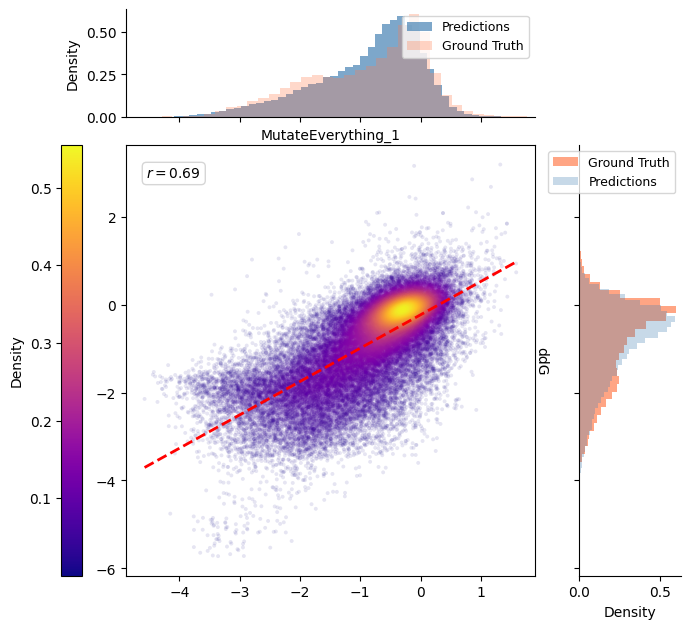

In [ ]:
density_scatter(df_dddG['MutateEverything_1'], df_dddG['ddG'], point_alpha=0.1, s=8, cmap="plasma", stats=True)

<Axes: xlabel='MutateEverything_1', ylabel='ddG'>

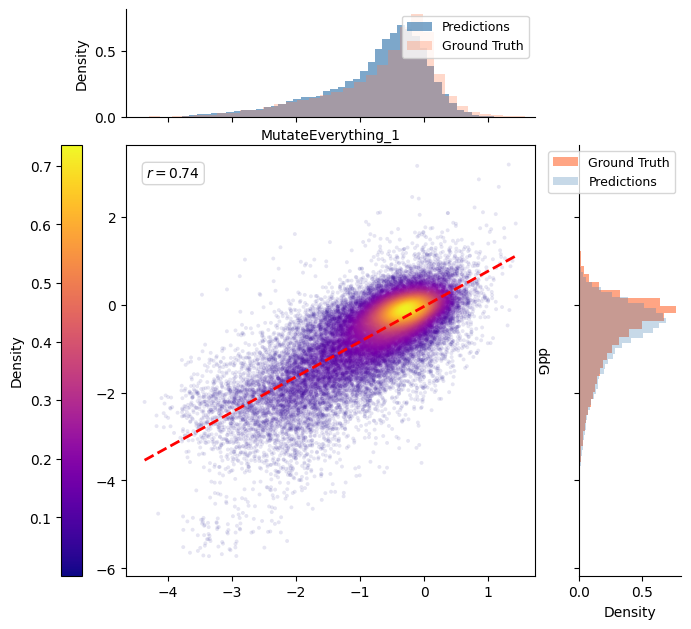

In [ ]:
density_scatter(df_dddG.loc[~df_dddG.index.str.contains(':'), 'MutateEverything_1'], df_dddG.loc[~df_dddG.index.str.contains(':'), 'ddG'], point_alpha=0.1, s=8, cmap="plasma", stats=True) #.dropna

<Axes: xlabel='MutateEverything_1', ylabel='ddG'>

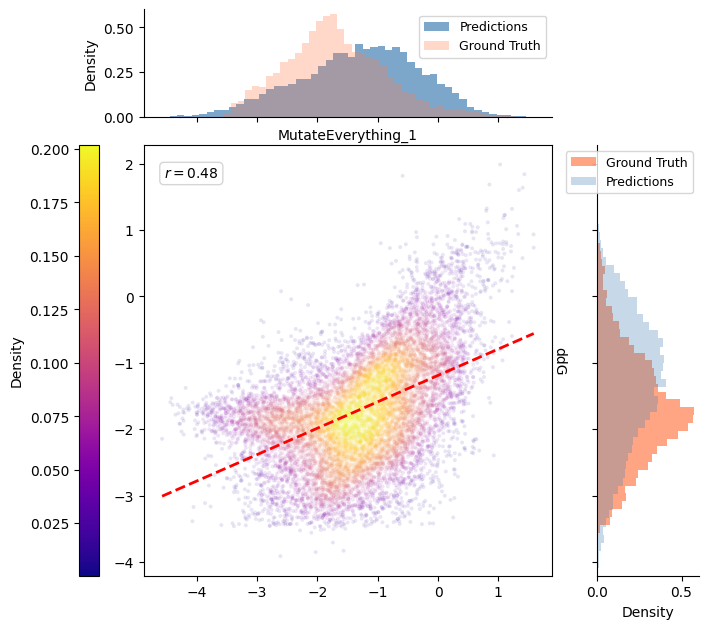

In [ ]:
density_scatter(df_dddG.loc[df_dddG.index.str.contains(':'), 'MutateEverything_1'], df_dddG.loc[df_dddG.index.str.contains(':'), 'ddG'], point_alpha=0.1, s=8, cmap="plasma", stats=True) #.dropna

<Axes: xlabel='SPURS_1', ylabel='ddG'>

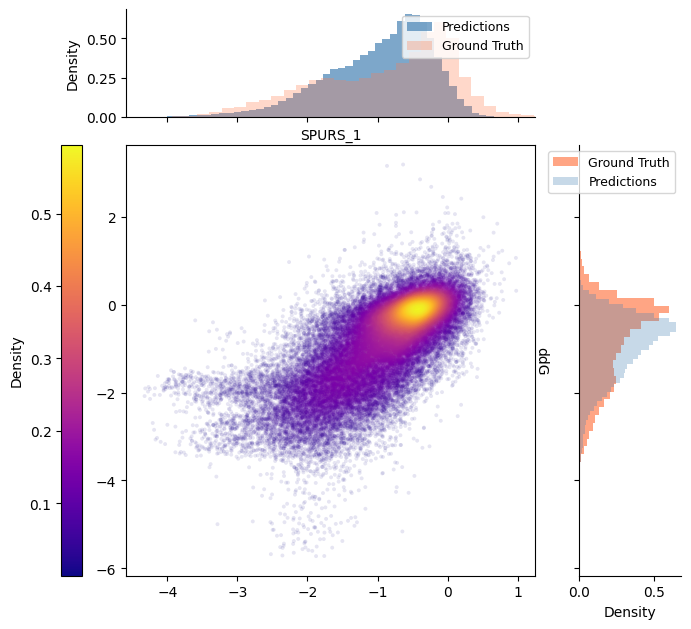

In [ ]:
density_scatter(df_dddG['SPURS_1'], df_dddG['ddG'], point_alpha=0.1, s=8, cmap="plasma")

<Axes: xlabel='ESM3-small-open', ylabel='ddG'>

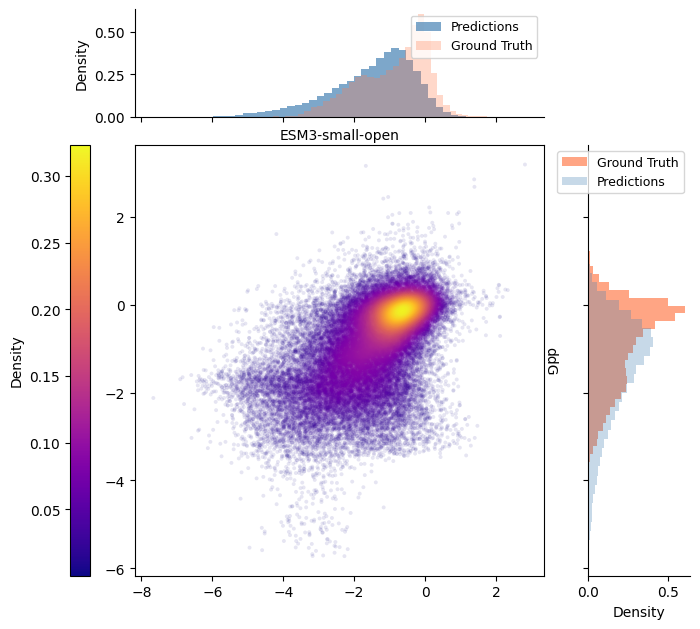

In [ ]:
density_scatter(df_dddG['ESM3-small-open'], df_dddG['ddG'], point_alpha=0.1, s=8, cmap="plasma")

,ddG_additive,ddG,ddG_dddG
uid,,,
1UFM_E14A:E53A,-1.742914,-1.746995,-0.004082
1UFM_E14A:E53D,-1.683631,-1.524802,0.158829
1UFM_E14A:E53F,-3.021748,-2.029420,0.992328
1UFM_E14A:E53G,-2.268398,-1.917165,0.351233
1UFM_E14A:E53H,-2.450991,-2.040422,0.410570
...,...,...,...
HHH_rd1_0949_R10Y:E36S,-1.240620,-0.293973,0.946647
HHH_rd1_0949_R10Y:E36T,-0.983655,-0.381462,0.602194
HHH_rd1_0949_R10Y:E36V,-0.178556,0.365883,0.544439


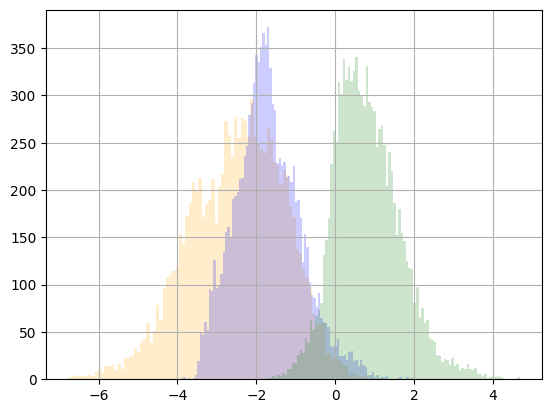

In [ ]:
df_dddG.loc[df.index.str.contains(':')]['ddG_additive'].hist(bins=100, alpha=0.2, color='orange')
df_dddG.loc[df.index.str.contains(':')]['ddG'].hist(bins=100, alpha=0.2, color='blue')

df_dddG['ddG_dddG'].hist(bins=100, alpha=0.2, color='green')
df_dddG[['ddG_additive', 'ddG', 'ddG_dddG']].dropna()

0.018727874842982755
-0.0015597437751152157
0.7573846264687856
              δΔΔG_exptl  ΔΔG_additive
δΔΔG_exptl      1.000000     -0.704691
ΔΔG_additive   -0.704691      1.000000


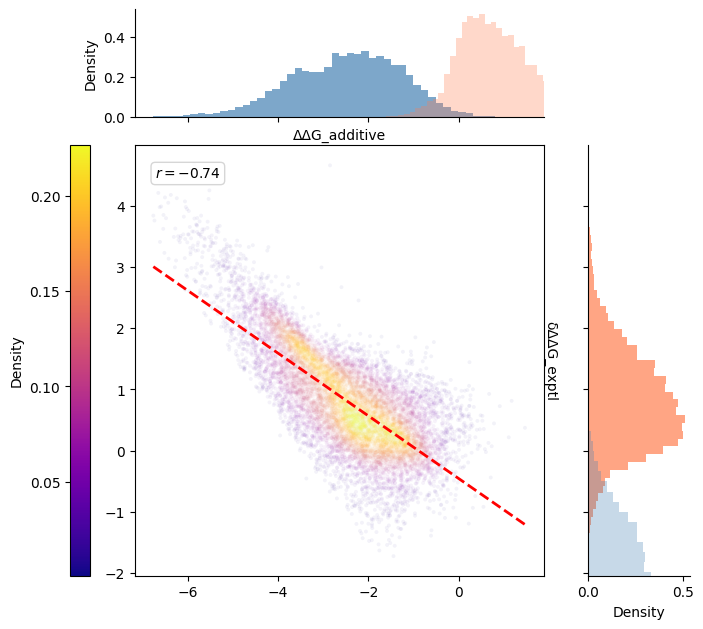

In [ ]:
from sklearn.metrics import f1_score, matthews_corrcoef, average_precision_score
import importlib
importlib.reload(analysis_utils_msr)

from analysis_utils_msr import density_scatter

df_dddG['δΔΔG_exptl'] = df_dddG['ddG_dddG']
df_dddG['ΔΔG_additive'] = df_dddG['ddG_additive']
df_dddG_clean = df_dddG[['ΔΔG_additive', 'δΔΔG_exptl']].dropna()

density_scatter(df_dddG_clean['ΔΔG_additive'], df_dddG_clean['δΔΔG_exptl'], point_alpha=0.05, s=8, cmap="plasma", hide_marginal_legend=True, stats=True)

f1 = f1_score(df_dddG_clean[['δΔΔG_exptl']]>0, df_dddG_clean[['ΔΔG_additive']]>0)
mcc = matthews_corrcoef(df_dddG_clean[['δΔΔG_exptl']]>0, df_dddG_clean[['ΔΔG_additive']]>0)
auprc = average_precision_score(df_dddG_clean[['δΔΔG_exptl']]>0, df_dddG_clean[['ΔΔG_additive']])

print(f1)
print(mcc)
print(auprc)
print(df_dddG[['δΔΔG_exptl', 'ΔΔG_additive']].corr('spearman'))

0.07423047005222802
0.06998138440473577
0.8877123717529737
            δΔΔG_exptl       ΔΔG
δΔΔG_exptl    1.000000 -0.075143
ΔΔG          -0.075143  1.000000


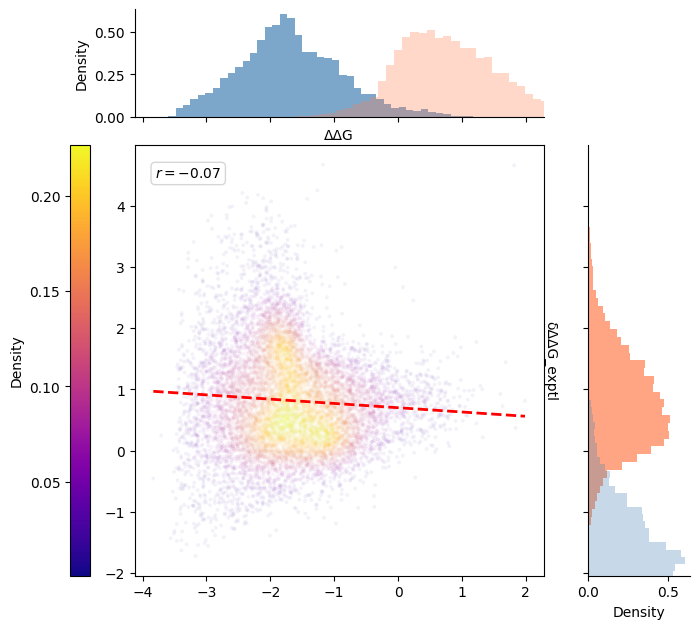

In [ ]:
from sklearn.metrics import f1_score, matthews_corrcoef, average_precision_score
import importlib
importlib.reload(analysis_utils_msr)

from analysis_utils_msr import density_scatter

df_dddG['δΔΔG_exptl'] = df_dddG['ddG_dddG']
df_dddG['ΔΔG'] = df_dddG['ddG']
df_dddG_clean = df_dddG[['ΔΔG', 'δΔΔG_exptl']].dropna()

density_scatter(df_dddG_clean['ΔΔG'], df_dddG_clean['δΔΔG_exptl'], point_alpha=0.05, s=8, cmap="plasma", hide_marginal_legend=True, stats=True)

f1 = f1_score(df_dddG_clean[['δΔΔG_exptl']]>0, df_dddG_clean[['ΔΔG']]>0)
mcc = matthews_corrcoef(df_dddG_clean[['δΔΔG_exptl']]>0, df_dddG_clean[['ΔΔG']]>0)
auprc = average_precision_score(df_dddG_clean[['δΔΔG_exptl']]>0, df_dddG_clean[['ΔΔG']])

print(f1)
print(mcc)
print(auprc)
print(df_dddG[['δΔΔG_exptl', 'ΔΔG']].corr('spearman'))

0.39908256880733944
0.47209830552668425
0.6562703660711597
              ΔΔG_exptl  ΔΔG_additive
ΔΔG_exptl      1.000000      0.730326
ΔΔG_additive   0.730326      1.000000


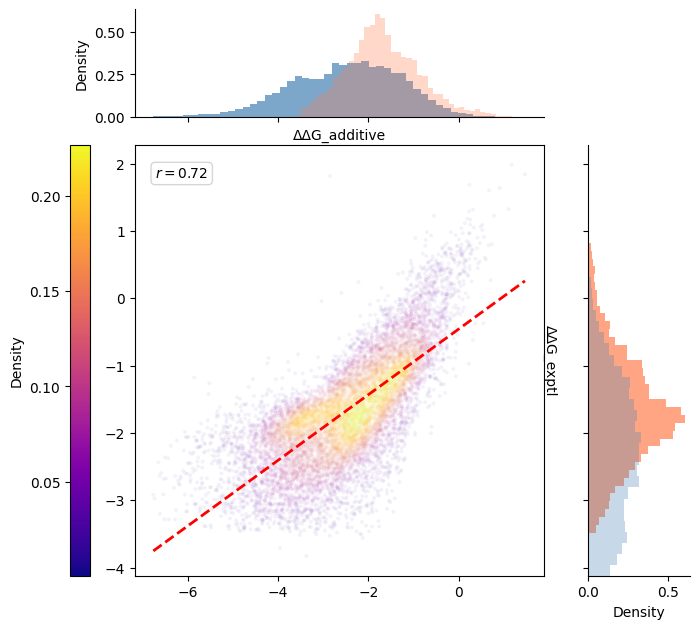

In [ ]:
from sklearn.metrics import f1_score, matthews_corrcoef, average_precision_score
import importlib
importlib.reload(analysis_utils_msr)

from analysis_utils_msr import density_scatter

df_dddG['ΔΔG_exptl'] = df_dddG['ddG']
df_dddG['ΔΔG_additive'] = df_dddG['ddG_additive']
df_dddG_clean = df_dddG[['ΔΔG_additive', 'ΔΔG_exptl']].dropna()

density_scatter(df_dddG_clean['ΔΔG_additive'], df_dddG_clean['ΔΔG_exptl'], point_alpha=0.05, s=8, cmap="plasma", hide_marginal_legend=True, stats=True)

f1 = f1_score(df_dddG_clean[['ΔΔG_exptl']]>0, df_dddG_clean[['ΔΔG_additive']]>0)
mcc = matthews_corrcoef(df_dddG_clean[['ΔΔG_exptl']]>0, df_dddG_clean[['ΔΔG_additive']]>0)
auprc = average_precision_score(df_dddG_clean[['ΔΔG_exptl']]>0, df_dddG_clean[['ΔΔG_additive']])

print(f1)
print(mcc)
print(auprc)
print(df_dddG[['ΔΔG_exptl', 'ΔΔG_additive']].corr('spearman'))

0.016901408450704224
-0.01972986016261943
0.7551567588536185
              ESM-MSR δΔΔG  ΔΔG_additive
ESM-MSR δΔΔG      1.000000     -0.036235
ΔΔG_additive     -0.036235      1.000000


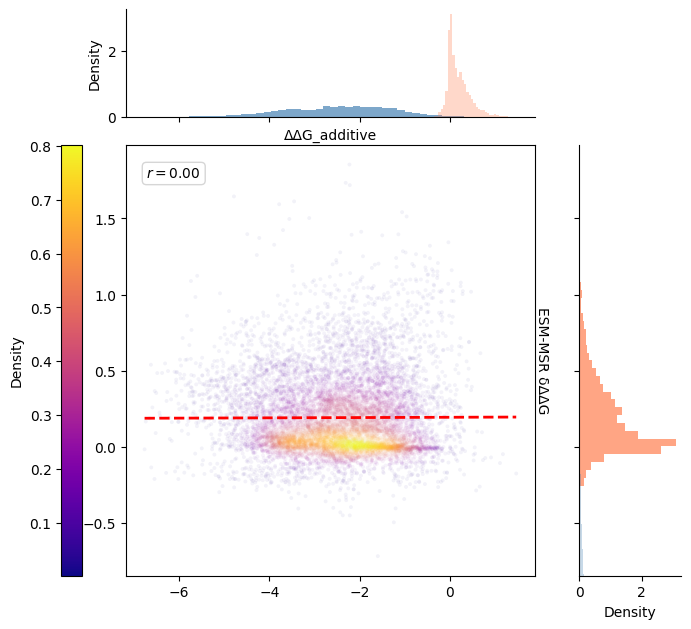

In [ ]:
df_dddG_clean = df_dddG[['ΔΔG_additive', 'ESM-MSR_1_dddG']].dropna()

df_dddG_clean.rename(columns={'ESM-MSR_1_dddG': 'ESM-MSR δΔΔG'}, inplace=True)

density_scatter(df_dddG_clean['ΔΔG_additive'], df_dddG_clean['ESM-MSR δΔΔG'], point_alpha=0.05, s=8, cmap="plasma", hide_marginal_legend=True, stats=True)

f1 = f1_score(df_dddG_clean[['ESM-MSR δΔΔG']]>0, df_dddG_clean[['ΔΔG_additive']]>0)
mcc = matthews_corrcoef(df_dddG_clean[['ESM-MSR δΔΔG']]>0, df_dddG_clean[['ΔΔG_additive']]>0)
auprc = average_precision_score(df_dddG_clean[['ESM-MSR δΔΔG']]>0, df_dddG_clean[['ΔΔG_additive']])

print(f1)
print(mcc)
print(auprc)
print(df_dddG_clean[['ESM-MSR δΔΔG', 'ΔΔG_additive']].corr('spearman'))

0.002132954141485958
-0.051710498673037286
0.6373361095637224
                ESM-MSR_1_dddG  ddG_additive
ESM-MSR_1_dddG        1.000000     -0.280527
ddG_additive         -0.280527      1.000000


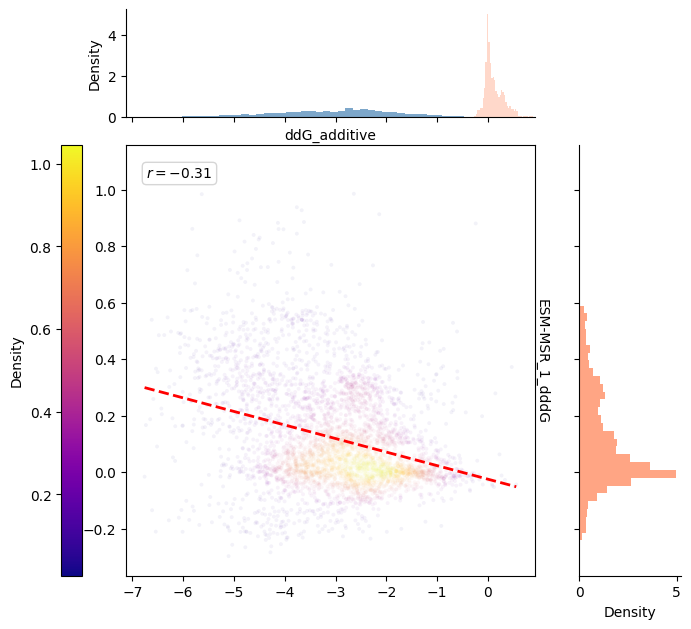

In [ ]:
df_dddG_clean = df_dddG.reset_index()[['uid', 'ddG_additive', 'ESM-MSR_1_dddG']].dropna()
df_dddG_clean = df_dddG_clean.loc[df_dddG_clean['uid'].str.contains('3DKM')]

density_scatter(df_dddG_clean['ddG_additive'], df_dddG_clean['ESM-MSR_1_dddG'], point_alpha=0.05, s=8, cmap="plasma", hide_marginal_legend=True, stats=True)

f1 = f1_score(df_dddG_clean[['ESM-MSR_1_dddG']]>0, df_dddG_clean[['ddG_additive']]>0)
mcc = matthews_corrcoef(df_dddG_clean[['ESM-MSR_1_dddG']]>0, df_dddG_clean[['ddG_additive']]>0)
auprc = average_precision_score(df_dddG_clean[['ESM-MSR_1_dddG']]>0, df_dddG_clean[['ddG_additive']])

print(f1)
print(mcc)
print(auprc)
print(df_dddG_clean[['ESM-MSR_1_dddG', 'ddG_additive']].corr('spearman'))

0.017187940264863342
-0.012519190022803686
0.697427688353049
                      ESM3-small-open_dddG  ΔΔG_additive
ESM3-small-open_dddG              1.000000     -0.023902
ΔΔG_additive                     -0.023902      1.000000


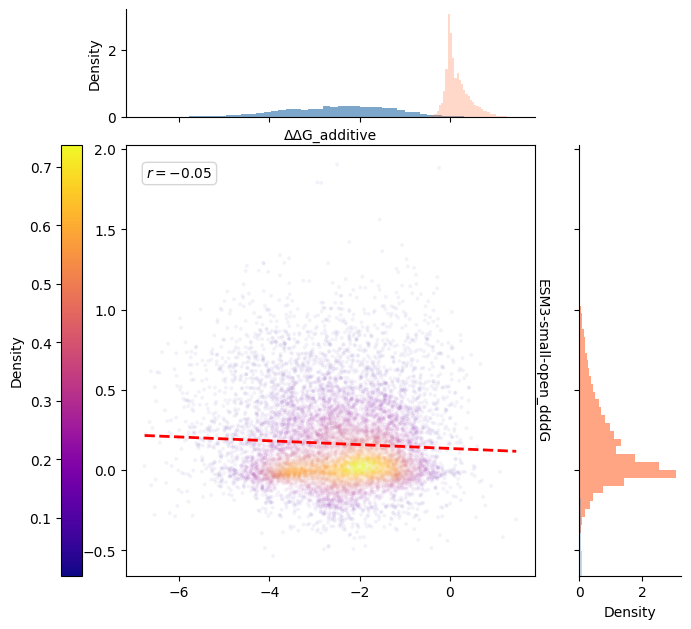

In [ ]:
df_dddG_clean = df_dddG[['ΔΔG_additive', 'ESM3-small-open_dddG']].dropna()

density_scatter(df_dddG_clean['ΔΔG_additive'], df_dddG_clean['ESM3-small-open_dddG'], point_alpha=0.05, s=8, cmap="plasma", hide_marginal_legend=True, stats=True)

f1 = f1_score(df_dddG_clean[['ESM3-small-open_dddG']]>0, df_dddG_clean[['ΔΔG_additive']]>0)
mcc = matthews_corrcoef(df_dddG_clean[['ESM3-small-open_dddG']]>0, df_dddG_clean[['ΔΔG_additive']]>0)
auprc = average_precision_score(df_dddG_clean[['ESM3-small-open_dddG']]>0, df_dddG_clean[['ΔΔG_additive']])

print(f1)
print(mcc)
print(auprc)
print(df_dddG_clean[['ESM3-small-open_dddG', 'ΔΔG_additive']].corr('spearman'))

0.015663643858202802
-0.025411695643816436
0.644824269803287
                              Rosetta Cartesian DDG_1_dddG  ΔΔG_additive
Rosetta Cartesian DDG_1_dddG                      1.000000     -0.271463
ΔΔG_additive                                     -0.271463      1.000000


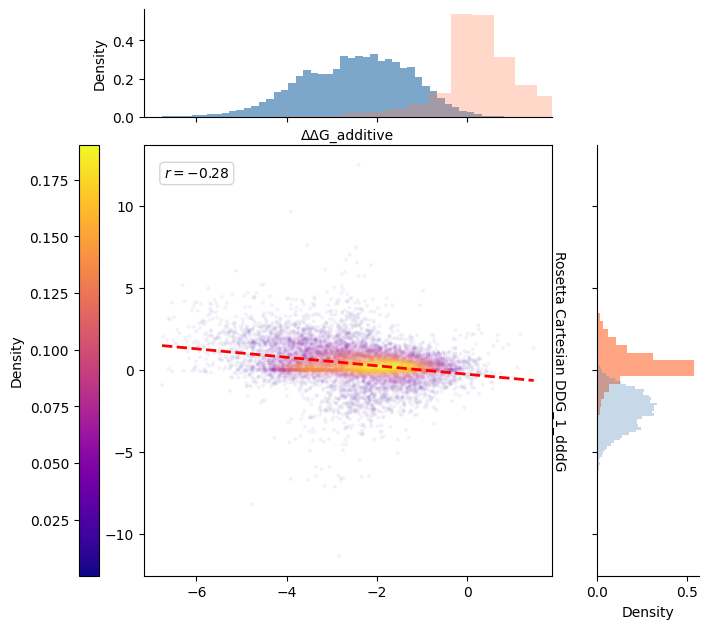

In [ ]:
df_dddG_clean = df_dddG[['ΔΔG_additive', 'Rosetta Cartesian DDG_1_dddG']].dropna()

density_scatter(df_dddG_clean['ΔΔG_additive'], df_dddG_clean['Rosetta Cartesian DDG_1_dddG'], point_alpha=0.05, s=8, cmap="plasma", hide_marginal_legend=True, stats=True)

f1 = f1_score(df_dddG_clean[['Rosetta Cartesian DDG_1_dddG']]>0, df_dddG_clean[['ΔΔG_additive']]>0)
mcc = matthews_corrcoef(df_dddG_clean[['Rosetta Cartesian DDG_1_dddG']]>0, df_dddG_clean[['ΔΔG_additive']]>0)
auprc = average_precision_score(df_dddG_clean[['Rosetta Cartesian DDG_1_dddG']]>0, df_dddG_clean[['ΔΔG_additive']])

print(f1)
print(mcc)
print(auprc)
print(df_dddG_clean[['Rosetta Cartesian DDG_1_dddG', 'ΔΔG_additive']].corr('spearman'))

0.018845467169212458
-0.0013365264589851335
0.971759885036612
                        Mutate Everything δΔΔG  ΔΔG_additive
Mutate Everything δΔΔG                1.000000     -0.592346
ΔΔG_additive                         -0.592346      1.000000


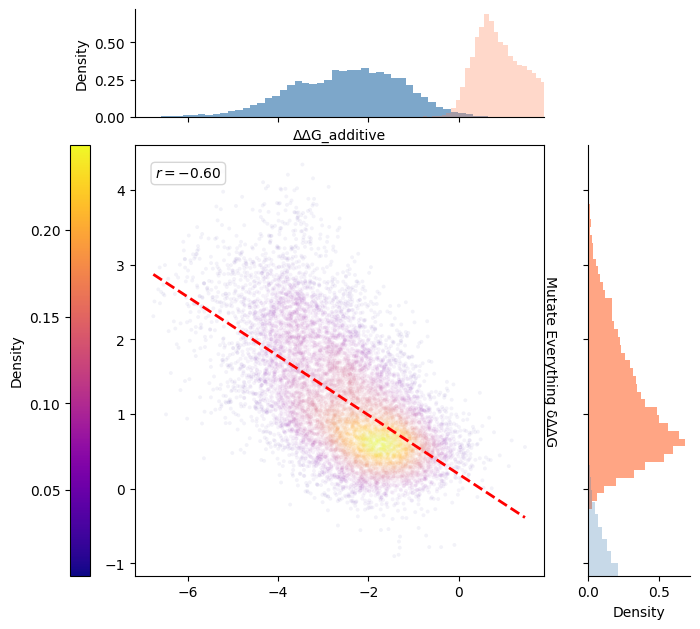

In [ ]:
df_dddG_clean = df_dddG[['ΔΔG_additive', 'MutateEverything_1_dddG']].dropna()

df_dddG_clean.rename(columns={'MutateEverything_1_dddG': 'Mutate Everything δΔΔG'}, inplace=True)

density_scatter(df_dddG_clean['ΔΔG_additive'], df_dddG_clean['Mutate Everything δΔΔG'], point_alpha=0.05, s=8, cmap="plasma", hide_marginal_legend=True, stats=True)

f1 = f1_score(df_dddG_clean[['Mutate Everything δΔΔG']]>0, df_dddG_clean[['ΔΔG_additive']]>0)
mcc = matthews_corrcoef(df_dddG_clean[['Mutate Everything δΔΔG']]>0, df_dddG_clean[['ΔΔG_additive']]>0)
auprc = average_precision_score(df_dddG_clean[['Mutate Everything δΔΔG']]>0, df_dddG_clean[['ΔΔG_additive']])

print(f1)
print(mcc)
print(auprc)
print(df_dddG_clean[['Mutate Everything δΔΔG', 'ΔΔG_additive']].corr('spearman'))

0.016485998193315265
-0.030652281271019856
0.8548212419353336
                       ThermoMPNN(-D)_1_dddG  ΔΔG_additive
ThermoMPNN(-D)_1_dddG               1.000000     -0.098784
ΔΔG_additive                       -0.098784      1.000000


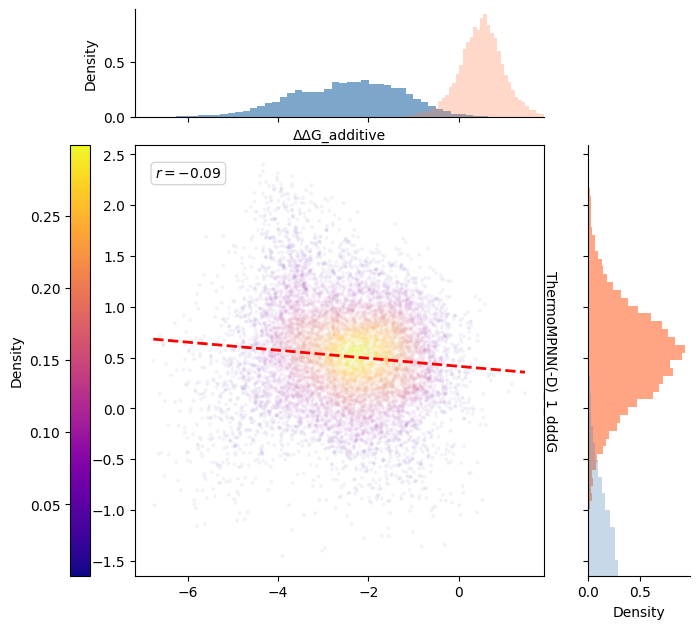

In [ ]:
df_dddG_clean = df_dddG[['ΔΔG_additive', 'ThermoMPNN(-D)_1_dddG']].dropna()

density_scatter(df_dddG_clean['ΔΔG_additive'], df_dddG_clean['ThermoMPNN(-D)_1_dddG'], point_alpha=0.05, s=8, cmap="plasma", hide_marginal_legend=True, stats=True)

f1 = f1_score(df_dddG_clean[['ThermoMPNN(-D)_1_dddG']]>0, df_dddG_clean[['ΔΔG_additive']]>0)
mcc = matthews_corrcoef(df_dddG_clean[['ThermoMPNN(-D)_1_dddG']]>0, df_dddG_clean[['ΔΔG_additive']]>0)
auprc = average_precision_score(df_dddG_clean[['ThermoMPNN(-D)_1_dddG']]>0, df_dddG_clean[['ΔΔG_additive']])

print(f1)
print(mcc)
print(auprc)
print(df_dddG_clean[['ThermoMPNN(-D)_1_dddG', 'ΔΔG_additive']].corr('spearman'))

0.007551055431611464
-0.06651205144023743
0.5022995044166685
              SPURS_1_dddG  ΔΔG_additive
SPURS_1_dddG      1.000000     -0.173829
ΔΔG_additive     -0.173829      1.000000


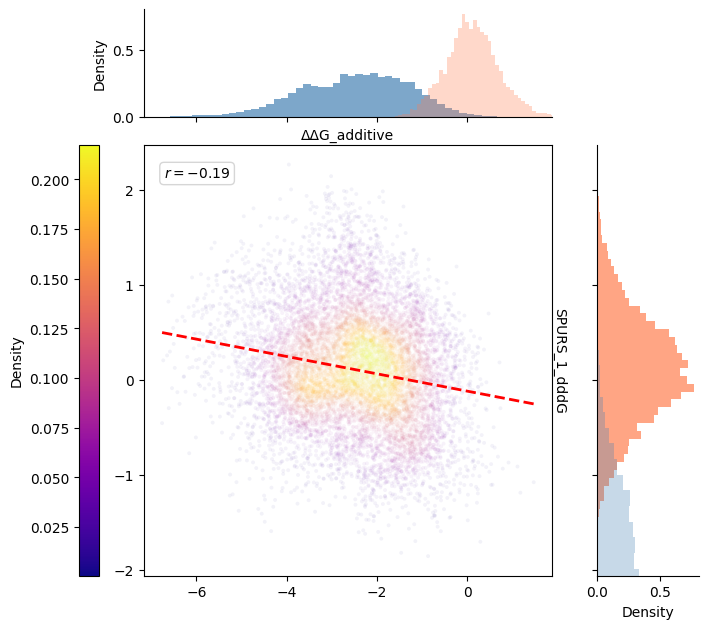

In [ ]:
df_dddG_clean = df_dddG[['ΔΔG_additive', 'SPURS_1_dddG']].dropna()

density_scatter(df_dddG_clean['ΔΔG_additive'], df_dddG_clean['SPURS_1_dddG'], point_alpha=0.05, s=8, cmap="plasma", hide_marginal_legend=True, stats=True)

f1 = f1_score(df_dddG_clean[['SPURS_1_dddG']]>0, df_dddG_clean[['ΔΔG_additive']]>0)
mcc = matthews_corrcoef(df_dddG_clean[['SPURS_1_dddG']]>0, df_dddG_clean[['ΔΔG_additive']]>0)
auprc = average_precision_score(df_dddG_clean[['SPURS_1_dddG']]>0, df_dddG_clean[['ΔΔG_additive']])

print(f1)
print(mcc)
print(auprc)
print(df_dddG_clean[['SPURS_1_dddG', 'ΔΔG_additive']].corr('spearman'))

0.8524629363940698
0.17975426914900697
0.9219224231534958


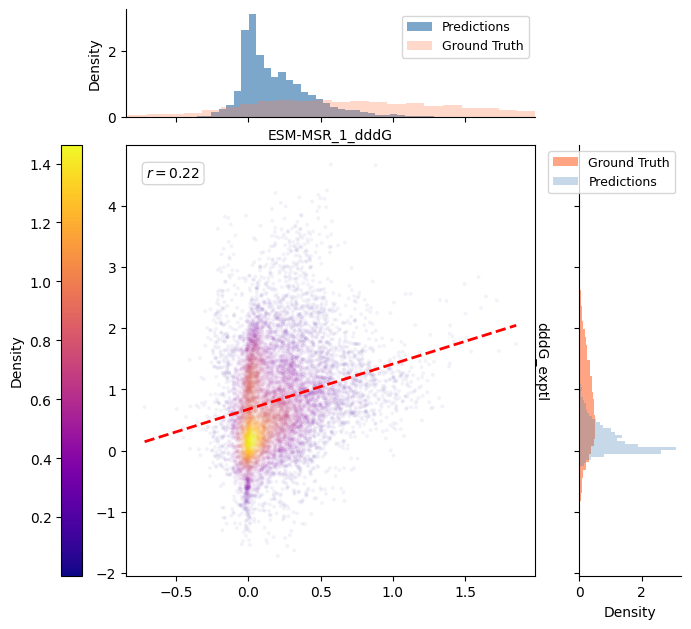

In [ ]:
df_dddG['dddG_exptl'] = df_dddG['ddG_dddG']
df_dddG_clean = df_dddG[['dddG_exptl', 'ESM-MSR_1_dddG']].dropna()

density_scatter(df_dddG_clean['ESM-MSR_1_dddG'], df_dddG_clean['dddG_exptl'], point_alpha=0.05, s=8, cmap="plasma", stats=True)

f1 = f1_score(df_dddG_clean[['dddG_exptl']]>0, df_dddG_clean[['ESM-MSR_1_dddG']]>0)
mcc = matthews_corrcoef(df_dddG_clean[['dddG_exptl']]>0, df_dddG_clean[['ESM-MSR_1_dddG']]>0)
auprc = average_precision_score(df_dddG_clean[['dddG_exptl']]>0, df_dddG_clean[['ESM-MSR_1_dddG']])

print(f1)
print(mcc)
print(auprc)

0.9143470099222312
0.05398385659727765
0.9150860326826076


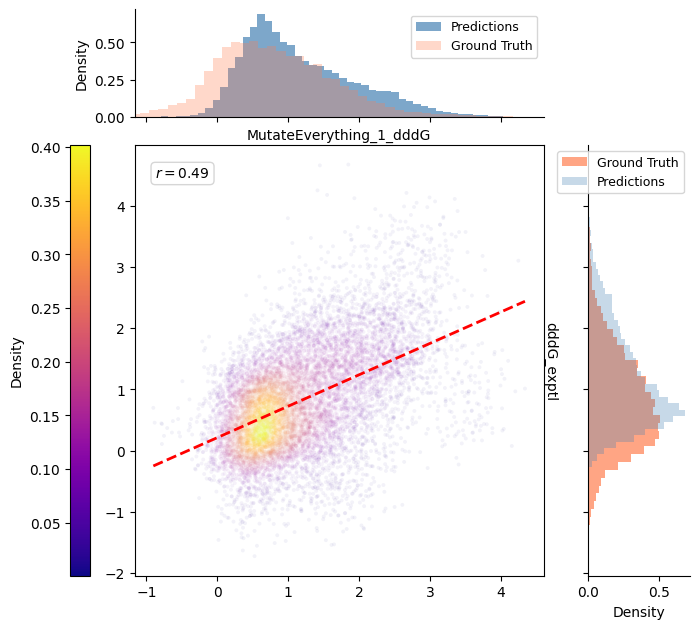

In [ ]:
df_dddG['dddG_exptl'] = df_dddG['ddG_dddG']
df_dddG_clean = df_dddG[['dddG_exptl', 'MutateEverything_1_dddG']].dropna()

density_scatter(df_dddG_clean['MutateEverything_1_dddG'], df_dddG_clean['dddG_exptl'], point_alpha=0.05, s=8, cmap="plasma", stats=True)

f1 = f1_score(df_dddG_clean[['dddG_exptl']]>0, df_dddG_clean[['MutateEverything_1_dddG']]>0)
mcc = matthews_corrcoef(df_dddG_clean[['dddG_exptl']]>0, df_dddG_clean[['MutateEverything_1_dddG']]>0)
auprc = average_precision_score(df_dddG_clean[['dddG_exptl']]>0, df_dddG_clean[['MutateEverything_1_dddG']])

print(f1)
print(mcc)
print(auprc)

0.8479246799471841
-0.05508657550430608
0.8722757114607005


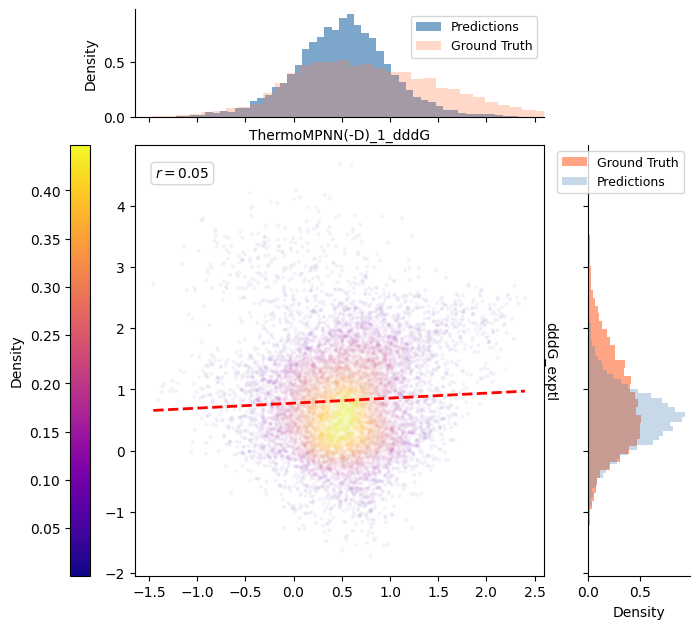

In [ ]:
df_dddG['dddG_exptl'] = df_dddG['ddG_dddG']
df_dddG_clean = df_dddG[['dddG_exptl', 'ThermoMPNN(-D)_1_dddG']].dropna()

density_scatter(df_dddG_clean['ThermoMPNN(-D)_1_dddG'], df_dddG_clean['dddG_exptl'], point_alpha=0.05, s=8, cmap="plasma", stats=True)

f1 = f1_score(df_dddG_clean[['dddG_exptl']]>0, df_dddG_clean[['ThermoMPNN(-D)_1_dddG']]>0)
mcc = matthews_corrcoef(df_dddG_clean[['dddG_exptl']]>0, df_dddG_clean[['ThermoMPNN(-D)_1_dddG']]>0)
auprc = average_precision_score(df_dddG_clean[['dddG_exptl']]>0, df_dddG_clean[['ThermoMPNN(-D)_1_dddG']])

print(f1)
print(mcc)
print(auprc)

0.686726893676164
0.035969454023520864
0.8368814386453162


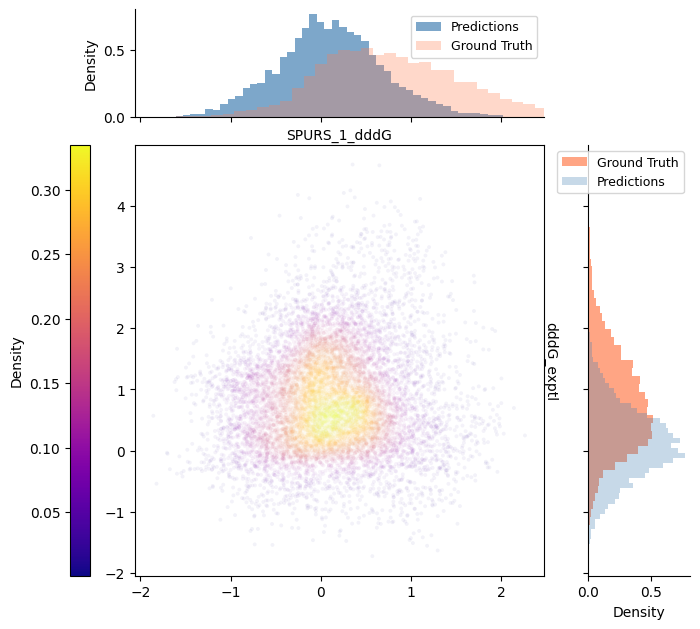

In [ ]:
df_dddG['dddG_exptl'] = df_dddG['ddG_dddG']
df_dddG_clean = df_dddG[['dddG_exptl', 'SPURS_1_dddG']].dropna()

density_scatter(df_dddG_clean['SPURS_1_dddG'], df_dddG_clean['dddG_exptl'], point_alpha=0.05, s=8, cmap="plasma")

f1 = f1_score(df_dddG_clean[['dddG_exptl']]>0, df_dddG_clean[['SPURS_1_dddG']]>0)
mcc = matthews_corrcoef(df_dddG_clean[['dddG_exptl']]>0, df_dddG_clean[['SPURS_1_dddG']]>0)
auprc = average_precision_score(df_dddG_clean[['dddG_exptl']]>0, df_dddG_clean[['SPURS_1_dddG']])

print(f1)
print(mcc)
print(auprc)

In [ ]:
df_dddG_clean = df_dddG[['ddG_dddG', 'ESM-MSR_1_dddG']].dropna()

tp = len(df_dddG_clean.loc[(df_dddG_clean['ddG_dddG']>0) & (df_dddG_clean['ESM-MSR_1_dddG']>0)])
fp = len(df_dddG_clean.loc[(df_dddG_clean['ddG_dddG']<=0) & (df_dddG_clean['ESM-MSR_1_dddG']>0)])
tn = len(df_dddG_clean.loc[(df_dddG_clean['ddG_dddG']<=0) & (df_dddG_clean['ESM-MSR_1_dddG']<=0)])
fn = len(df_dddG_clean.loc[(df_dddG_clean['ddG_dddG']>0) & (df_dddG_clean['ESM-MSR_1_dddG']<=0)])
print(tp, fp, tn, fn)
print(sum([tp, fp, tn, fn]))

7130 938 578 1530
10176


In [ ]:
df_dddG_clean = df_dddG[['ddG_dddG', 'ThermoMPNN(-D)_1_dddG']].dropna()

tp = len(df_dddG_clean.loc[(df_dddG_clean['ddG_dddG']>0) & (df_dddG_clean['ThermoMPNN(-D)_1_dddG']>0)])
fp = len(df_dddG_clean.loc[(df_dddG_clean['ddG_dddG']<=0) & (df_dddG_clean['ThermoMPNN(-D)_1_dddG']>0)])
tn = len(df_dddG_clean.loc[(df_dddG_clean['ddG_dddG']<=0) & (df_dddG_clean['ThermoMPNN(-D)_1_dddG']<=0)])
fn = len(df_dddG_clean.loc[(df_dddG_clean['ddG_dddG']>0) & (df_dddG_clean['ThermoMPNN(-D)_1_dddG']<=0)])
print(tp, fp, tn, fn)
print(sum([tp, fp, tn, fn]))

7385 1374 142 1275
10176


In [ ]:
df_dddG_clean = df_dddG[['ddG_dddG', 'MutateEverything_1_dddG']].dropna()

tp = len(df_dddG_clean.loc[(df_dddG_clean['ddG_dddG']>0) & (df_dddG_clean['MutateEverything_1_dddG']>0)])
fp = len(df_dddG_clean.loc[(df_dddG_clean['ddG_dddG']<=0) & (df_dddG_clean['MutateEverything_1_dddG']>0)])
tn = len(df_dddG_clean.loc[(df_dddG_clean['ddG_dddG']<=0) & (df_dddG_clean['MutateEverything_1_dddG']<=0)])
fn = len(df_dddG_clean.loc[(df_dddG_clean['ddG_dddG']>0) & (df_dddG_clean['MutateEverything_1_dddG']<=0)])
print(tp, fp, tn, fn)
print(sum([tp, fp, tn, fn]))

8524 1461 55 136
10176


In [ ]:
df_dddG_clean = df_dddG[['ddG_dddG', 'SPURS_1_dddG']].dropna()

tp = len(df_dddG_clean.loc[(df_dddG_clean['ddG_dddG']>0) & (df_dddG_clean['SPURS_1_dddG']>0)])
fp = len(df_dddG_clean.loc[(df_dddG_clean['ddG_dddG']<=0) & (df_dddG_clean['SPURS_1_dddG']>0)])
tn = len(df_dddG_clean.loc[(df_dddG_clean['ddG_dddG']<=0) & (df_dddG_clean['SPURS_1_dddG']<=0)])
fn = len(df_dddG_clean.loc[(df_dddG_clean['ddG_dddG']>0) & (df_dddG_clean['SPURS_1_dddG']<=0)])
print(tp, fp, tn, fn)
print(sum([tp, fp, tn, fn]))

4941 789 727 3719
10176


In [ ]:
df_scores_dddG_combined[[c for c in df_scores_dddG_combined.columns if 'Negative' in c]]

Negative_additive  Negative_additive_n  \
hyperopt_splits-D-test ungrouped           0.704691         10176.000000   
                       grouped             0.507187          1453.714286   

                                  Negative_additive_groups  \
hyperopt_splits-D-test ungrouped                       NaN   
                       grouped                         7.0   

                                  Negative_additive_pos  \
hyperopt_splits-D-test ungrouped               0.702709   
                       grouped                 0.494798   

                                  Negative_additive_n_pos  \
hyperopt_splits-D-test ungrouped              8660.000000   
                       grouped                1237.142857   

                                  Negative_additive_groups_pos  \
hyperopt_splits-D-test ungrouped                           NaN   
                       grouped                             7.0   

                                  Negative_additive_neg  \
hyperopt_splits-D-test ungrouped               0.065148   
                       grouped                 0.140695   

                                  Negative_additive_n_neg  \
hyperopt_splits-D-test ungrouped              1516.000000   
                       grouped                 216.571429   

                                  Negative_additive_groups_neg  
hyperopt_splits-D-test ungrouped                           NaN  
                       grouped                             7.0

In [ ]:
#df_scores_dddG = pd.read_csv('~/PSLMs/data/lora/test_scores_new.csv', index_col=[0,1])
df_dddG = df_epistatic.copy(deep=True)
df_dddG = compute_dddg(df_dddG)

df_dddG = df_dddG.loc[df_dddG.index.str.contains(':')].reset_index()
#df_dddG['code'] = df_dddG['uid'].apply(lambda x: x.split('_')[0])
df_dddG['pos1'] = df_dddG['mut_type'].apply(lambda x: x.split(':')[0][1:-1]).astype(int)
df_dddG['pos2'] = df_dddG['mut_type'].apply(lambda x: x.split(':')[1][1:-1]).astype(int)
#tmp = df_dddG.groupby(['code', 'pos1', 'pos2'])[[c for c in df_dddG.columns if 'dddG' in c]].corr('spearman')[['ddG_dddG']].reset_index().set_index(['code', 'pos1', 'pos2'])
#tmp.columns = ['model', 'spearman']
#tmp.pivot(columns='model').mean()
tmp = df_dddG.groupby(['code', 'pos1', 'pos2'])[[c for c in df_dddG.columns if 'dddG' in c]].count()[['ddG_dddG']]
tmp2 = df_dddG.groupby(['code', 'pos1', 'pos2'])[[c for c in df_dddG.columns if 'dddG' in c]].corr('spearman').loc[slice(None), slice(None), slice(None), 'ddG_dddG', :]

tmp.rename({'ddG_dddG': 'dddG_ct'}, axis=1).join(tmp2).sort_values('dddG_ct', ascending=False).to_csv('doubles_count.csv')

In [ ]:
df_dddG = df_epistatic.copy(deep=True)
df_dddG = compute_dddg(df_dddG)

df_dddG = df_dddG.loc[df_dddG.index.str.contains(':')].reset_index()
df_dddG['code'] = df_dddG['uid'].apply(lambda x: x.split('_')[0])
df_dddG['pos1'] = df_dddG['mut_type'].apply(lambda x: x.split(':')[0][1:-1]).astype(int)
df_dddG['pos2'] = df_dddG['mut_type'].apply(lambda x: x.split(':')[1][1:-1]).astype(int)
df_dddG['mut1'] = df_dddG['mut_type'].apply(lambda x: x.split(':')[0][-1]).astype(str)
df_dddG['mut2'] = df_dddG['mut_type'].apply(lambda x: x.split(':')[1][-1]).astype(str)
tmp = df_dddG.drop(['uid', 'mut_type'], axis=1)
pt = tmp.pivot_table(index=['code', 'pos1', 'pos2', 'mut1'], columns=['mut2'])
pt

ESM-MSR_1                                          \
mut2                        A         C         D         E         F   
code pos1 pos2 mut1                                                     
1UFM 14   49   A    -1.114347       NaN -1.294540 -0.811828 -1.196557   
               D    -1.542809       NaN -1.737846 -1.341140 -1.724250   
               F    -0.904436       NaN -1.093126 -0.578241 -0.666567   
               G    -2.031697       NaN -2.211481 -1.758093 -2.096697   
               H    -1.238430       NaN -1.383013 -0.847595 -1.343363   
...                       ...       ...       ...       ...       ...   
HHH  36   39   S    -1.937498       NaN -3.848206 -2.637868 -2.163040   
               T    -2.027340       NaN -3.972990 -2.762277 -2.252117   
               V    -1.924339 -1.867715 -3.917674 -2.703239 -2.080019   
               W    -1.443978 -1.352501 -3.373727 -2.288049 -1.352063   
               Y    -1.582097 -1.522289       NaN -2.417407 -1.575207   

                                                                       ...  \
mut2                        G         H         I         K         L  ...   
code pos1 pos2 mut1                                                    ...   
1UFM 14   49   A    -1.960371 -1.374147 -1.124939 -1.163056 -1.105243  ...   
               D    -2.363911 -1.782124 -1.550019 -1.524974 -1.533886  ...   
               F    -1.761964 -0.975416 -0.614628 -0.911470 -0.646508  ...   
               G    -2.853233 -2.266081 -2.032692 -2.043689 -2.020407  ...   
               H    -2.080213 -1.504137 -1.205050 -1.305719 -1.199978  ...   
...                       ...       ...       ...       ...       ...  ...   
HHH  36   39   S    -3.437373 -2.395945 -1.888238 -1.197873 -1.569708  ...   
               T    -3.489027 -2.500239 -1.980910 -1.268751 -1.650904  ...   
               V    -3.367916 -2.408534 -1.876210 -1.230632 -1.498533  ...   
               W    -2.872181 -1.826809 -1.482457 -0.683887 -1.036362  ...   
               Y    -3.047439 -2.028417 -1.533821 -0.808580 -1.045771  ...   

                     random_3                                          \
mut2                        M         N         P         Q         R   
code pos1 pos2 mut1                                                     
1UFM 14   49   A     0.896107  0.808592  0.101716       NaN  0.167910   
               D     0.455274  0.580573  0.582860       NaN  0.881279   
               F     0.143928  0.833169  0.668277       NaN  0.192561   
               G     0.899482  0.307712  0.060918       NaN  0.450476   
               H     0.947797  0.752010  0.022340       NaN  0.942972   
...                       ...       ...       ...       ...       ...   
HHH  36   39   S     0.901936  0.266679       NaN  0.874190       NaN   
               T     0.992506  0.793650  0.253306  0.650688       NaN   
               V     0.288053  0.385948       NaN  0.276794       NaN   
               W     0.261174  0.446416  0.034264  0.137113       NaN   
               Y     0.959331  0.045766  0.683842  0.871199       NaN   

                                                                       
mut2                        S         T         V         W         Y  
code pos1 pos2 mut1                                                    
1UFM 14   49   A     0.982519  0.004852  0.425258  0.360579  0.661835  
               D     0.239470  0.020394  0.783568  0.644647  0.873402  
               F     0.843101  0.404811  0.961335  0.968640  0.699544  
               G     0.519313  0.064783  0.955376  0.295841  0.080262  
               H     0.241644  0.911487  0.723830  0.519322  0.887474  
...                       ...       ...       ...       ...       ...  
HHH  36   39   S     0.753002  0.805867  0.079026  0.361761  0.733594  
               T     0.156303  0.896901  0.595641  0.567867  0.863416  
               V     0.083290  0.988886  0.259382  0.542503  0.915339  
               W 

In [ ]:
pt.reset_index().groupby(['code', 'pos1', 'pos2']).count()

mut1 ESM-MSR_1                                  ... random_3  \
mut2                        A   C   D   E   F   G   H   I   K  ...        M   
code pos1 pos2                                                 ...            
1UFM 14   49     18        18   0  18  18  18  18  18  18  18  ...       18   
          53     18        18   0  18   0  18  18  18  18  18  ...       18   
          55     18        18   0  18  18  18  18  18  18  18  ...       18   
     49   53     18        18   0  18   0  18  18  18  18  18  ...       18   
          55     18        18   0  18  18  18  18  18  18  18  ...       18   
     53   55     18        18   0  18  18  18  18  18  18  18  ...       18   
2RU9 10   42     19        16  17  16   0  18  17  17  16  18  ...       16   
3DKM 15   36     18        13   0   7   8  16  10  12  16  14  ...       14   
          51     18        15   0   0  12  18  11  16  17  14  ...       15   
     18   26     18        18   0   0  18  18  18  17  18  17  ...       18   
          28     19        19  19   0  19  19  19  19  19  19  ...       19   
     21   65     19        19  19  15  19  19  18  19  19   0  ...       19   
     24   59     18        12   0   2   2  16   0  16   3  18  ...       13   
          63     18        18   0  18   0  18  18  18   2  10  ...       18   
          67     18        11   0   0  18  18   1  10  14   1  ...       16   
     26   28     18        18   0   0  18  18  18  18  18  18  ...       18   
     27   50      6         0   0   0   0   4   0   0   2   0  ...        0   
          56     19        19  19  19  19  19  19  19  19  19  ...       19   
          58     18        18   0   0  18  18   1  18  17   2  ...       18   
     36   51     18        13   0   0  14  17   7  12  17   9  ...       11   
     50   58      1         0   0   0   0   0   0   0   0   0  ...        1   
     59   63     18        10   0  14   0  18  15  12  14   8  ...       13   
          65     19        16  19  13  16  19  15  18  19   0  ...       19   
          67     19        19  19   0  19  19  16  19  19  19  ...       19   
     63   67     18        11   0   0  17  18   3  14  17  13  ...       16   
6M3N 2    63     19        19  19  19  19  19  19   0  19  19  ...       19   
     4    49     19        19  19  19  19  19  19  19  19   0  ...       19   
     18   39     19        19  19  19  19  18  19  19  19  19  ...       19   
          58     19        19  19  19  19  19  19  19  19  19  ...       19   
     25   63     19        19  19  19  19  19  19   0  19  19  ...       19   
     29   45     19        19  19  19   0  19  19  19  19  19  ...       19   
     45   49     19        19  19  19  19  19  19  19  19   0  ...       19   
HHH  10   36     19        19  16  17   0  19  17  19  19  19  ...       19   
          41     19        19  13  19   0  19  19  19  19  19  ...       18   
     17   20     19        18  11  18   0  18  12  18  18  17  ...       18   
     31   34     19        19  11  19   0  11  19  13  19   2  ...       17   
     36   39     19        18  12  17  18  17  19  19  18  19  ...       18   

                                                    
mut2             N   P   Q   R   S   T   V   W   Y  
code pos1 pos2                                      
1UFM 14   49    18  18   0  18  18  18  18  18  18  
          53    18  18  18  18  18  18  18  18  18  
          55    18  18  18   0  18  18  18  18  18  
     49   53    18  18  18  18  18  18  18  17  17  
          55    18  18  18   0  18  18  18  18  18  
     53   55    18  18  18   0  18  18  18  18  18  
2RU9 10   42    16  14  16  18  16  17  16  18  17  
3DKM 15   36     6   9  12  17   9   0  16  17  15  
          51    15   7  13  13  14  15  17  18  18  
     18   26    18  17  17  17  18  18  18  18  18  
          28    19  19  19  19  19  19  18  19  19  
     21   65    19  13  19  19  19  19  19  19  19  
     24   59     5   0  11   0   8   4   1  18  18  
      

In [ ]:
pt.loc[('6M3N', 2, 63),('ESM-MSR_1', slice(None))]

ESM-MSR_1                                                        \
mut2         A         C         D         E         F         G   H   
mut1                                                                   
A    -1.995774 -1.182907 -2.488475 -2.373485 -0.829908 -2.330105 NaN   
C    -1.098339  0.445054 -1.644653 -1.501600 -0.086421 -1.365768 NaN   
D    -2.159278 -1.490345 -2.743444 -2.589319 -1.491132 -2.478931 NaN   
E    -2.310548 -1.652975 -2.872442 -2.743027 -1.663327 -2.616192 NaN   
G    -2.090273 -1.296261 -2.524298 -2.403002 -1.302433 -2.381764 NaN   
H    -1.890755 -1.185062 -2.285803 -2.216438 -0.869056 -2.219029 NaN   
I    -1.146129 -0.470058 -1.804173 -1.613702 -0.150502 -1.600423 NaN   
K    -2.223871 -1.544744 -2.578350 -2.432583 -1.648430 -2.531989 NaN   
L    -1.526368 -0.735471 -2.161249 -1.944527 -0.393932 -1.922397 NaN   
M    -1.720067 -0.898584 -2.292939 -2.111177 -0.398635 -2.064870 NaN   
N    -2.173709 -1.495695 -2.568549 -2.486282 -1.525422 -2.477634 NaN   
P    -1.868833 -1.035662 -2.309835 -2.179803 -0.956892 -2.155624 NaN   
Q    -2.134277 -1.497912 -2.582607 -2.488281 -1.379619 -2.451782 NaN   
R    -2.176133 -1.512995 -2.332734 -2.311214 -1.544004 -2.457980 NaN   
S    -2.086902 -1.350565 -2.459448 -2.379733 -1.279570 -2.408164 NaN   
T    -1.971962 -1.233665 -2.340263 -2.266150 -1.230655 -2.278222 NaN   
V    -1.386379 -0.678899 -2.032709 -1.856413 -0.208711 -1.841929 NaN   
W    -0.405187  0.359756 -1.207885 -0.894962  0.620933 -0.816683 NaN   
Y    -0.911509 -0.317674 -1.647287 -1.346080  0.003595 -1.369082 NaN   

                                                                            \
mut2         I         K         L         M         N         P         Q   
mut1                                                                         
A    -1.116833 -2.153726 -1.337981 -1.601346 -2.145634 -2.189486 -2.097534   
C    -0.433760 -1.182763 -0.562119 -0.770747 -1.293299 -1.265385 -1.236129   
D    -1.628771 -2.185834 -1.733487 -1.953781 -2.412811 -2.312470 -2.312551   
E    -1.836495 -2.218972 -1.954054 -2.153140 -2.507653 -2.473672 -2.401647   
G    -1.544412 -2.198904 -1.682070 -1.885048 -2.246213 -2.240481 -2.208297   
H    -1.282368 -1.955291 -1.333947 -1.570405 -2.025323 -2.065836 -1.921205   
I    -0.301501 -1.368879 -0.530962 -0.696172 -1.403480 -1.489077 -1.260257   
K    -1.764505 -2.413996 -1.919623 -2.077887 -2.390562 -2.426821 -2.348427   
L    -0.649402 -1.748291 -0.706075 -1.026381 -1.762414 -1.768321 -1.635425   
M    -0.875884 -1.870749 -0.992567 -1.232967 -1.890920 -1.901665 -1.791000   
N    -1.670942 -2.273130 -1.775593 -1.966281 -2.289515 -2.355532 -2.243855   
P    -1.276757 -2.033133 -1.382635 -1.593931 -2.016643 -2.048441 -1.976458   
Q    -1.603007 -2.223923 -1.713355 -1.898735 -2.239532 -2.325136 -2.183918   
R    -1.706177 -2.387710 -1.827483 -2.004265 -2.274146 -2.369391 -2.276628   
S    -1.508550 -2.148351 -1.645518 -1.848502 -2.160133 -2.252786 -2.132120   
T    -1.383644 -1.988206 -1.590027 -1.737173 -2.011247 -2.159883 -1.954411   
V    -0.388090 -1.614343 -0.710729 -0.871737 -1.632051 -1.731847 -1.495542   
W     0.236293 -0.439100  0.443705  0.093692 -0.545959 -0.597296 -0.331297   
Y    -0.334123 -0.960748 -0.310298 -0.520333 -1.209543 -1.178599 -0.978278   

                                                                  
mut2         R         S         T         V         W         Y  
mut1                                                              
A    -1.961047 -2.092309 -1.961140 -1.355669 -0.964838 -1.025858  
C    -1.024990 -1.197211 -1.095721 -0.588141 -0.129778 -0.225856  
D    -2.097833 -2.300258 -2.200875 -1.773803 -1.416436 -1.451690  
E    -2.039028 -2.411862 -2.338751 -1.956249 -1.634409 -1.619302  
G    -2.016291 -2.203703 -2.129424 -1.672788 -1.230253 -1.315787  
H    -1.769739 -1.901341 -1.802164 -1.425072 -0.948253 -1.021773  
I    -1.140797 -1.305817 -1.174713 -0.516580 -0.146736 -0.224173  
K    -2.223616 -2.314360 -2.23846

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import gridspec

# 20 canonical amino acids (1-letter)
AA  = ['K', 'R', 'H', 'D', 'E', 'S', 'T', 'N', 'Q', 'Y', 'C', 'A', 'V', 'I', 'L', 'M', 'F', 'W', 'P', 'G']
IDX = {aa:i for i,aa in enumerate(AA)}
POS = {'K','R','H'}
NEG = {'D','E'}

import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import make_axes_locatable

def plot_joint_with_marginals(
    P, PA, PB, aa_labels, *,
    cmap='viridis',
    vmin=None, vmax=None,
    pos1=0, pos2=0
):
    n = len(aa_labels)
    
    # 1. Main Plot
    fig, ax_main = plt.subplots(figsize=(9., 8.))
    
    im = ax_main.imshow(P, origin='lower', interpolation='nearest',
                        cmap=cmap, vmin=vmin, vmax=vmax, aspect='equal')
    
    ax_main.set_xticks([])
    #ax_main.set_xticklabels(aa_labels)
    ax_main.set_yticks([])
    #ax_main.set_yticklabels(aa_labels)
    ax_main.grid(False)
    ax_main.set_xlabel(pos2, rotation=0, fontsize=16)
    ax_main.set_ylabel(pos1, rotation=90, fontsize=16)

    # Annotate identities
    for i in range(n):
        ax_main.text(i, i, aa_labels[i], ha='center', va='center', fontsize=16, color='red')

    # 2. Divider for Marginals
    divider = make_axes_locatable(ax_main)
    
    # Append Top Axis
    ax_top = divider.append_axes("top", size="20%", pad=0.1, sharex=ax_main)
    
    # Append Right Axis
    ax_right = divider.append_axes("right", size="20%", pad=0.1, sharey=ax_main)
    
    # Append Colorbar Axis
    ax_cbar = divider.append_axes("right", size="5%", pad=0.15)

    extra = 0.2

    # --- 3. Top marginal P(B) ---
    pb = PB.squeeze()
    ax_top.bar(range(n), pb, align='center')
    ax_top.set_xlim(-0.5, n-0.5)
    ax_top.set_ylim(pb.min()-extra, pb.max()+extra)
    
    # Visuals: Add "score" and ticks
    ax_top.set_ylabel("score", fontsize=12)
    ax_top.tick_params(axis='y', labelsize=10)      # Show Y values
    ax_top.tick_params(axis='x', labelbottom=False) # Hide X labels (sharex with main)
    ax_top.grid(False)
    # (Optional) Remove top/right spines for cleanliness, keep Left/Bottom
    ax_top.spines['top'].set_visible(False)
    ax_top.spines['right'].set_visible(False)

    # --- 4. Right marginal P(A) ---
    pa = PA.squeeze()
    ax_right.barh(range(n), pa, align='center')
    ax_right.set_ylim(-0.5, n-0.5)
    ax_right.set_xlim(pa.min()-extra, pa.max()+extra)
    
    # Visuals: Add "score" and ticks
    ax_right.set_xlabel("score", fontsize=12)
    ax_right.tick_params(axis='x', labelsize=10)    # Show X values
    ax_right.tick_params(axis='y', labelleft=False) # Hide Y labels (sharey with main)
    ax_right.grid(False)
    # (Optional) Remove top/right spines for cleanliness, keep Bottom/Left
    ax_right.spines['top'].set_visible(False)
    ax_right.spines['right'].set_visible(False)

    # --- 5. Colorbar ---
    cbar = fig.colorbar(im, cax=ax_cbar)
    cbar.ax.tick_params(length=3)

    return fig

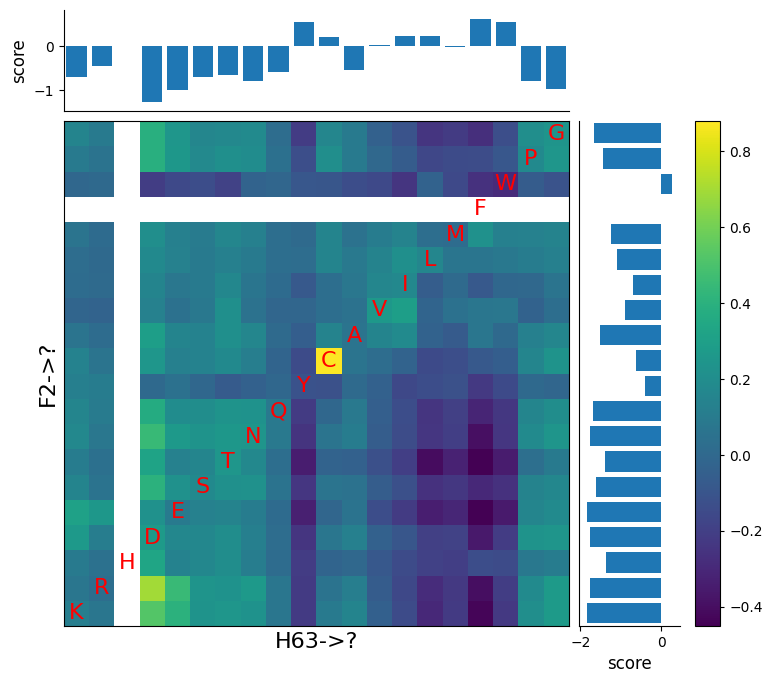

In [ ]:
p = df_epistatic.loc[~df_epistatic.index.str.contains(':')]
p = p.loc[p['code']=='6M3N']
p['mutation'] = p['mut_type'].apply(lambda x: x[-1])

PA = p.loc[p['mut_type'].apply(lambda x: int(x[1:-1]))==2]
PA = PA.set_index('mutation')
PA.loc['F', :] = np.nan
PA = PA.loc[AA]

PB = p.loc[p['mut_type'].apply(lambda x: int(x[1:-1]))==63]
PB = PB.set_index('mutation')
PB.loc['H', :] = np.nan
PB = PB.loc[AA]

p_test_double = pt.loc[('6M3N', 2, 63), ('ESM-MSR_1_dddG', slice(None))]
p_test_double = p_test_double.T.reset_index(level=0, drop=True).T
p_test_double.loc['F', :] = np.nan
p_test_double

AA = ['K', 'R', 'H', 'D', 'E', 'S', 'T', 'N', 'Q', 'Y', 'C', 'A', 'V', 'I', 'L', 'M', 'F', 'W', 'P', 'G']
p_test_double = p_test_double.loc[AA, AA]
#pa = p_test_double.mean(axis=1)
#pb = p_test_double.mean(axis=0)
pa = PA['ESM-MSR_1']
pb = PB['ESM-MSR_1']
_ = plot_joint_with_marginals(p_test_double, pa, pb, aa_labels=AA, pos1='F2->?', pos2='H63->?')

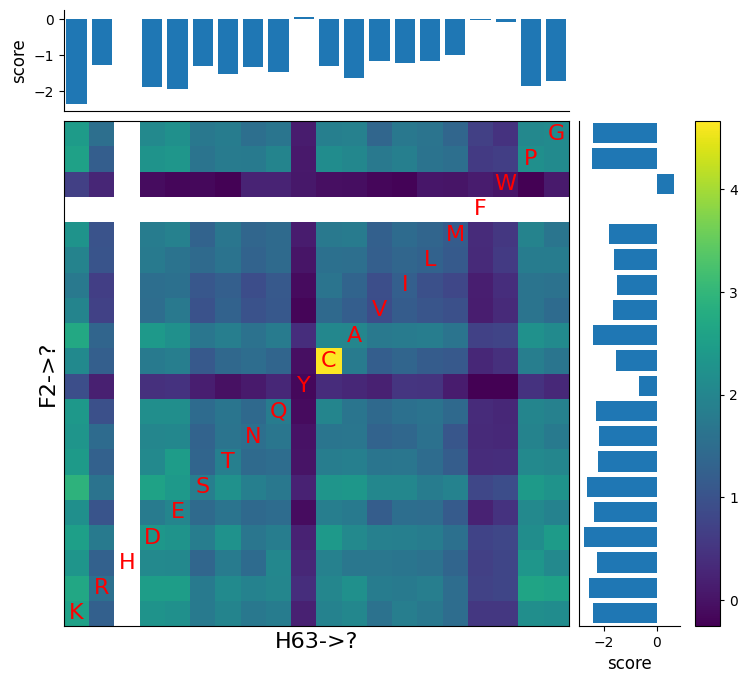

In [ ]:
p_test_double = pt.loc[('6M3N', 2, 63), ('ddG_dddG', slice(None))]
p_test_double = p_test_double.T.reset_index(level=0, drop=True).T
p_test_double.loc['F', :] = np.nan
p_test_double

AA = ['K', 'R', 'H', 'D', 'E', 'S', 'T', 'N', 'Q', 'Y', 'C', 'A', 'V', 'I', 'L', 'M', 'F', 'W', 'P', 'G']
p_test_double = p_test_double.loc[AA, AA]
#pa = p_test_double.mean(axis=1)
#pb = p_test_double.mean(axis=0)
pa = PA['ddG']
pb = PB['ddG']
_ = plot_joint_with_marginals(p_test_double, pa, pb, aa_labels=AA, pos1='F2->?', pos2='H63->?')

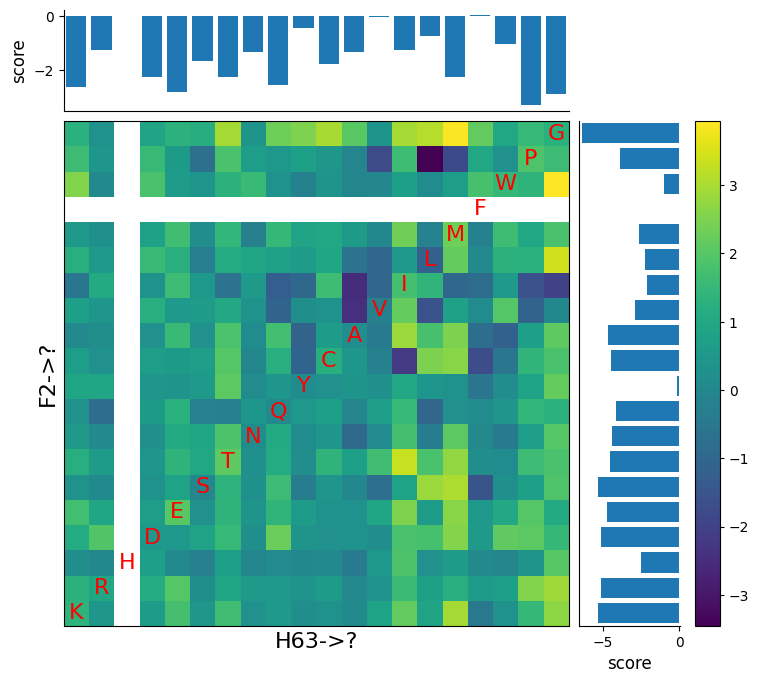

In [ ]:
p_test_double = pt.loc[('6M3N', 2, 63), ('Rosetta Cartesian DDG_1_dddG', slice(None))]
p_test_double = p_test_double.T.reset_index(level=0, drop=True).T
p_test_double.loc['F', :] = np.nan
p_test_double

AA = ['K', 'R', 'H', 'D', 'E', 'S', 'T', 'N', 'Q', 'Y', 'C', 'A', 'V', 'I', 'L', 'M', 'F', 'W', 'P', 'G']
p_test_double = p_test_double.loc[AA, AA]
#pa = p_test_double.mean(axis=1)
#pb = p_test_double.mean(axis=0)
pa = PA['Rosetta Cartesian DDG_1']
pb = PB['Rosetta Cartesian DDG_1']
_ = plot_joint_with_marginals(p_test_double, pa, pb, aa_labels=AA, pos1='F2->?', pos2='H63->?')

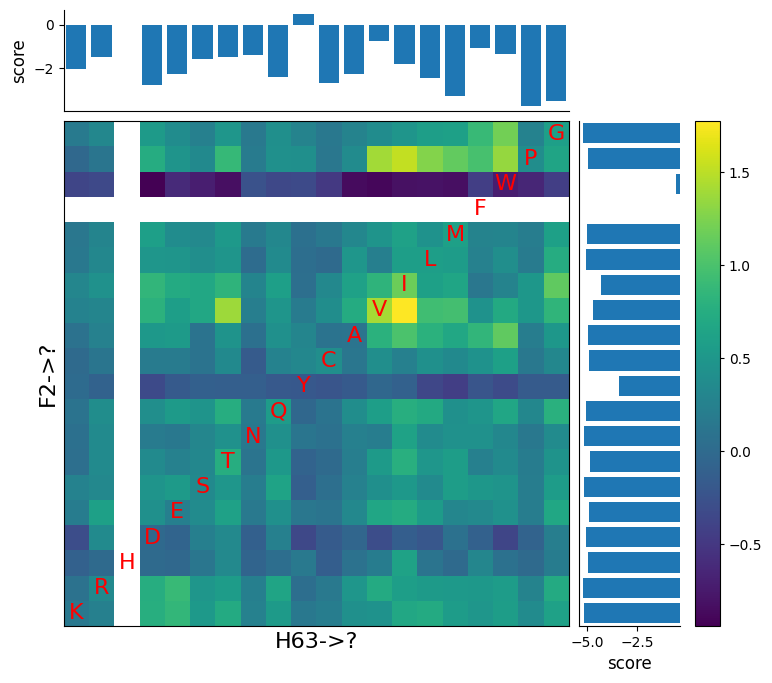

In [ ]:
p_test_double = pt.loc[('6M3N', 2, 63), ('ProteinMPNN_dddG', slice(None))]
p_test_double = p_test_double.T.reset_index(level=0, drop=True).T
p_test_double.loc['F', :] = np.nan
p_test_double

AA = ['K', 'R', 'H', 'D', 'E', 'S', 'T', 'N', 'Q', 'Y', 'C', 'A', 'V', 'I', 'L', 'M', 'F', 'W', 'P', 'G']
p_test_double = p_test_double.loc[AA, AA]
#pa = p_test_double.mean(axis=1)
#pb = p_test_double.mean(axis=0)
pa = PA['ProteinMPNN']
pb = PB['ProteinMPNN']
_ = plot_joint_with_marginals(p_test_double, pa, pb, aa_labels=AA, pos1='F2->?', pos2='H63->?')

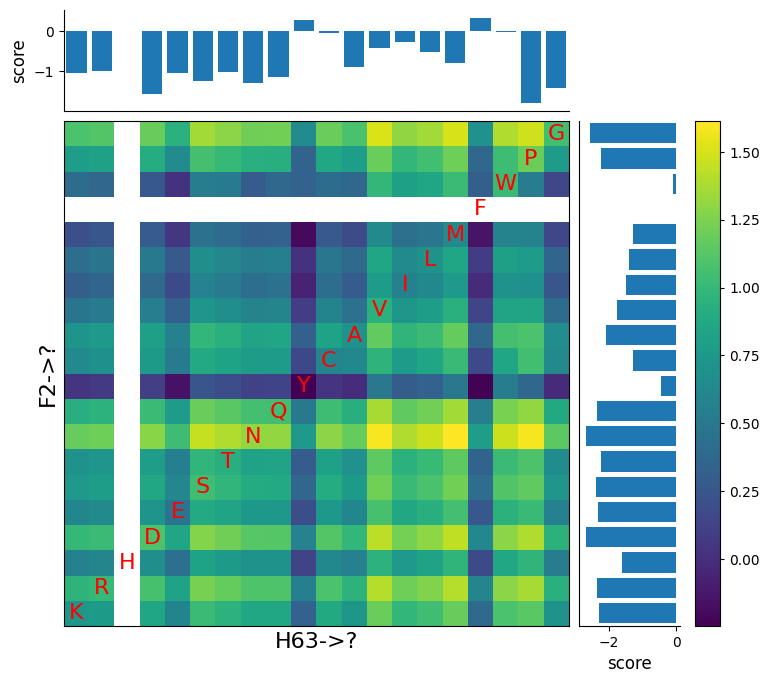

In [ ]:
p_test_double = pt.loc[('6M3N', 2, 63), ('ThermoMPNN(-D)_1_dddG', slice(None))]
p_test_double = p_test_double.T.reset_index(level=0, drop=True).T
p_test_double.loc['F', :] = np.nan
p_test_double

AA = ['K', 'R', 'H', 'D', 'E', 'S', 'T', 'N', 'Q', 'Y', 'C', 'A', 'V', 'I', 'L', 'M', 'F', 'W', 'P', 'G']
p_test_double = p_test_double.loc[AA, AA]
#pa = p_test_double.mean(axis=1)
#pb = p_test_double.mean(axis=0)
pa = PA['ThermoMPNN(-D)_1']
pb = PB['ThermoMPNN(-D)_1']
_ = plot_joint_with_marginals(p_test_double, pa, pb, aa_labels=AA, pos1='F2->?', pos2='H63->?')

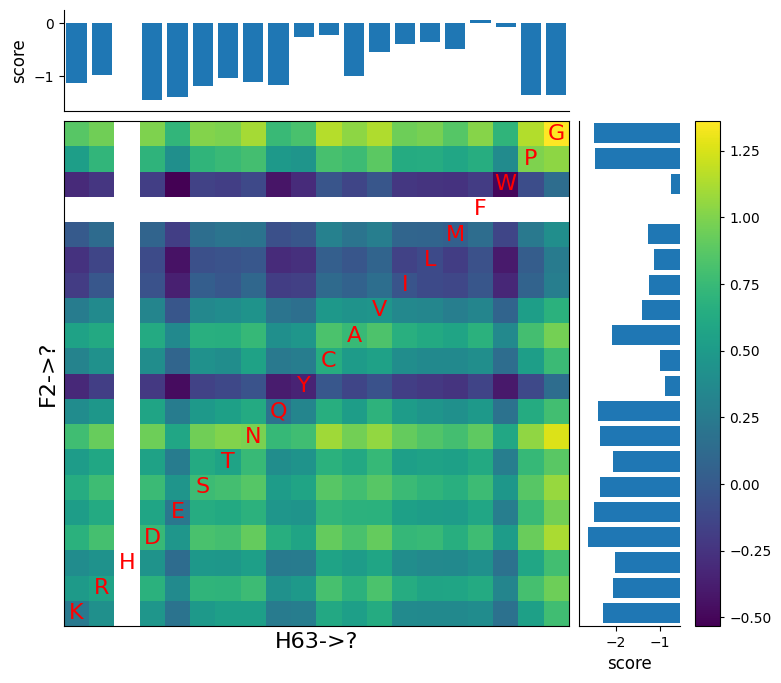

In [ ]:
p_test_double = pt.loc[('6M3N', 2, 63), ('SPURS_1_dddG', slice(None))]
p_test_double = p_test_double.T.reset_index(level=0, drop=True).T
p_test_double.loc['F', :] = np.nan
p_test_double

AA = ['K', 'R', 'H', 'D', 'E', 'S', 'T', 'N', 'Q', 'Y', 'C', 'A', 'V', 'I', 'L', 'M', 'F', 'W', 'P', 'G']
p_test_double = p_test_double.loc[AA, AA]
#pa = p_test_double.mean(axis=1)
#pb = p_test_double.mean(axis=0)
pa = PA['SPURS_1']
pb = PB['SPURS_1']
_ = plot_joint_with_marginals(p_test_double, pa, pb, aa_labels=AA, pos1='F2->?', pos2='H63->?')

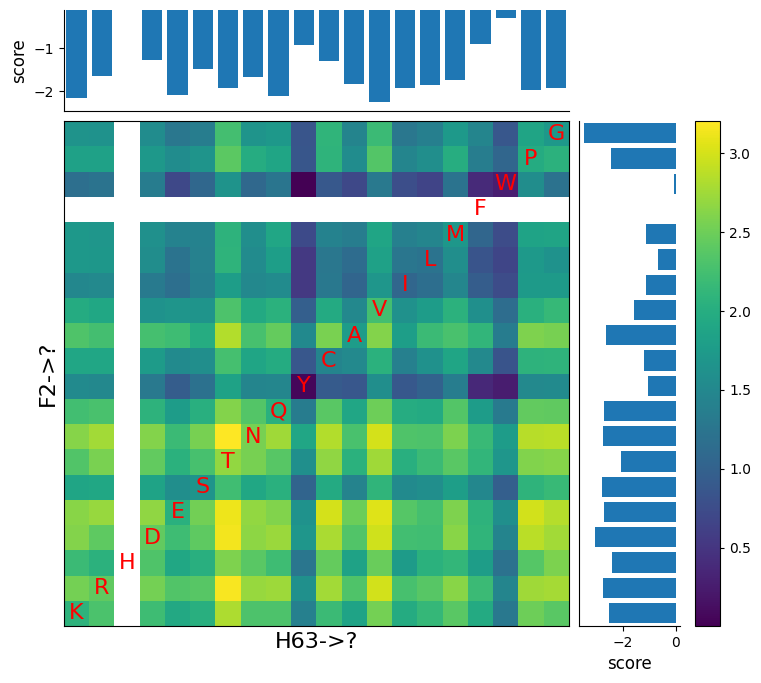

In [ ]:
p_test_double = pt.loc[('6M3N', 2, 63), ('MutateEverything_1_dddG', slice(None))]
p_test_double = p_test_double.T.reset_index(level=0, drop=True).T
p_test_double.loc['F', :] = np.nan
p_test_double

AA = ['K', 'R', 'H', 'D', 'E', 'S', 'T', 'N', 'Q', 'Y', 'C', 'A', 'V', 'I', 'L', 'M', 'F', 'W', 'P', 'G']
p_test_double = p_test_double.loc[AA, AA]
#pa = p_test_double.mean(axis=1)
#pb = p_test_double.mean(axis=0)
pa = PA['MutateEverything_1']
pb = PB['MutateEverything_1']
_ = plot_joint_with_marginals(p_test_double, pa, pb, aa_labels=AA, pos1='F2->?', pos2='H63->?')

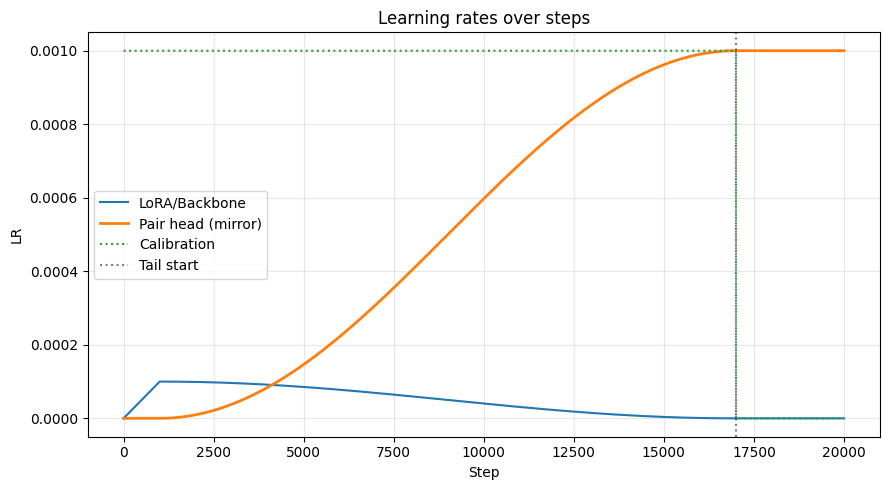

In [ ]:
import math
import numpy as np
import matplotlib.pyplot as plt

# --- Match these to your hparams ---
base_lr           = 1e-4
pair_lr_mult      = 10.0
calib_lr_mult     = 10.0
lr_warmup_steps   = 1000
lr_total_steps    = 20000
lr_tail_steps     = 3000
lr_tail_lora_mult = 0.0   # 0.0 => LoRA frozen in tail
tail_only_pair    = True

main_end = max(0, lr_total_steps - lr_tail_steps)

def warmcos(step, warmup, total_main):
    if total_main <= 0:
        return 1.0
    if step < warmup:
        return step / max(1, warmup)
    t = min(max(0, step - warmup), max(1, total_main - warmup))
    prog = t / max(1, total_main - warmup)
    return 0.5 * (1.0 + math.cos(math.pi * prog))  # 1 -> 0

def lambda_lora(step):
    if step < main_end:
        return warmcos(step, lr_warmup_steps, main_end)
    return lr_tail_lora_mult

def lambda_pair(step):
    if step < lr_warmup_steps:
        return 0.0
    if step < main_end:
        return 1.0 - warmcos(step, lr_warmup_steps, main_end)
    return max(0.0, min(1.0, 1.0 - lr_tail_lora_mult))

def lambda_calib(step):
    if step < main_end:
        return 1.0
    return 0.0 if tail_only_pair else 1.0

steps = np.arange(lr_total_steps+1)
lora_lr  = base_lr * np.array([lambda_lora(s)  for s in steps])
pair_lr  = base_lr * pair_lr_mult  * np.array([lambda_pair(s)  for s in steps])
cal_lr   = base_lr * calib_lr_mult * np.array([lambda_calib(s) for s in steps])

plt.figure(figsize=(9,5))
plt.plot(steps, lora_lr,  label="LoRA/Backbone")
plt.plot(steps, pair_lr,  label="Pair head (mirror)", linewidth=2)
plt.plot(steps, cal_lr,   label="Calibration", linestyle=":")
plt.axvline(main_end, color='k', linestyle=':', alpha=0.5, label="Tail start")
plt.title("Learning rates over steps")
plt.xlabel("Step")
plt.ylabel("LR")
plt.legend()
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()



In [ ]:
# Extract the part of 'code' after the last underscore.
# If no underscore, it takes the whole string.
# If 'code' is NaN, this will result in NaN.
part_after_last_underscore = df['code'].str.rsplit('_', n=1).str[-1]

# Regex for: one letter, two digits, one letter.
# ^ and $ ensure the entire extracted part matches this pattern.
# na=False ensures that if part_after_last_underscore is NaN, it evaluates to False.
regex_suffix_pattern = r'^[a-zA-Z]\d{2}[a-zA-Z]$'
condition2 = part_after_last_underscore.str.fullmatch(regex_suffix_pattern, na=False)

df_destab = df.loc[condition2]
df_no_destab = df.drop(df_destab.index)

# 1. Extract the part of 'code' before the first underscore.
#    If no underscore, it takes the whole string.
code_prefix = df['code'].str.split('_', n=1).str[0]

# 2. Define the regex to match strings containing only A, E, G, H, X.
#    ^ asserts position at start of the string.
#    [AEGHX] matches any character from the set A, E, G, H, X.
#    * matches the previous token between zero and unlimited times.
#    $ asserts position at the end of the string.
regex_pattern = r'^[AEGHX]*$'

# 3. Create a boolean Series by checking if the extracted prefix fully matches the regex.
#    .str.fullmatch() checks if the entire string matches the pattern.
#    .fillna(False) handles any NaN values that might result from NaN 'code' values
#    or if 'code' wasn't a string type initially for some rows.
matches = code_prefix.str.fullmatch(regex_pattern).fillna(False)
matches2 = df.loc[df['code'].str.contains('TrROS')].index

# 4. Use the boolean Series to filter the original DataFrame.
df_synthetic = df.loc[matches | df['code'].str.contains('TrROS', na=False, regex=False)]
df_natural = df.drop(df_synthetic.index)

df_singles = df.loc[~df['mut_type'].str.contains(':')]
df_doubles = df.loc[df['mut_type'].str.contains(':')]

# All raw predictions
df

,ThermoMPNN_1,ThermoMPNN(-D)_1,ThermoMPNN_2,ThermoMPNN(-D)_2,ThermoMPNN_3,ThermoMPNN(-D)_3,ThermoMPNN(-D)_additive_1,ThermoMPNN(-D)_additive_2,ThermoMPNN(-D)_additive_3,ddG_ML_thermo,...,ESM-MSR_chain_3,ESM-MSR_chain_additive_3,ESM3-small-open_chain,ESM3-small-open_chain_additive,random_1,random_2,random_3,ddG_1,ddG_2,ddG_3
uid,,,,,,,,,,,,,,,,,,,,,
1UFM_A11C,0.182458,0.182458,0.229011,0.229011,0.112110,0.112110,0.182458,0.229011,0.112110,0.004061,...,-0.008952,NaN,-3.500977,-3.500977,0.272155,0.570931,0.916654,-0.149661,0.081054,0.319078
1UFM_A11D,-0.534806,-0.534806,-0.776187,-0.776187,-0.690362,-0.690362,-0.534806,-0.776187,-0.690362,-0.023454,...,-0.349982,NaN,-3.756836,-3.756836,0.089641,0.177495,0.818326,-0.216039,-0.121627,0.033731
1UFM_A11E,-0.127483,-0.127483,-0.176427,-0.176427,-0.169683,-0.169683,-0.127483,-0.176427,-0.169683,0.111864,...,-0.195433,NaN,-2.891602,-2.891602,0.074154,0.302124,0.408255,0.177096,0.306805,0.212301
1UFM_A11F,-0.037749,-0.037749,-0.077629,-0.077629,-0.115784,-0.115784,-0.037749,-0.077629,-0.115784,-0.153650,...,-0.200250,NaN,-0.421875,-0.421875,0.275582,0.140575,0.076596,-0.037803,-0.323529,-0.169571
1UFM_A11G,-0.565192,-0.565192,-0.628311,-0.628311,-0.642682,-0.642682,-0.565192,-0.628311,-0.642682,-0.393182,...,-0.567176,NaN,-1.704346,-1.704346,0.292255,0.297336,0.381845,-0.283127,-0.512478,-0.403497
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
HHH_rd1_0949_R10Y:E36S,-1.687004,-0.557682,-1.533284,-1.408043,-1.497178,-0.774565,-1.687004,-1.533284,-1.497178,NaN,...,-1.184945,-1.764554,-6.273010,-8.136230,0.900899,0.575471,0.944118,-0.268626,-0.433310,-0.400328
HHH_rd1_0949_R10Y:E36T,-1.304661,-0.486829,-1.297930,-1.210776,-1.352677,-0.265816,-1.304661,-1.297930,-1.352677,NaN,...,-0.959004,-1.458845,-6.709229,-8.262451,0.146386,0.016234,0.547932,-0.317286,-0.502875,-0.500392
HHH_rd1_0949_R10Y:E36V,-0.525491,-0.274588,-0.531802,-0.501731,-0.583954,0.229817,-0.525491,-0.531802,-0.583954,NaN,...,-0.217062,-1.098734,-4.707153,-6.614746,0.495901,0.402472,0.038472,0.346263,0.372083,0.322442


In [ ]:
df_destab

,ThermoMPNN_1,ThermoMPNN(-D)_1,ThermoMPNN_2,ThermoMPNN(-D)_2,ThermoMPNN_3,ThermoMPNN(-D)_3,ThermoMPNN(-D)_additive_1,ThermoMPNN(-D)_additive_2,ThermoMPNN(-D)_additive_3,ddG_ML_thermo,...,ESM-MSR_chain_3,ESM-MSR_chain_additive_3,ESM3-small-open_chain,ESM3-small-open_chain_additive,random_1,random_2,random_3,ddG_1,ddG_2,ddG_3
uid,,,,,,,,,,,,,,,,,,,,,
2K5H_G11S_A16C,0.046979,0.046979,0.249217,0.249217,0.076645,0.076645,0.046979,0.249217,0.076645,-0.213358,...,-0.127358,NaN,-4.082031,-4.082031,0.994296,0.349725,0.001383,-0.085477,-0.225541,-0.301982
2K5H_G11S_A16D,-1.036003,-1.036003,-0.852490,-0.852490,-1.009371,-1.009371,-1.036003,-0.852490,-1.009371,-2.029711,...,-0.919783,NaN,-2.433594,-2.433594,0.647252,0.115696,0.712361,-2.008197,-1.902532,-2.264372
2K5H_G11S_A16E,-0.587239,-0.587239,-0.503795,-0.503795,-0.641665,-0.641665,-0.587239,-0.503795,-0.641665,-1.146346,...,-0.429852,NaN,-0.200195,-0.200195,0.804128,0.226441,0.613019,-1.127524,-1.119457,-1.249664
2K5H_G11S_A16F,-0.024102,-0.024102,0.287125,0.287125,-0.126980,-0.126980,-0.024102,0.287125,-0.126980,-0.681503,...,-0.523631,NaN,-2.895508,-2.895508,0.886742,0.711250,0.538822,-0.813081,-0.792058,-0.597990
2K5H_G11S_A16G,-0.708306,-0.708306,-0.459338,-0.459338,-0.631421,-0.631421,-0.708306,-0.459338,-0.631421,-0.894964,...,-0.554826,NaN,-2.598633,-2.598633,0.433207,0.269828,0.545558,-0.911818,-0.875252,-1.044720
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2K5H_G23A_W32I,-1.067356,-1.067356,-0.905483,-0.905483,-1.144713,-1.144713,-1.067356,-0.905483,-1.144713,-2.467404,...,-1.256215,NaN,-11.465332,-11.465332,0.260043,0.604416,0.895731,-2.309370,-2.157116,-2.464187
2K5H_G23A_W32L,-0.775358,-0.775358,-0.826621,-0.826621,-1.234344,-1.234344,-0.775358,-0.826621,-1.234344,-1.535847,...,-1.303674,NaN,-9.309570,-9.309570,0.694036,0.109906,0.288450,-1.208400,-1.506144,-1.345123
2K5H_G23A_W32M,-1.115607,-1.115607,-1.004328,-1.004328,-1.199729,-1.199729,-1.115607,-1.004328,-1.199729,-1.658541,...,-1.275073,NaN,-9.964844,-9.964844,0.203364,0.220828,0.961525,-1.390649,-1.434748,-1.673389


In [ ]:
df_synthetic

,ThermoMPNN_1,ThermoMPNN(-D)_1,ThermoMPNN_2,ThermoMPNN(-D)_2,ThermoMPNN_3,ThermoMPNN(-D)_3,ThermoMPNN(-D)_additive_1,ThermoMPNN(-D)_additive_2,ThermoMPNN(-D)_additive_3,ddG_ML_thermo,...,ESM-MSR_chain_3,ESM-MSR_chain_additive_3,ESM3-small-open_chain,ESM3-small-open_chain_additive,random_1,random_2,random_3,ddG_1,ddG_2,ddG_3
uid,,,,,,,,,,,,,,,,,,,,,
EA_run3_0321_0005_A17C,-0.830232,-0.830232,-0.766644,-0.766644,-0.724406,-0.724406,-0.830232,-0.766644,-0.724406,-1.642537,...,-0.464985,NaN,-9.240234,-9.240234,0.704097,0.358876,0.944919,-1.774227,-1.591072,-1.696376
EA_run3_0321_0005_A17D,-2.164598,-2.164598,-2.033794,-2.033794,-2.250737,-2.250737,-2.164598,-2.033794,-2.250737,-1.047616,...,-2.072132,NaN,-13.870117,-13.870117,0.676405,0.573310,0.871597,-0.932687,-0.884769,-1.094622
EA_run3_0321_0005_A17E,-2.029873,-2.029873,-1.955475,-1.955475,-2.051458,-2.051458,-2.029873,-1.955475,-2.051458,-1.141996,...,-2.076048,NaN,-13.519531,-13.519531,0.104346,0.444437,0.356610,-1.104963,-1.237719,-1.102093
EA_run3_0321_0005_A17F,-1.202985,-1.202985,-1.222521,-1.222521,-1.385140,-1.385140,-1.202985,-1.222521,-1.385140,-0.086403,...,-1.048928,NaN,-16.625000,-16.625000,0.931742,0.021894,0.310032,-0.061574,-0.279192,-0.222040
EA_run3_0321_0005_A17G,-1.583284,-1.583284,-1.513969,-1.513969,-1.603062,-1.603062,-1.583284,-1.513969,-1.603062,-0.826196,...,-1.572290,NaN,-7.304688,-7.304688,0.409424,0.529199,0.285222,-0.694626,-0.826482,-0.841022
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
HHH_rd1_0949_R10Y:E36S,-1.687004,-0.557682,-1.533284,-1.408043,-1.497178,-0.774565,-1.687004,-1.533284,-1.497178,NaN,...,-1.184945,-1.764554,-6.273010,-8.136230,0.900899,0.575471,0.944118,-0.268626,-0.433310,-0.400328
HHH_rd1_0949_R10Y:E36T,-1.304661,-0.486829,-1.297930,-1.210776,-1.352677,-0.265816,-1.304661,-1.297930,-1.352677,NaN,...,-0.959004,-1.458845,-6.709229,-8.262451,0.146386,0.016234,0.547932,-0.317286,-0.502875,-0.500392
HHH_rd1_0949_R10Y:E36V,-0.525491,-0.274588,-0.531802,-0.501731,-0.583954,0.229817,-0.525491,-0.531802,-0.583954,NaN,...,-0.217062,-1.098734,-4.707153,-6.614746,0.495901,0.402472,0.038472,0.346263,0.372083,0.322442


In [ ]:
df_scores_singles = pd.DataFrame(index=pd.MultiIndex.from_product([['hyperopt_splits-test'], ['ungrouped', 'grouped']]))

df_scores_singles = assess_grouped_spearman(df_singles, df_scores_singles, 'ESM-MSR_1', 'hyperopt_splits-test', pred_col='ESM-MSR_1', label='ddG')
df_scores_singles = assess_grouped_spearman(df_singles, df_scores_singles, 'ESM-MSR_2', 'hyperopt_splits-test', pred_col='ESM-MSR_2', label='ddG')
df_scores_singles = assess_grouped_spearman(df_singles, df_scores_singles, 'ESM-MSR_3', 'hyperopt_splits-test', pred_col='ESM-MSR_3', label='ddG')
df_scores_singles = df_scores_singles.iloc[:, -6:].dropna(how='all')

df_scores_singles = assess_grouped_spearman(df_singles, df_scores_singles, 'SPURS_1', 'hyperopt_splits-test', pred_col='SPURS_1', label='ddG')
df_scores_singles = assess_grouped_spearman(df_singles, df_scores_singles, 'SPURS_2', 'hyperopt_splits-test', pred_col='SPURS_2', label='ddG')
df_scores_singles = assess_grouped_spearman(df_singles, df_scores_singles, 'SPURS_3', 'hyperopt_splits-test', pred_col='SPURS_3', label='ddG')

df_scores_singles = assess_grouped_spearman(df_singles, df_scores_singles, 'ThermoMPNN(-D)_1', 'hyperopt_splits-test', pred_col='ThermoMPNN(-D)_1', label='ddG')
df_scores_singles = assess_grouped_spearman(df_singles, df_scores_singles, 'ThermoMPNN(-D)_2', 'hyperopt_splits-test', pred_col='ThermoMPNN(-D)_2', label='ddG')
df_scores_singles = assess_grouped_spearman(df_singles, df_scores_singles, 'ThermoMPNN(-D)_3', 'hyperopt_splits-test', pred_col='ThermoMPNN(-D)_3', label='ddG')

df_scores_singles = assess_grouped_spearman(df_singles, df_scores_singles, 'MutateEverything_1', 'hyperopt_splits-test', pred_col='MutateEverything_1', label='ddG')
df_scores_singles = assess_grouped_spearman(df_singles, df_scores_singles, 'MutateEverything_2', 'hyperopt_splits-test', pred_col='MutateEverything_2', label='ddG')
df_scores_singles = assess_grouped_spearman(df_singles, df_scores_singles, 'MutateEverything_3', 'hyperopt_splits-test', pred_col='MutateEverything_3', label='ddG')

df_scores_singles = assess_grouped_spearman(df_singles, df_scores_singles, 'ESM3-small-open', 'hyperopt_splits-test', pred_col='ESM3-small-open', label='ddG')
df_scores_singles = assess_grouped_spearman(df_singles, df_scores_singles, 'ESM3-small', 'hyperopt_splits-test', pred_col='ESM3-small', label='ddG')
df_scores_singles = assess_grouped_spearman(df_singles, df_scores_singles, 'ESM3-medium', 'hyperopt_splits-test', pred_col='ESM3-medium', label='ddG')
df_scores_singles = assess_grouped_spearman(df_singles, df_scores_singles, 'ESM3-large', 'hyperopt_splits-test', pred_col='ESM3-large', label='ddG')

df_scores_singles = assess_grouped_spearman(df_singles, df_scores_singles, 'Rosetta Cartesian DDG_1', 'hyperopt_splits-test', pred_col='Rosetta Cartesian DDG_1', label='ddG')
df_scores_singles = assess_grouped_spearman(df_singles, df_scores_singles, 'Rosetta Cartesian DDG_2', 'hyperopt_splits-test', pred_col='Rosetta Cartesian DDG_2', label='ddG')
df_scores_singles = assess_grouped_spearman(df_singles, df_scores_singles, 'Rosetta Cartesian DDG_3', 'hyperopt_splits-test', pred_col='Rosetta Cartesian DDG_3', label='ddG')

df_scores_singles = assess_grouped_spearman(df_singles, df_scores_singles, 'ProteinMPNN', 'hyperopt_splits-test', pred_col='ProteinMPNN', label='ddG')

df_scores_singles

df_scores_doubles = pd.DataFrame(index=pd.MultiIndex.from_product([['hyperopt_splits-test'], ['ungrouped', 'grouped']]))

df_scores_doubles = assess_grouped_spearman(df_doubles, df_scores_doubles, 'ESM-MSR_1', 'hyperopt_splits-test', pred_col='ESM-MSR_1', label='ddG')
df_scores_doubles = assess_grouped_spearman(df_doubles, df_scores_doubles, 'ESM-MSR_2', 'hyperopt_splits-test', pred_col='ESM-MSR_2', label='ddG')
df_scores_doubles = assess_grouped_spearman(df_doubles, df_scores_doubles, 'ESM-MSR_3', 'hyperopt_splits-test', pred_col='ESM-MSR_3', label='ddG')
df_scores_doubles = df_scores_doubles.iloc[:, -6:].dropna(how='all')

df_scores_doubles = assess_grouped_spearman(df_doubles, df_scores_doubles, 'SPURS_1', 'hyperopt_splits-test', pred_col='SPURS_1', label='ddG')
df_scores_doubles = assess_grouped_spearman(df_doubles, df_scores_doubles, 'SPURS_2', 'hyperopt_splits-test', pred_col='SPURS_2', label='ddG')
df_scores_doubles = assess_grouped_spearman(df_doubles, df_scores_doubles, 'SPURS_3', 'hyperopt_splits-test', pred_col='SPURS_3', label='ddG')

df_scores_doubles = assess_grouped_spearman(df_doubles, df_scores_doubles, 'ThermoMPNN(-D)_1', 'hyperopt_splits-test', pred_col='ThermoMPNN(-D)_1', label='ddG')
df_scores_doubles = assess_grouped_spearman(df_doubles, df_scores_doubles, 'ThermoMPNN(-D)_2', 'hyperopt_splits-test', pred_col='ThermoMPNN(-D)_2', label='ddG')
df_scores_doubles = assess_grouped_spearman(df_doubles, df_scores_doubles, 'ThermoMPNN(-D)_3', 'hyperopt_splits-test', pred_col='ThermoMPNN(-D)_3', label='ddG')

df_scores_doubles = assess_grouped_spearman(df_doubles, df_scores_doubles, 'MutateEverything_1', 'hyperopt_splits-test', pred_col='MutateEverything_1', label='ddG')
df_scores_doubles = assess_grouped_spearman(df_doubles, df_scores_doubles, 'MutateEverything_2', 'hyperopt_splits-test', pred_col='MutateEverything_2', label='ddG')
df_scores_doubles = assess_grouped_spearman(df_doubles, df_scores_doubles, 'MutateEverything_3', 'hyperopt_splits-test', pred_col='MutateEverything_3', label='ddG')

df_scores_doubles = assess_grouped_spearman(df_doubles, df_scores_doubles, 'ESM3-small-open', 'hyperopt_splits-test', pred_col='ESM3-small-open', label='ddG')
df_scores_doubles = assess_grouped_spearman(df_doubles, df_scores_doubles, 'ESM3-small', 'hyperopt_splits-test', pred_col='ESM3-small', label='ddG')
df_scores_doubles = assess_grouped_spearman(df_doubles, df_scores_doubles, 'ESM3-medium', 'hyperopt_splits-test', pred_col='ESM3-medium', label='ddG')
df_scores_doubles = assess_grouped_spearman(df_doubles, df_scores_doubles, 'ESM3-large', 'hyperopt_splits-test', pred_col='ESM3-large', label='ddG')

df_scores_doubles = assess_grouped_spearman(df_doubles, df_scores_doubles, 'Rosetta Cartesian DDG_1', 'hyperopt_splits-test', pred_col='Rosetta Cartesian DDG_1', label='ddG')
df_scores_doubles = assess_grouped_spearman(df_doubles, df_scores_doubles, 'Rosetta Cartesian DDG_2', 'hyperopt_splits-test', pred_col='Rosetta Cartesian DDG_2', label='ddG')
df_scores_doubles = assess_grouped_spearman(df_doubles, df_scores_doubles, 'Rosetta Cartesian DDG_3', 'hyperopt_splits-test', pred_col='Rosetta Cartesian DDG_3', label='ddG')

df_scores_doubles = assess_grouped_spearman(df_doubles, df_scores_doubles, 'ProteinMPNN', 'hyperopt_splits-test', pred_col='ProteinMPNN', label='ddG')

df_scores_doubles

df_scores_destab = pd.DataFrame(index=pd.MultiIndex.from_product([['hyperopt_splits-test'], ['ungrouped', 'grouped']]))

df_scores_destab = assess_grouped_spearman(df_destab, df_scores_destab, 'ESM-MSR_1', 'hyperopt_splits-test', pred_col='ESM-MSR_1', label='ddG')
df_scores_destab = assess_grouped_spearman(df_destab, df_scores_destab, 'ESM-MSR_2', 'hyperopt_splits-test', pred_col='ESM-MSR_2', label='ddG')
df_scores_destab = assess_grouped_spearman(df_destab, df_scores_destab, 'ESM-MSR_3', 'hyperopt_splits-test', pred_col='ESM-MSR_3', label='ddG')
df_scores_destab = df_scores_destab.iloc[:, -6:].dropna(how='all')

df_scores_destab = assess_grouped_spearman(df_destab, df_scores_destab, 'SPURS_1', 'hyperopt_splits-test', pred_col='SPURS_1', label='ddG')
df_scores_destab = assess_grouped_spearman(df_destab, df_scores_destab, 'SPURS_2', 'hyperopt_splits-test', pred_col='SPURS_2', label='ddG')
df_scores_destab = assess_grouped_spearman(df_destab, df_scores_destab, 'SPURS_3', 'hyperopt_splits-test', pred_col='SPURS_3', label='ddG')

df_scores_destab = assess_grouped_spearman(df_destab, df_scores_destab, 'ThermoMPNN(-D)_1', 'hyperopt_splits-test', pred_col='ThermoMPNN(-D)_1', label='ddG')
df_scores_destab = assess_grouped_spearman(df_destab, df_scores_destab, 'ThermoMPNN(-D)_2', 'hyperopt_splits-test', pred_col='ThermoMPNN(-D)_2', label='ddG')
df_scores_destab = assess_grouped_spearman(df_destab, df_scores_destab, 'ThermoMPNN(-D)_3', 'hyperopt_splits-test', pred_col='ThermoMPNN(-D)_3', label='ddG')

df_scores_destab = assess_grouped_spearman(df_destab, df_scores_destab, 'MutateEverything_1', 'hyperopt_splits-test', pred_col='MutateEverything_1', label='ddG')
df_scores_destab = assess_grouped_spearman(df_destab, df_scores_destab, 'MutateEverything_2', 'hyperopt_splits-test', pred_col='MutateEverything_2', label='ddG')
df_scores_destab = assess_grouped_spearman(df_destab, df_scores_destab, 'MutateEverything_3', 'hyperopt_splits-test', pred_col='MutateEverything_3', label='ddG')

df_scores_destab = assess_grouped_spearman(df_destab, df_scores_destab, 'ESM3-small-open', 'hyperopt_splits-test', pred_col='ESM3-small-open', label='ddG')
df_scores_destab = assess_grouped_spearman(df_destab, df_scores_destab, 'ESM3-small', 'hyperopt_splits-test', pred_col='ESM3-small', label='ddG')
df_scores_destab = assess_grouped_spearman(df_destab, df_scores_destab, 'ESM3-medium', 'hyperopt_splits-test', pred_col='ESM3-medium', label='ddG')
df_scores_destab = assess_grouped_spearman(df_destab, df_scores_destab, 'ESM3-large', 'hyperopt_splits-test', pred_col='ESM3-large', label='ddG')

df_scores_destab = assess_grouped_spearman(df_destab, df_scores_destab, 'Rosetta Cartesian DDG_1', 'hyperopt_splits-test', pred_col='Rosetta Cartesian DDG_1', label='ddG')
df_scores_destab = assess_grouped_spearman(df_destab, df_scores_destab, 'Rosetta Cartesian DDG_2', 'hyperopt_splits-test', pred_col='Rosetta Cartesian DDG_2', label='ddG')
df_scores_destab = assess_grouped_spearman(df_destab, df_scores_destab, 'Rosetta Cartesian DDG_3', 'hyperopt_splits-test', pred_col='Rosetta Cartesian DDG_3', label='ddG')

df_scores_destab = assess_grouped_spearman(df_destab, df_scores_destab, 'ProteinMPNN', 'hyperopt_splits-test', pred_col='ProteinMPNN', label='ddG')

df_scores_destab

df_scores_no_destab = pd.DataFrame(index=pd.MultiIndex.from_product([['hyperopt_splits-test'], ['ungrouped', 'grouped']]))

df_scores_no_destab = assess_grouped_spearman(df_no_destab, df_scores_no_destab, 'ESM-MSR_1', 'hyperopt_splits-test', pred_col='ESM-MSR_1', label='ddG')
df_scores_no_destab = assess_grouped_spearman(df_no_destab, df_scores_no_destab, 'ESM-MSR_2', 'hyperopt_splits-test', pred_col='ESM-MSR_2', label='ddG')
df_scores_no_destab = assess_grouped_spearman(df_no_destab, df_scores_no_destab, 'ESM-MSR_3', 'hyperopt_splits-test', pred_col='ESM-MSR_3', label='ddG')
df_scores_no_destab = df_scores_no_destab.iloc[:, -6:].dropna(how='all')

df_scores_no_destab = assess_grouped_spearman(df_no_destab, df_scores_no_destab, 'SPURS_1', 'hyperopt_splits-test', pred_col='SPURS_1', label='ddG')
df_scores_no_destab = assess_grouped_spearman(df_no_destab, df_scores_no_destab, 'SPURS_2', 'hyperopt_splits-test', pred_col='SPURS_2', label='ddG')
df_scores_no_destab = assess_grouped_spearman(df_no_destab, df_scores_no_destab, 'SPURS_3', 'hyperopt_splits-test', pred_col='SPURS_3', label='ddG')

df_scores_no_destab = assess_grouped_spearman(df_no_destab, df_scores_no_destab, 'ThermoMPNN(-D)_1', 'hyperopt_splits-test', pred_col='ThermoMPNN(-D)_1', label='ddG')
df_scores_no_destab = assess_grouped_spearman(df_no_destab, df_scores_no_destab, 'ThermoMPNN(-D)_2', 'hyperopt_splits-test', pred_col='ThermoMPNN(-D)_2', label='ddG')
df_scores_no_destab = assess_grouped_spearman(df_no_destab, df_scores_no_destab, 'ThermoMPNN(-D)_3', 'hyperopt_splits-test', pred_col='ThermoMPNN(-D)_3', label='ddG')

df_scores_no_destab = assess_grouped_spearman(df_no_destab, df_scores_no_destab, 'MutateEverything_1', 'hyperopt_splits-test', pred_col='MutateEverything_1', label='ddG')
df_scores_no_destab = assess_grouped_spearman(df_no_destab, df_scores_no_destab, 'MutateEverything_2', 'hyperopt_splits-test', pred_col='MutateEverything_2', label='ddG')
df_scores_no_destab = assess_grouped_spearman(df_no_destab, df_scores_no_destab, 'MutateEverything_3', 'hyperopt_splits-test', pred_col='MutateEverything_3', label='ddG')

df_scores_no_destab = assess_grouped_spearman(df_no_destab, df_scores_no_destab, 'ESM3-small-open', 'hyperopt_splits-test', pred_col='ESM3-small-open', label='ddG')
df_scores_no_destab = assess_grouped_spearman(df_no_destab, df_scores_no_destab, 'ESM3-small', 'hyperopt_splits-test', pred_col='ESM3-small', label='ddG')
df_scores_no_destab = assess_grouped_spearman(df_no_destab, df_scores_no_destab, 'ESM3-medium', 'hyperopt_splits-test', pred_col='ESM3-medium', label='ddG')
df_scores_no_destab = assess_grouped_spearman(df_no_destab, df_scores_no_destab, 'ESM3-large', 'hyperopt_splits-test', pred_col='ESM3-large', label='ddG')

df_scores_no_destab = assess_grouped_spearman(df_no_destab, df_scores_no_destab, 'Rosetta Cartesian DDG_1', 'hyperopt_splits-test', pred_col='Rosetta Cartesian DDG_1', label='ddG')
df_scores_no_destab = assess_grouped_spearman(df_no_destab, df_scores_no_destab, 'Rosetta Cartesian DDG_2', 'hyperopt_splits-test', pred_col='Rosetta Cartesian DDG_2', label='ddG')
df_scores_no_destab = assess_grouped_spearman(df_no_destab, df_scores_no_destab, 'Rosetta Cartesian DDG_3', 'hyperopt_splits-test', pred_col='Rosetta Cartesian DDG_3', label='ddG')

df_scores_no_destab = assess_grouped_spearman(df_no_destab, df_scores_no_destab, 'ProteinMPNN', 'hyperopt_splits-test', pred_col='ProteinMPNN', label='ddG')

df_scores_no_destab

df_scores_synthetic = pd.read_csv('~/PSLMs/data/lora/test_scores_new.csv', index_col=[0,1])

df_scores_synthetic = assess_grouped_spearman(df_synthetic, df_scores_synthetic, 'ESM-MSR_1', 'hyperopt_splits-test', pred_col='ESM-MSR_1', label='ddG')
df_scores_synthetic = assess_grouped_spearman(df_synthetic, df_scores_synthetic, 'ESM-MSR_2', 'hyperopt_splits-test', pred_col='ESM-MSR_2', label='ddG')
df_scores_synthetic = assess_grouped_spearman(df_synthetic, df_scores_synthetic, 'ESM-MSR_3', 'hyperopt_splits-test', pred_col='ESM-MSR_3', label='ddG')
df_scores_synthetic = df_scores_synthetic.iloc[:, -6:].dropna(how='all')

df_scores_synthetic = assess_grouped_spearman(df_synthetic, df_scores_synthetic, 'SPURS_1', 'hyperopt_splits-test', pred_col='SPURS_1', label='ddG')
df_scores_synthetic = assess_grouped_spearman(df_synthetic, df_scores_synthetic, 'SPURS_2', 'hyperopt_splits-test', pred_col='SPURS_2', label='ddG')
df_scores_synthetic = assess_grouped_spearman(df_synthetic, df_scores_synthetic, 'SPURS_3', 'hyperopt_splits-test', pred_col='SPURS_3', label='ddG')

df_scores_synthetic = assess_grouped_spearman(df_synthetic, df_scores_synthetic, 'ThermoMPNN(-D)_1', 'hyperopt_splits-test', pred_col='ThermoMPNN(-D)_1', label='ddG')
df_scores_synthetic = assess_grouped_spearman(df_synthetic, df_scores_synthetic, 'ThermoMPNN(-D)_2', 'hyperopt_splits-test', pred_col='ThermoMPNN(-D)_2', label='ddG')
df_scores_synthetic = assess_grouped_spearman(df_synthetic, df_scores_synthetic, 'ThermoMPNN(-D)_3', 'hyperopt_splits-test', pred_col='ThermoMPNN(-D)_3', label='ddG')

df_scores_synthetic = assess_grouped_spearman(df_synthetic, df_scores_synthetic, 'MutateEverything_1', 'hyperopt_splits-test', pred_col='MutateEverything_1', label='ddG')
df_scores_synthetic = assess_grouped_spearman(df_synthetic, df_scores_synthetic, 'MutateEverything_2', 'hyperopt_splits-test', pred_col='MutateEverything_2', label='ddG')
df_scores_synthetic = assess_grouped_spearman(df_synthetic, df_scores_synthetic, 'MutateEverything_3', 'hyperopt_splits-test', pred_col='MutateEverything_3', label='ddG')

df_scores_synthetic = assess_grouped_spearman(df_synthetic, df_scores_synthetic, 'ESM3-small-open', 'hyperopt_splits-test', pred_col='ESM3-small-open', label='ddG')
df_scores_synthetic = assess_grouped_spearman(df_synthetic, df_scores_synthetic, 'ESM3-small', 'hyperopt_splits-test', pred_col='ESM3-small', label='ddG')
df_scores_synthetic = assess_grouped_spearman(df_synthetic, df_scores_synthetic, 'ESM3-medium', 'hyperopt_splits-test', pred_col='ESM3-medium', label='ddG')
df_scores_synthetic = assess_grouped_spearman(df_synthetic, df_scores_synthetic, 'ESM3-large', 'hyperopt_splits-test', pred_col='ESM3-large', label='ddG')

df_scores_synthetic = assess_grouped_spearman(df_synthetic, df_scores_synthetic, 'Rosetta Cartesian DDG_1', 'hyperopt_splits-test', pred_col='Rosetta Cartesian DDG_1', label='ddG')
df_scores_synthetic = assess_grouped_spearman(df_synthetic, df_scores_synthetic, 'Rosetta Cartesian DDG_2', 'hyperopt_splits-test', pred_col='Rosetta Cartesian DDG_2', label='ddG')
df_scores_synthetic = assess_grouped_spearman(df_synthetic, df_scores_synthetic, 'Rosetta Cartesian DDG_3', 'hyperopt_splits-test', pred_col='Rosetta Cartesian DDG_3', label='ddG')

df_scores_synthetic = assess_grouped_spearman(df_synthetic, df_scores_synthetic, 'ProteinMPNN', 'hyperopt_splits-test', pred_col='ProteinMPNN', label='ddG')

df_scores_synthetic

df_scores_natural = pd.read_csv('~/PSLMs/data/lora/test_scores_new.csv', index_col=[0,1])

df_scores_natural = assess_grouped_spearman(df_natural, df_scores_natural, 'ESM-MSR_1', 'hyperopt_splits-test', pred_col='ESM-MSR_1', label='ddG')
df_scores_natural = assess_grouped_spearman(df_natural, df_scores_natural, 'ESM-MSR_2', 'hyperopt_splits-test', pred_col='ESM-MSR_2', label='ddG')
df_scores_natural = assess_grouped_spearman(df_natural, df_scores_natural, 'ESM-MSR_3', 'hyperopt_splits-test', pred_col='ESM-MSR_3', label='ddG')
df_scores_natural = df_scores_natural.iloc[:, -6:].dropna(how='all')

df_scores_natural = assess_grouped_spearman(df_natural, df_scores_natural, 'SPURS_1', 'hyperopt_splits-test', pred_col='SPURS_1', label='ddG')
df_scores_natural = assess_grouped_spearman(df_natural, df_scores_natural, 'SPURS_2', 'hyperopt_splits-test', pred_col='SPURS_2', label='ddG')
df_scores_natural = assess_grouped_spearman(df_natural, df_scores_natural, 'SPURS_3', 'hyperopt_splits-test', pred_col='SPURS_3', label='ddG')

df_scores_natural = assess_grouped_spearman(df_natural, df_scores_natural, 'ThermoMPNN(-D)_1', 'hyperopt_splits-test', pred_col='ThermoMPNN(-D)_1', label='ddG')
df_scores_natural = assess_grouped_spearman(df_natural, df_scores_natural, 'ThermoMPNN(-D)_2', 'hyperopt_splits-test', pred_col='ThermoMPNN(-D)_2', label='ddG')
df_scores_natural = assess_grouped_spearman(df_natural, df_scores_natural, 'ThermoMPNN(-D)_3', 'hyperopt_splits-test', pred_col='ThermoMPNN(-D)_3', label='ddG')

df_scores_natural = assess_grouped_spearman(df_natural, df_scores_natural, 'MutateEverything_1', 'hyperopt_splits-test', pred_col='MutateEverything_1', label='ddG')
df_scores_natural = assess_grouped_spearman(df_natural, df_scores_natural, 'MutateEverything_2', 'hyperopt_splits-test', pred_col='MutateEverything_2', label='ddG')
df_scores_natural = assess_grouped_spearman(df_natural, df_scores_natural, 'MutateEverything_3', 'hyperopt_splits-test', pred_col='MutateEverything_3', label='ddG')

df_scores_natural = assess_grouped_spearman(df_natural, df_scores_natural, 'ESM3-small-open', 'hyperopt_splits-test', pred_col='ESM3-small-open', label='ddG')
df_scores_natural = assess_grouped_spearman(df_natural, df_scores_natural, 'ESM3-small', 'hyperopt_splits-test', pred_col='ESM3-small', label='ddG')
df_scores_natural = assess_grouped_spearman(df_natural, df_scores_natural, 'ESM3-medium', 'hyperopt_splits-test', pred_col='ESM3-medium', label='ddG')
df_scores_natural = assess_grouped_spearman(df_natural, df_scores_natural, 'ESM3-large', 'hyperopt_splits-test', pred_col='ESM3-large', label='ddG')

df_scores_natural = assess_grouped_spearman(df_natural, df_scores_natural, 'Rosetta Cartesian DDG_1', 'hyperopt_splits-test', pred_col='Rosetta Cartesian DDG_1', label='ddG')
df_scores_natural = assess_grouped_spearman(df_natural, df_scores_natural, 'Rosetta Cartesian DDG_2', 'hyperopt_splits-test', pred_col='Rosetta Cartesian DDG_2', label='ddG')
df_scores_natural = assess_grouped_spearman(df_natural, df_scores_natural, 'Rosetta Cartesian DDG_3', 'hyperopt_splits-test', pred_col='Rosetta Cartesian DDG_3', label='ddG')

df_scores_natural = assess_grouped_spearman(df_natural, df_scores_natural, 'ProteinMPNN', 'hyperopt_splits-test', pred_col='ProteinMPNN', label='ddG')

df_scores_natural

ESM-MSR_2  ESM-MSR_2_n  ESM-MSR_2_groups  \
dataset              grouping                                              
hyperopt_splits-test ungrouped   0.703783    18107.000               NaN   
                     grouped     0.819630     2263.375               8.0   

                                ESM-MSR_3  ESM-MSR_3_n  ESM-MSR_3_groups  \
dataset              grouping                                              
hyperopt_splits-test ungrouped    0.71535    18107.000               NaN   
                     grouped      0.81884     2263.375               8.0   

                                 SPURS_1  SPURS_1_n  SPURS_1_groups   SPURS_2  \
dataset              grouping                                                   
hyperopt_splits-test ungrouped  0.726755  18107.000             NaN  0.742205   
                     grouped    0.695642   2263.375             8.0  0.696805   

                                ...  Rosetta Cartesian DDG_1_groups  \
dataset              grouping   ...                                   
hyperopt_splits-test ungrouped  ...                             NaN   
                     grouped    ...                             8.0   

                                Rosetta Cartesian DDG_2  \
dataset              grouping                             
hyperopt_splits-test ungrouped                 0.687554   
                     grouped                   0.654959   

                                Rosetta Cartesian DDG_2_n  \
dataset              grouping                               
hyperopt_splits-test ungrouped                  18105.000   
                     grouped                     2263.125   

                                Rosetta Cartesian DDG_2_groups  \
dataset              grouping                                    
hyperopt_splits-test ungrouped                             NaN   
                     grouped                               8.0   

                                Rosetta Cartesian DDG_3  \
dataset              grouping                             
hyperopt_splits-test ungrouped                 0.688168   
                     grouped                   0.655747   

                                Rosetta Cartesian DDG_3_n  \
dataset              grouping                               
hyperopt_splits-test ungrouped                  18105.000   
                     grouped                     2263.125   

                                Rosetta Cartesian DDG_3_groups  ProteinMPNN  \
dataset              grouping                                                 
hyperopt_splits-test ungrouped                             NaN     0.574080   
                     grouped                               8.0     0.609302   

                                ProteinMPNN_n  ProteinMPNN_groups  
dataset              grouping                                      
hyperopt_splits-test ungrouped      18107.000                 NaN  
                     grouped         2263.375                 8.0  

[2 rows x 57 columns]

In [ ]:
df_scores_no_destab

ESM-MSR_2   ESM-MSR_2_n  ESM-MSR_2_groups  \
hyperopt_splits-test ungrouped   0.720096  41398.000000               NaN   
                     grouped     0.803985   1217.588235              34.0   

                                ESM-MSR_3   ESM-MSR_3_n  ESM-MSR_3_groups  \
hyperopt_splits-test ungrouped   0.733075  41398.000000               NaN   
                     grouped     0.802897   1217.588235              34.0   

                                 SPURS_1     SPURS_1_n  SPURS_1_groups  \
hyperopt_splits-test ungrouped  0.713068  41398.000000             NaN   
                     grouped    0.648094   1217.588235            34.0   

                                 SPURS_2  ...  Rosetta Cartesian DDG_1_groups  \
hyperopt_splits-test ungrouped  0.723446  ...                             NaN   
                     grouped    0.606036  ...                            34.0   

                                Rosetta Cartesian DDG_2  \
hyperopt_splits-test ungrouped                 0.656903   
                     grouped                   0.631278   

                                Rosetta Cartesian DDG_2_n  \
hyperopt_splits-test ungrouped               41387.000000   
                     grouped                  1217.264706   

                                Rosetta Cartesian DDG_2_groups  \
hyperopt_splits-test ungrouped                             NaN   
                     grouped                              34.0   

                                Rosetta Cartesian DDG_3  \
hyperopt_splits-test ungrouped                 0.656629   
                     grouped                   0.630253   

                                Rosetta Cartesian DDG_3_n  \
hyperopt_splits-test ungrouped               41387.000000   
                     grouped                  1217.264706   

                                Rosetta Cartesian DDG_3_groups  ProteinMPNN  \
hyperopt_splits-test ungrouped                             NaN     0.592264   
                     grouped                              34.0     0.520064   

                                ProteinMPNN_n  ProteinMPNN_groups  
hyperopt_splits-test ungrouped   41398.000000                 NaN  
                     grouped      1217.588235                34.0  

[2 rows x 57 columns]

In [ ]:
df_scores_destab

ESM-MSR_2  ESM-MSR_2_n  ESM-MSR_2_groups  \
hyperopt_splits-test ungrouped   0.881645       2302.0               NaN   
                     grouped     0.885688       1151.0               2.0   

                                ESM-MSR_3  ESM-MSR_3_n  ESM-MSR_3_groups  \
hyperopt_splits-test ungrouped   0.883907       2302.0               NaN   
                     grouped     0.887802       1151.0               2.0   

                                 SPURS_1  SPURS_1_n  SPURS_1_groups   SPURS_2  \
hyperopt_splits-test ungrouped  0.679272     2302.0             NaN  0.693324   
                     grouped    0.687327     1151.0             2.0  0.699201   

                                ...  Rosetta Cartesian DDG_1_groups  \
hyperopt_splits-test ungrouped  ...                             NaN   
                     grouped    ...                             2.0   

                                Rosetta Cartesian DDG_2  \
hyperopt_splits-test ungrouped                 0.682457   
                     grouped                   0.689193   

                                Rosetta Cartesian DDG_2_n  \
hyperopt_splits-test ungrouped                     2302.0   
                     grouped                       1151.0   

                                Rosetta Cartesian DDG_2_groups  \
hyperopt_splits-test ungrouped                             NaN   
                     grouped                               2.0   

                                Rosetta Cartesian DDG_3  \
hyperopt_splits-test ungrouped                 0.681398   
                     grouped                   0.687582   

                                Rosetta Cartesian DDG_3_n  \
hyperopt_splits-test ungrouped                     2302.0   
                     grouped                       1151.0   

                                Rosetta Cartesian DDG_3_groups  ProteinMPNN  \
hyperopt_splits-test ungrouped                             NaN     0.686885   
                     grouped                               2.0     0.689380   

                                ProteinMPNN_n  ProteinMPNN_groups  
hyperopt_splits-test ungrouped         2302.0                 NaN  
                     grouped           1151.0                 2.0  

[2 rows x 57 columns]

(<Figure size 1600x1000 with 1 Axes>,
 <Axes: title={'center': 'hyperopt_splits Singles vs. Doubles'}, ylabel="Average Spearman's ρ">)

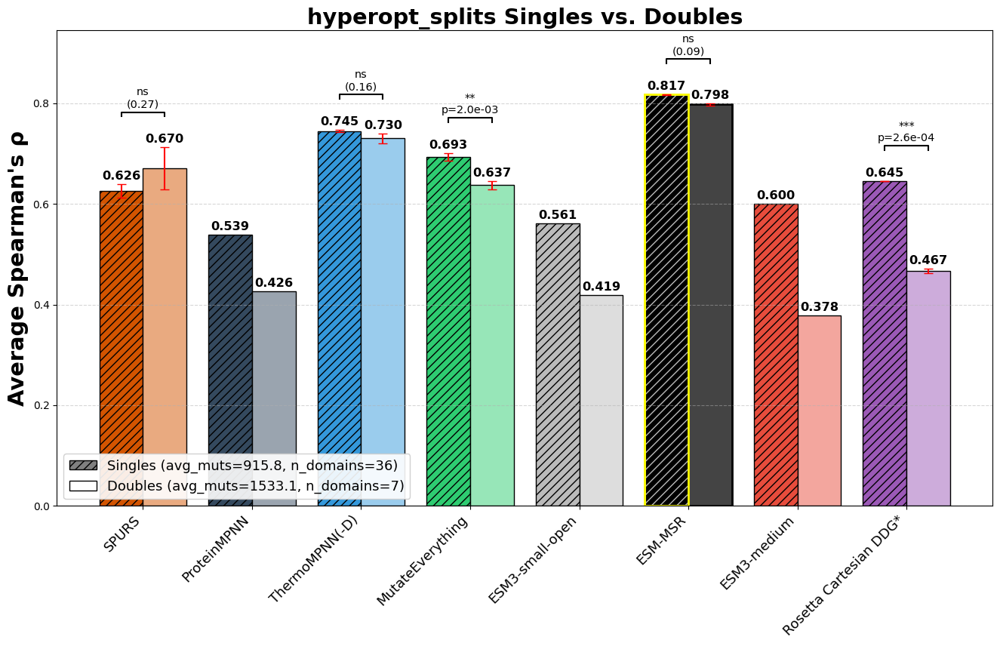

In [ ]:
analysis_utils_msr.create_metric_comparison_chart_epistatic(df_scores_singles.loc[('hyperopt_splits-test', 'grouped')], ['SPURS', 'ProteinMPNN', 'ThermoMPNN(-D)', 'MutateEverything', 'ESM3-small-open', 'ESM-MSR', 'ESM3-medium', 'Rosetta Cartesian DDG'], highlighted_model='ESM-MSR', title='hyperopt_splits Singles vs. Doubles', y_label='Average Spearman\'s ρ',
                                             series2=df_scores_doubles.loc[('hyperopt_splits-test', 'grouped')], series_names=('Singles', 'Doubles'), fontsize_multiplier=1.3, figsize=(16,10), legend_loc='lower left') #'ESM3-small', 'ESM3-large',

(<Figure size 1600x1000 with 1 Axes>,
 <Axes: title={'center': 'hyperopt_splits Native vs. Destabilized'}, ylabel="Average Spearman's ρ">)

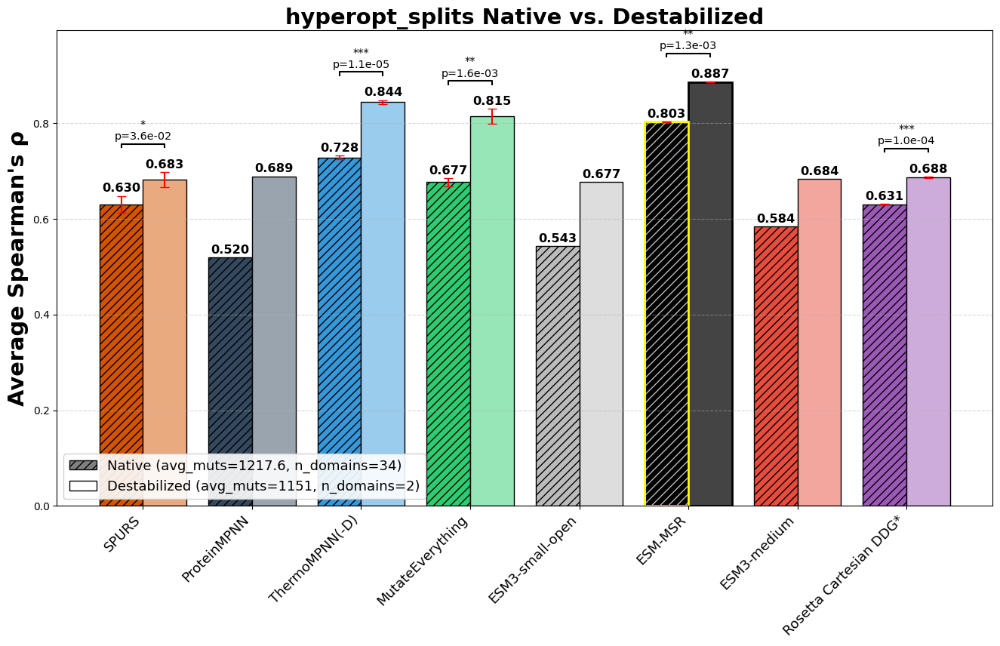

In [ ]:
analysis_utils_msr.create_metric_comparison_chart_epistatic(df_scores_no_destab.loc[('hyperopt_splits-test', 'grouped')], ['SPURS', 'ProteinMPNN', 'ThermoMPNN(-D)', 'MutateEverything', 'ESM3-small-open', 'ESM-MSR', 'ESM3-medium', 'Rosetta Cartesian DDG'], highlighted_model='ESM-MSR', title='hyperopt_splits Native vs. Destabilized', y_label='Average Spearman\'s ρ',
                                             series2=df_scores_destab.loc[('hyperopt_splits-test', 'grouped')], series_names=('Native', 'Destabilized'), fontsize_multiplier=1.3, figsize=(16,10), legend_loc='lower left')

(<Figure size 1600x1000 with 1 Axes>,
 <Axes: title={'center': 'hyperopt_splits Natural vs. Synthetic'}, ylabel="Average Spearman's ρ">)

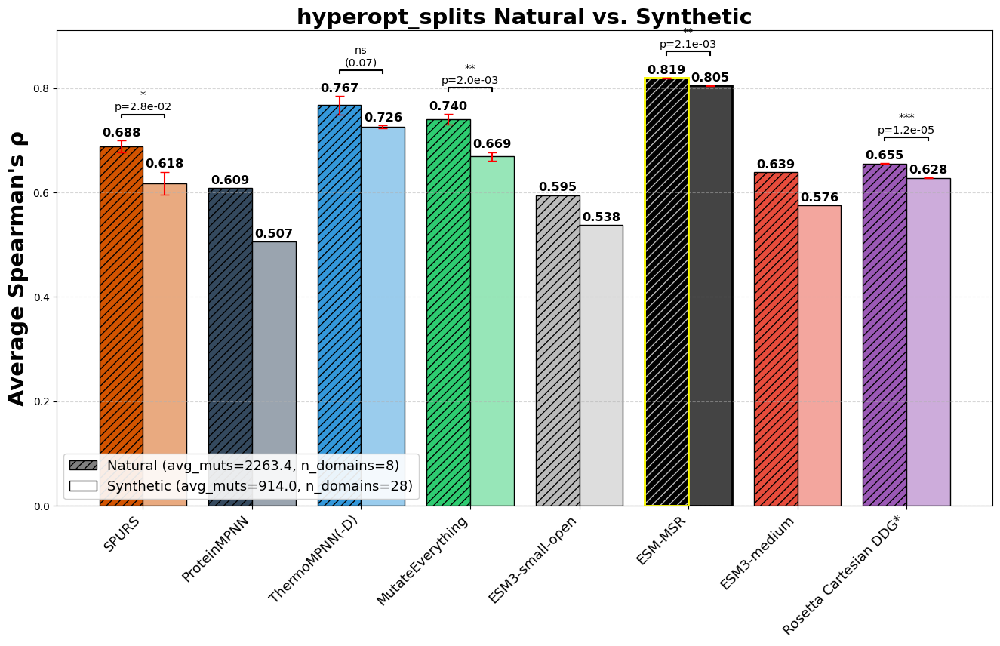

In [ ]:
analysis_utils_msr.create_metric_comparison_chart_epistatic(df_scores_natural.loc[('hyperopt_splits-test', 'grouped')], ['SPURS', 'ProteinMPNN', 'ThermoMPNN(-D)', 'MutateEverything', 'ESM3-small-open', 'ESM-MSR', 'ESM3-medium', 'Rosetta Cartesian DDG'], highlighted_model='ESM-MSR', title='hyperopt_splits Natural vs. Synthetic', y_label='Average Spearman\'s ρ',
                                             series2=df_scores_synthetic.loc[('hyperopt_splits-test', 'grouped')], series_names=('Natural', 'Synthetic'), fontsize_multiplier=1.3, figsize=(16,10), legend_loc='lower left')